In [ ]:
import cv2
import matplotlib.pyplot as plt
from IPython import display

import numpy as np
import pandas as pd

import keras
import tensorflow as tf
from keras.layers import Input, Dense, Lambda, concatenate, Dropout, Layer
from keras.models import Model
%matplotlib inline

In [ ]:
def load_horses_orig(path, image_size):   
    mask_path = path + 'masks/'
    image_path = path + 'images/'
    images = []
    masks = []
    test_images = []
    test_masks = []
    
    for i in range(328):
        
        orig_im = cv2.imread(image_path + 'image-{}.png'.format(i))
        orig_im= cv2.cvtColor(orig_im, cv2.COLOR_RGB2BGR)
        
        low_im = cv2.resize(orig_im, dsize=(image_size, image_size))

        orig_mask = cv2.imread(mask_path + 'mask-{}.png'.format(i))
        low_mask = cv2.resize(orig_mask, dsize=(image_size, image_size))
        low_mask = cv2.cvtColor(low_mask, cv2.COLOR_RGB2GRAY)
        bin_mask = (low_mask > 0) + 0
        
    
        images.append(low_im)
        masks.append(bin_mask)


    xtest = np.reshape(np.array(images[250:]), (-1,image_size*image_size*3))
    ytest = np.reshape(np.array(masks[250:]), (-1, image_size * image_size))
    xdata = np.reshape(np.array(images[:200]), (-1,image_size*image_size*3))
    ydata = np.reshape(np.array(masks[:200]), (-1, image_size * image_size))
    yval =  np.reshape(np.array(masks[200:250]), (-1, image_size * image_size))
    xval = np.reshape(np.array(images[200:250]), (-1,image_size*image_size*3))


    return xdata, xval, xtest, ydata, yval, ytest

In [ ]:
#change the path address 
path = 'C:/Users/Downloads/akarsh/data/horses/'
image_size = 32
xdata, xval, xtest, ydata, yval, ytest = load_horses_orig(path, image_size)

In [ ]:
def draw(image, mask):
  fig, (ax1,ax2) = plt.subplots(1,2) 
  ax1.axis('off')
  ax2.axis('off')
  ax1.imshow(np.reshape(image, (image_size,image_size,3)))
  ax2.imshow(np.reshape(mask, (image_size,image_size)), cmap=plt.cm.gray)
  plt.show()

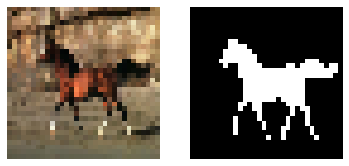

(3072,) (1024,)


In [ ]:
draw(xdata[0], ydata[0])
print(xdata[0].shape, ydata[0].shape)

In [ ]:
train_size = xdata.shape[0]
batch_size = 64
train_dataset = (tf.data.Dataset.from_tensor_slices(np.hstack((xdata, ydata)))
                 .shuffle(train_size).batch(batch_size))

The intersection over union (IOU) is a metric for measuring the performance of image segmentation. The perfect segmentation receives IOU of one.

In [ ]:
# Do not change this cell
def iou(ytrue, yprediction):
    yp = yprediction
    yt = ytrue
    yp = yp > 0.5 + 0
    intersect = np.sum(np.minimum(yp, yt),1)
    union = np.sum(np.maximum(yp, yt),1)
    return np.average(intersect / (union+0.0))

In [ ]:
assert iou(ydata, ydata) == 1.0

In [ ]:
# network parameters
n_hidden, z_dim = 1024, 2

# sampling function
class Sampling(Layer):
    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

# encoder
x = Input(shape=(xdata.shape[1:]))
condition = Input(shape=(ydata.shape[1],))
inputs = concatenate([x, condition])
x1 = Dense(n_hidden, activation='relu')(inputs)
x1 = Dropout(0.3)(x1)
x1 = Dense(n_hidden//2, activation='relu')(x1)
x1 = Dropout(0.2)(x1)
x1 = Dense(n_hidden//4, activation='relu')(x1)
x1 = Dropout(0.1)(x1)
mu = Dense(z_dim, activation='linear')(x1)
log_var = Dense(z_dim, activation='linear')(x1)
z = Sampling()([mu, log_var])
encoder = Model([x, condition], [mu, log_var, z], name="encoder")
encoder.summary()

# decoder
decoder_input = Input(shape=(z.shape[1],))
condition = Input(shape=(ydata.shape[1],))
z_cond = concatenate([decoder_input, condition])
y = Dense(n_hidden//4, activation='relu')(z_cond)
y = Dropout(0.3)(y)
y = Dense(n_hidden//2, activation='relu')(y)
y = Dropout(0.2)(y)
y = Dense(n_hidden, activation='relu')(y)
y = Dropout(0.1)(y)
y = Dense(ydata.shape[1], activation='sigmoid')(y)
decoder = Model([decoder_input, condition], y, name="decoder")
decoder.summary()

# building the conditional VAE model
class CVAE(tf.keras.Model):

    def __init__(self, latent_dim, encoder, decoder):
        super(CVAE, self).__init__()
        self.optimizer = tf.keras.optimizers.Adam(1e-4)
        self.latent_dim = latent_dim
        self.encoder = encoder
        self.decoder = decoder
    
    # train function with the x being the training images and y being training labels
    def train_step(self, x, y):
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder([x, y])
            reconstruction = decoder([z, y])
            reconstruction_loss = tf.reduce_mean(keras.losses.binary_crossentropy(y, reconstruction))
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            total_loss = reconstruction_loss + kl_loss
            
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        
        # elbo = reconstruction loss or negative log likelihood probability + KL divergence loss
        return {"elbo": total_loss, "reconstruction_loss": reconstruction_loss, "kl_loss": kl_loss,}
    
    def predict(self, x, y):
        mu, var, z = encoder([x, y])
        y = decoder([z, y])
        return y.numpy()

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 3072)]       0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 1024)]       0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 4096)         0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
dense (Dense)                   (None, 1024)         4195328     concatenate[0][0]          

Epoch 509, Loss: 0.0335, IOU - Train: 0.997 Test: 0.762


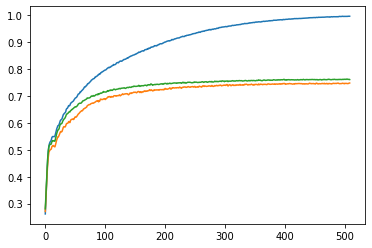

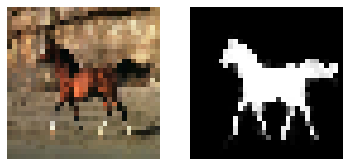

Epoch 510, Loss: 0.035, IOU - Train: 0.997 Test: 0.762


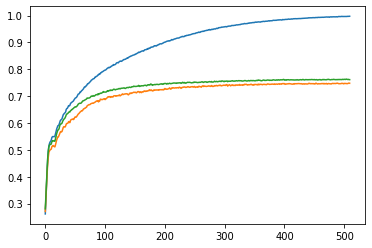

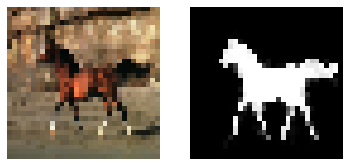

Epoch 511, Loss: 0.0342, IOU - Train: 0.997 Test: 0.762


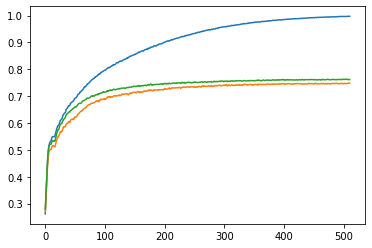

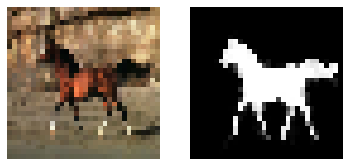

Epoch 512, Loss: 0.0365, IOU - Train: 0.997 Test: 0.762


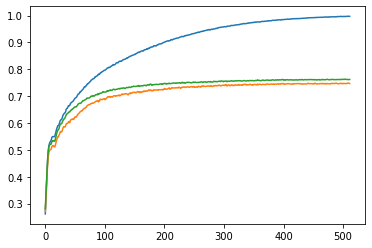

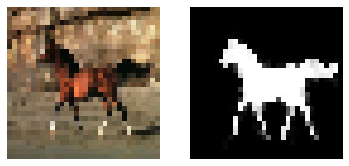

Epoch 513, Loss: 0.036, IOU - Train: 0.997 Test: 0.762


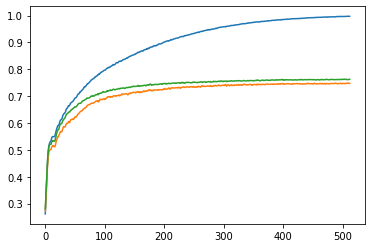

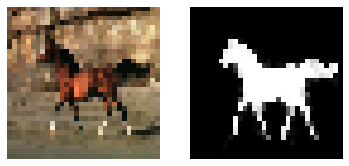

Epoch 514, Loss: 0.0335, IOU - Train: 0.997 Test: 0.762


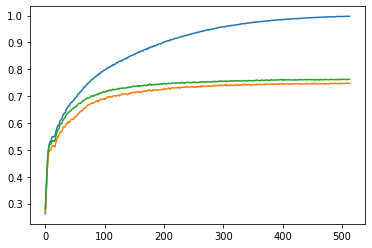

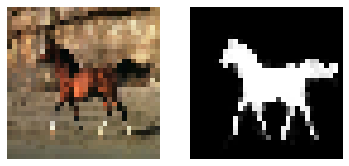

Epoch 515, Loss: 0.0351, IOU - Train: 0.997 Test: 0.762


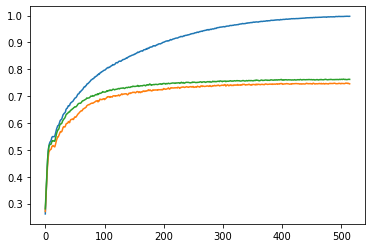

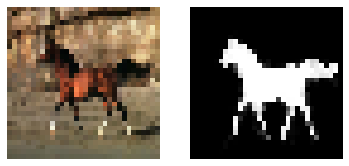

Epoch 516, Loss: 0.0351, IOU - Train: 0.997 Test: 0.762


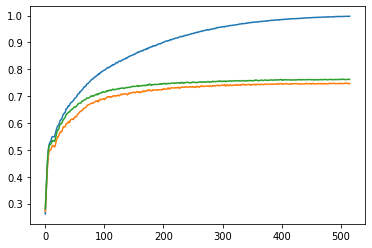

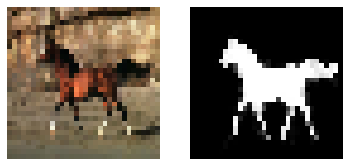

Epoch 517, Loss: 0.0351, IOU - Train: 0.997 Test: 0.762


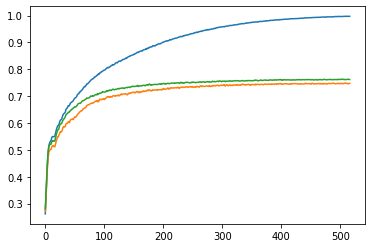

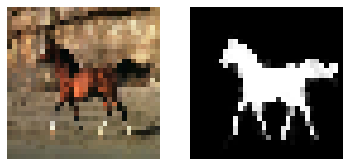

Epoch 518, Loss: 0.0331, IOU - Train: 0.997 Test: 0.762


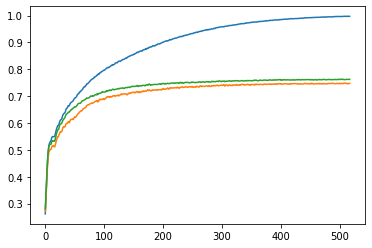

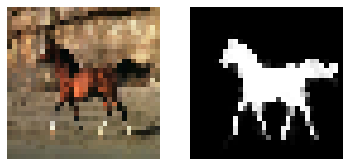

Epoch 519, Loss: 0.0329, IOU - Train: 0.997 Test: 0.762


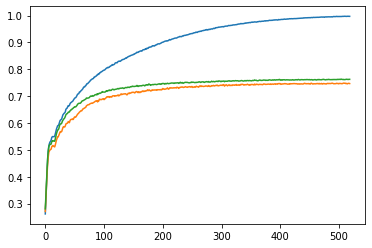

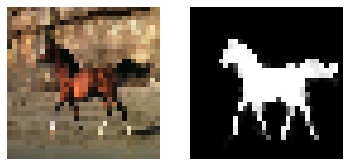

Epoch 520, Loss: 0.0322, IOU - Train: 0.997 Test: 0.762


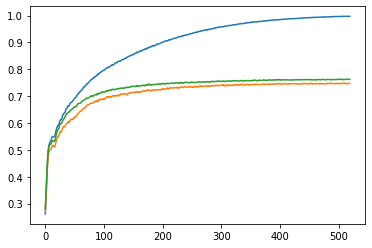

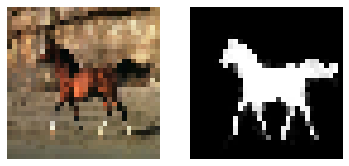

Epoch 521, Loss: 0.0338, IOU - Train: 0.997 Test: 0.762


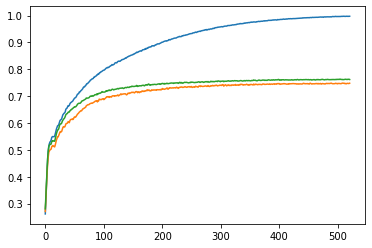

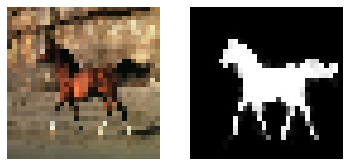

Epoch 522, Loss: 0.0321, IOU - Train: 0.997 Test: 0.762


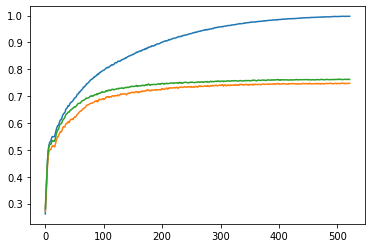

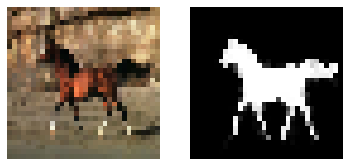

Epoch 523, Loss: 0.0327, IOU - Train: 0.997 Test: 0.762


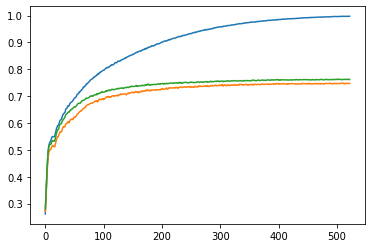

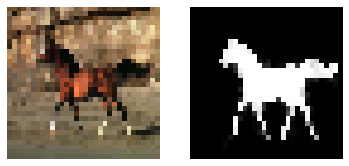

Epoch 524, Loss: 0.0335, IOU - Train: 0.998 Test: 0.762


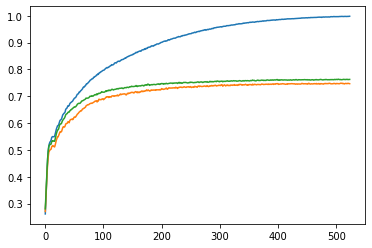

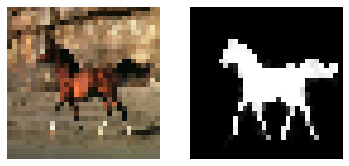

Epoch 525, Loss: 0.0319, IOU - Train: 0.998 Test: 0.762


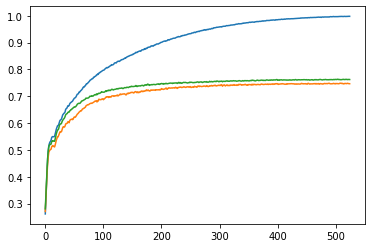

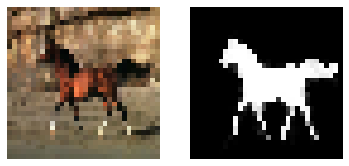

Epoch 526, Loss: 0.0319, IOU - Train: 0.997 Test: 0.762


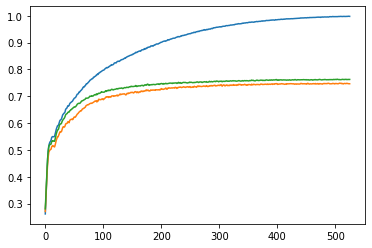

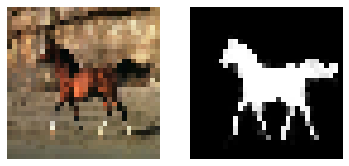

Epoch 527, Loss: 0.0329, IOU - Train: 0.998 Test: 0.762


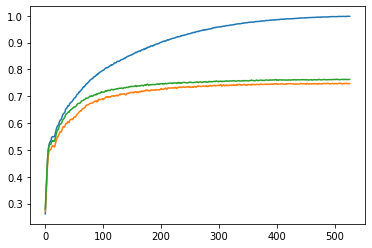

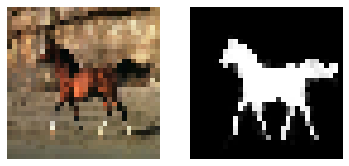

Epoch 528, Loss: 0.0312, IOU - Train: 0.998 Test: 0.762


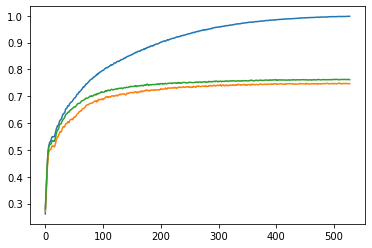

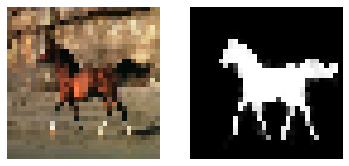

Epoch 529, Loss: 0.0312, IOU - Train: 0.998 Test: 0.762


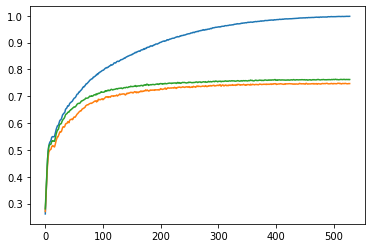

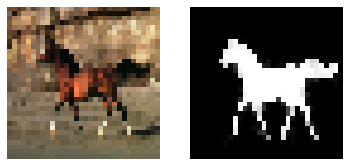

Epoch 530, Loss: 0.0317, IOU - Train: 0.998 Test: 0.762


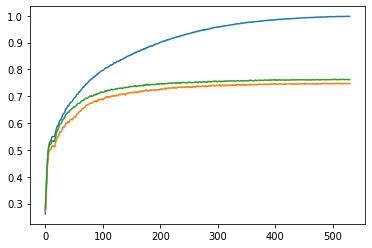

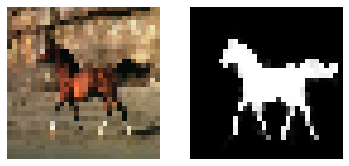

Epoch 531, Loss: 0.0314, IOU - Train: 0.998 Test: 0.762


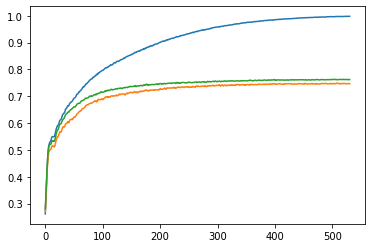

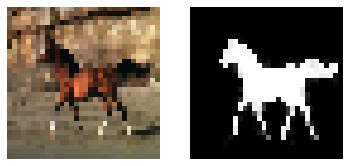

Epoch 532, Loss: 0.0333, IOU - Train: 0.998 Test: 0.762


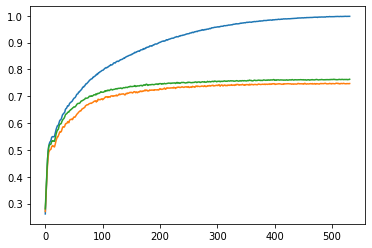

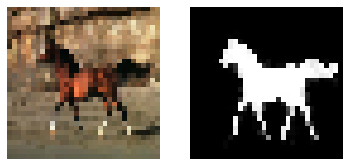

Epoch 533, Loss: 0.0315, IOU - Train: 0.998 Test: 0.762


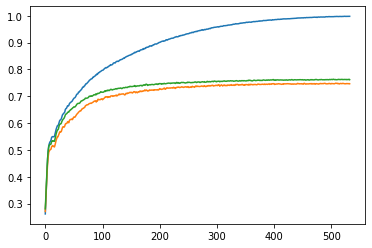

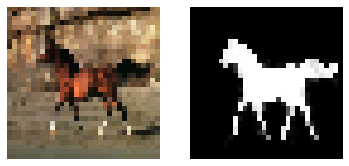

Epoch 534, Loss: 0.0286, IOU - Train: 0.998 Test: 0.762


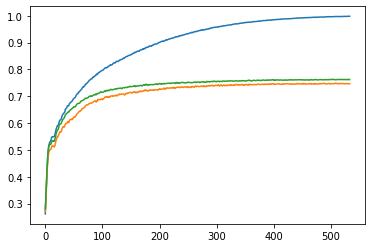

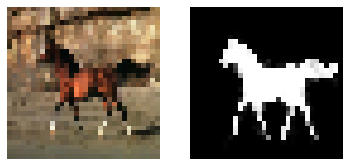

Epoch 535, Loss: 0.0313, IOU - Train: 0.998 Test: 0.762


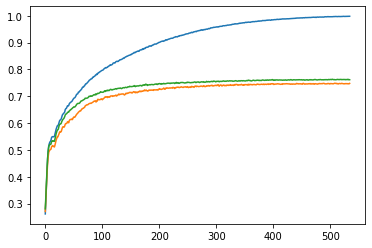

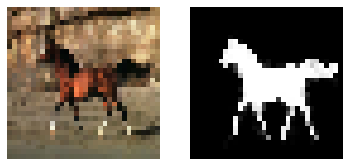

Epoch 536, Loss: 0.0319, IOU - Train: 0.998 Test: 0.762


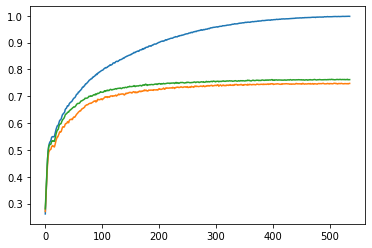

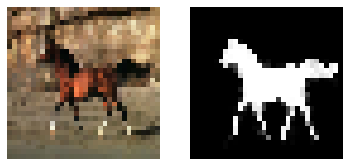

Epoch 537, Loss: 0.0339, IOU - Train: 0.998 Test: 0.762


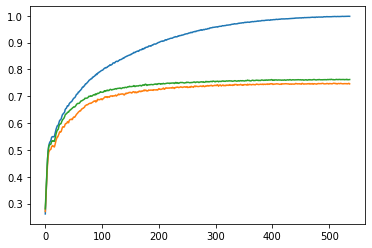

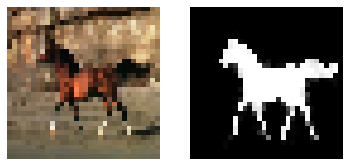

Epoch 538, Loss: 0.0305, IOU - Train: 0.998 Test: 0.762


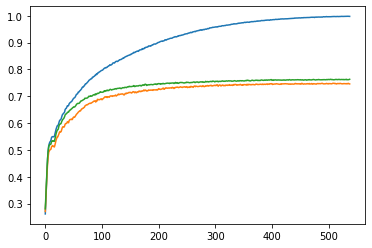

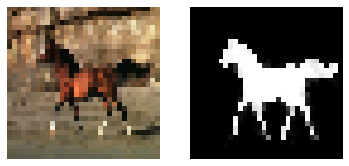

Epoch 539, Loss: 0.0335, IOU - Train: 0.998 Test: 0.762


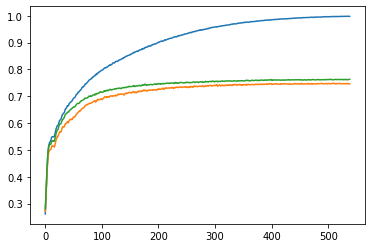

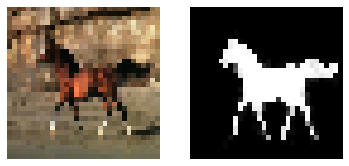

Epoch 540, Loss: 0.0291, IOU - Train: 0.998 Test: 0.762


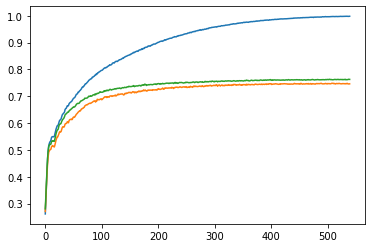

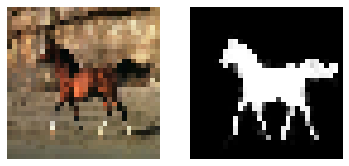

Epoch 541, Loss: 0.0313, IOU - Train: 0.998 Test: 0.762


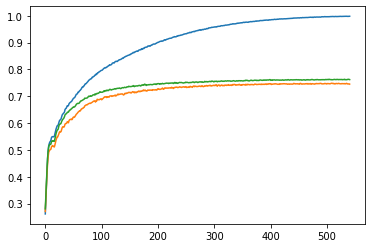

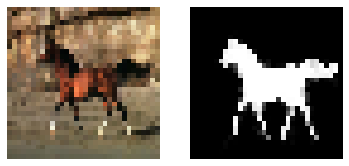

Epoch 542, Loss: 0.0303, IOU - Train: 0.999 Test: 0.762


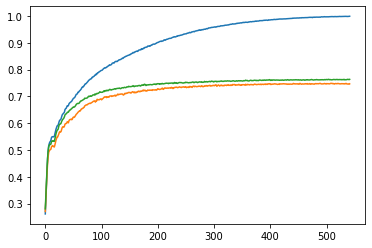

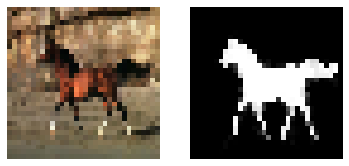

Epoch 543, Loss: 0.0295, IOU - Train: 0.998 Test: 0.762


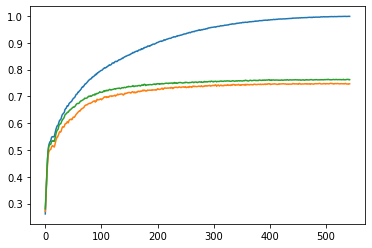

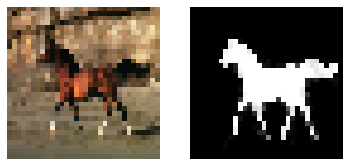

Epoch 544, Loss: 0.0309, IOU - Train: 0.998 Test: 0.762


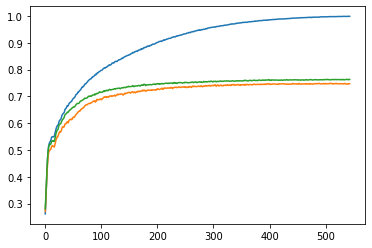

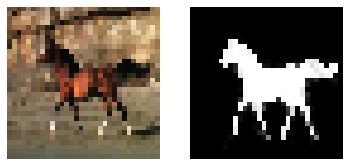

Epoch 545, Loss: 0.0295, IOU - Train: 0.998 Test: 0.762


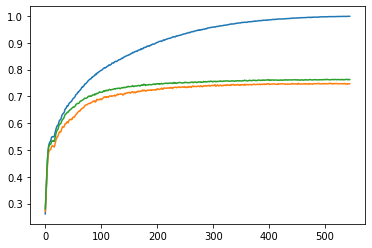

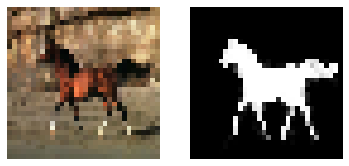

Epoch 546, Loss: 0.0281, IOU - Train: 0.998 Test: 0.762


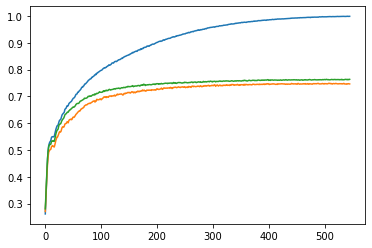

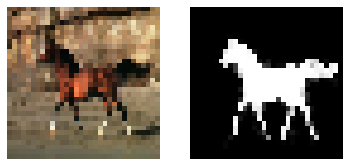

Epoch 547, Loss: 0.0289, IOU - Train: 0.999 Test: 0.762


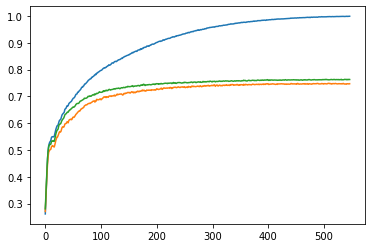

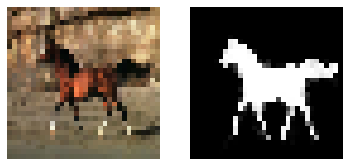

Epoch 548, Loss: 0.0285, IOU - Train: 0.999 Test: 0.762


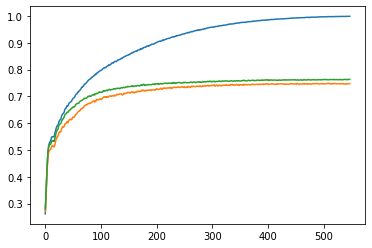

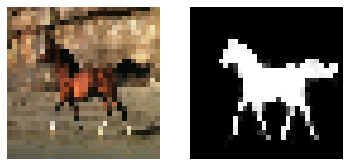

Epoch 549, Loss: 0.0263, IOU - Train: 0.999 Test: 0.762


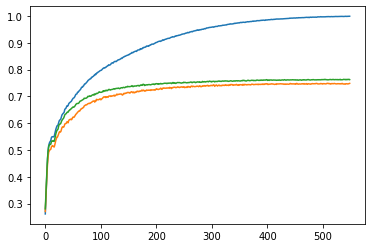

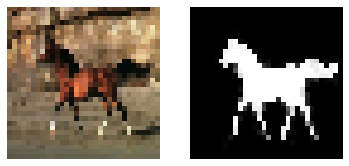

Epoch 550, Loss: 0.0279, IOU - Train: 0.999 Test: 0.762


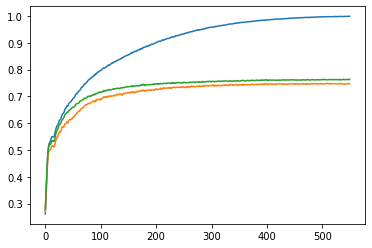

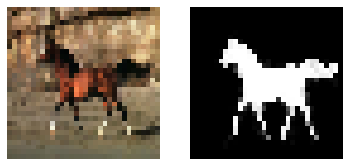

Epoch 551, Loss: 0.0272, IOU - Train: 0.998 Test: 0.762


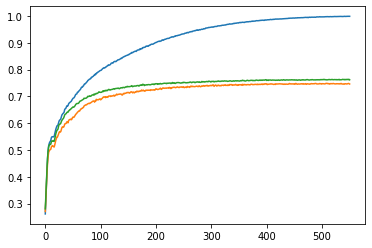

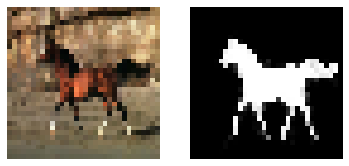

Epoch 552, Loss: 0.0284, IOU - Train: 0.999 Test: 0.762


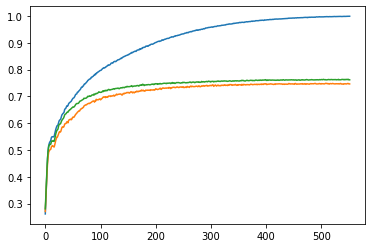

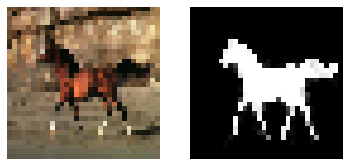

Epoch 553, Loss: 0.0273, IOU - Train: 0.998 Test: 0.762


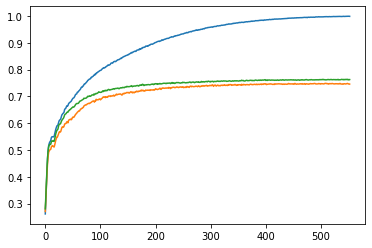

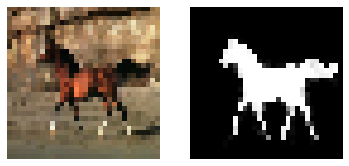

Epoch 554, Loss: 0.0263, IOU - Train: 0.999 Test: 0.762


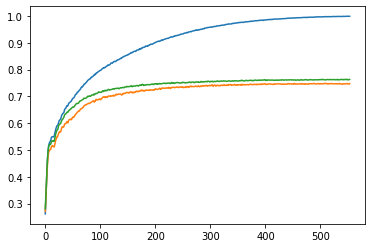

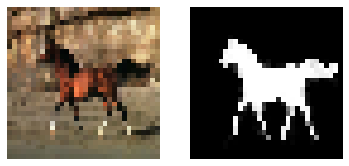

Epoch 555, Loss: 0.026, IOU - Train: 0.999 Test: 0.762


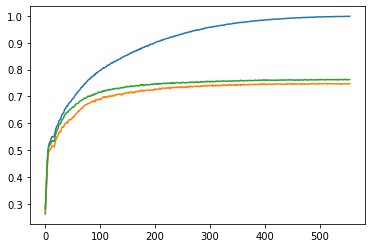

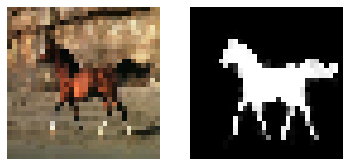

Epoch 556, Loss: 0.0289, IOU - Train: 0.999 Test: 0.762


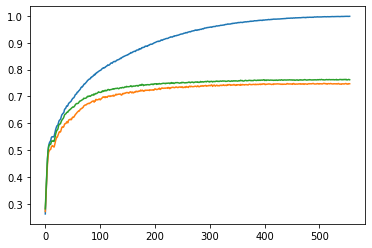

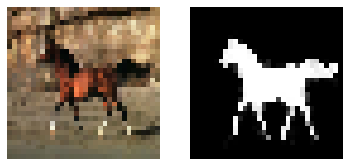

Epoch 557, Loss: 0.0255, IOU - Train: 0.999 Test: 0.762


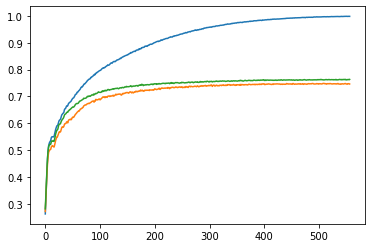

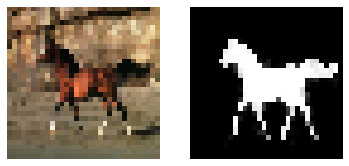

Epoch 558, Loss: 0.0272, IOU - Train: 0.999 Test: 0.762


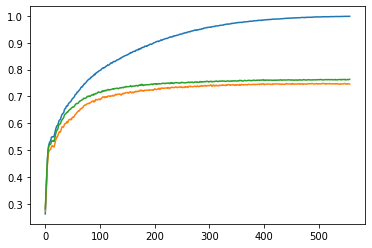

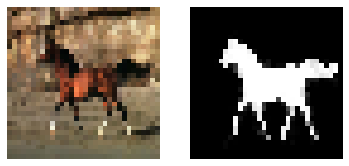

Epoch 559, Loss: 0.0262, IOU - Train: 0.999 Test: 0.762


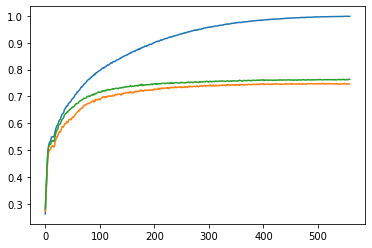

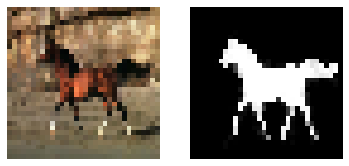

Epoch 560, Loss: 0.0261, IOU - Train: 0.999 Test: 0.762


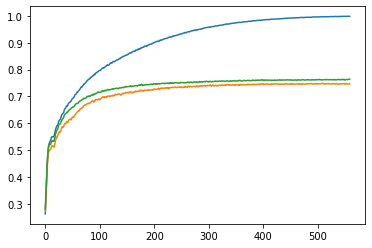

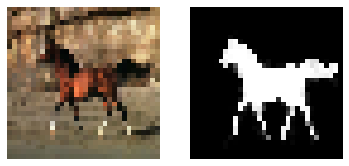

Epoch 561, Loss: 0.0254, IOU - Train: 0.999 Test: 0.762


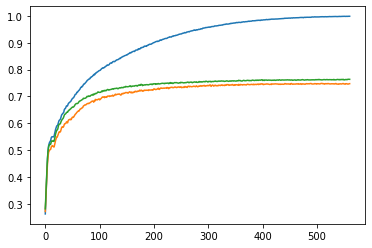

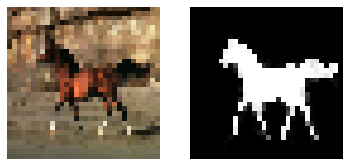

Epoch 562, Loss: 0.026, IOU - Train: 0.999 Test: 0.762


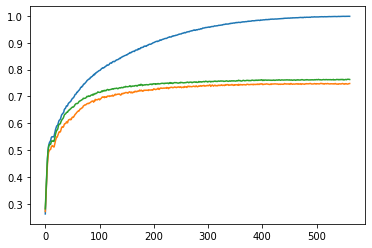

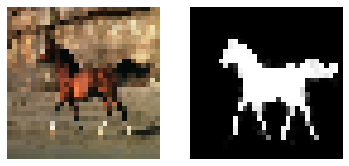

Epoch 563, Loss: 0.025, IOU - Train: 0.999 Test: 0.762


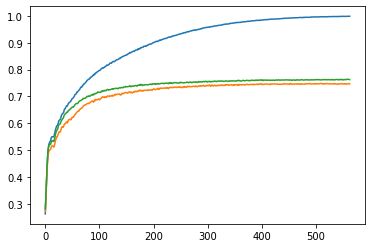

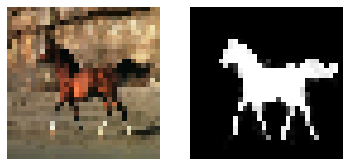

Epoch 564, Loss: 0.0265, IOU - Train: 0.999 Test: 0.762


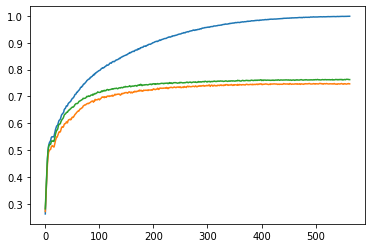

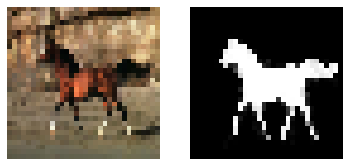

Epoch 565, Loss: 0.0259, IOU - Train: 0.999 Test: 0.762


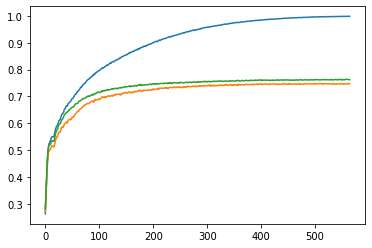

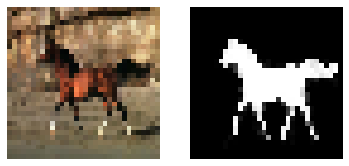

Epoch 566, Loss: 0.0235, IOU - Train: 0.999 Test: 0.762


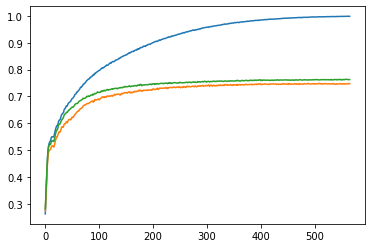

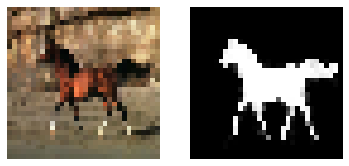

Epoch 567, Loss: 0.0251, IOU - Train: 0.999 Test: 0.762


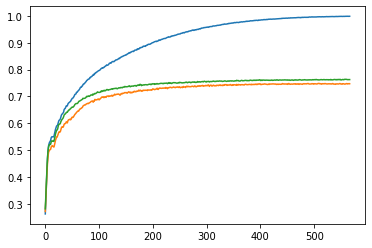

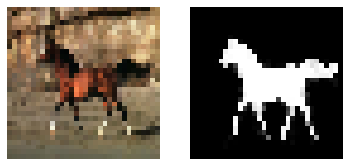

Epoch 568, Loss: 0.0242, IOU - Train: 0.999 Test: 0.762


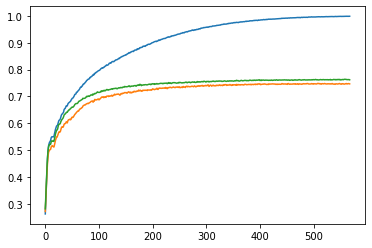

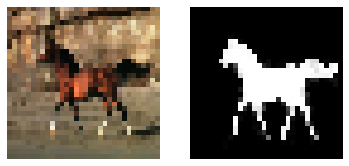

Epoch 569, Loss: 0.0237, IOU - Train: 0.999 Test: 0.762


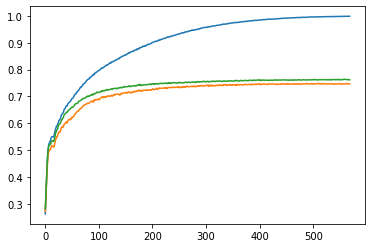

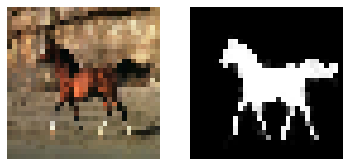

Epoch 570, Loss: 0.023, IOU - Train: 0.999 Test: 0.762


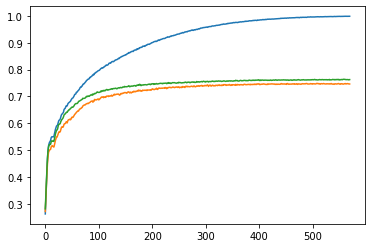

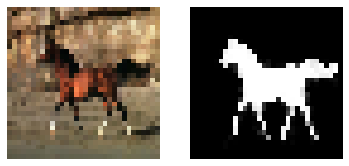

Epoch 571, Loss: 0.0243, IOU - Train: 0.999 Test: 0.762


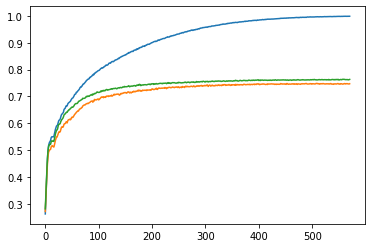

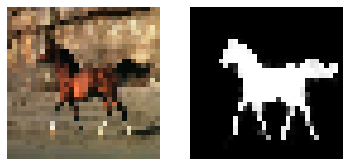

Epoch 572, Loss: 0.0241, IOU - Train: 0.999 Test: 0.762


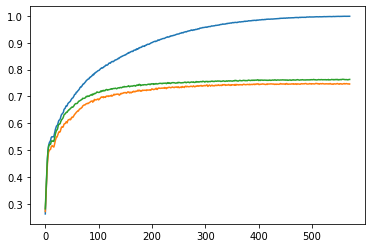

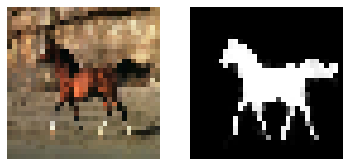

Epoch 573, Loss: 0.0251, IOU - Train: 0.999 Test: 0.762


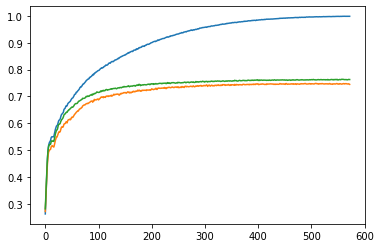

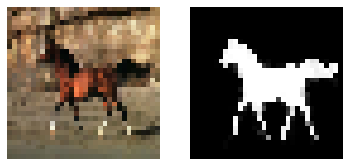

Epoch 574, Loss: 0.0234, IOU - Train: 0.999 Test: 0.762


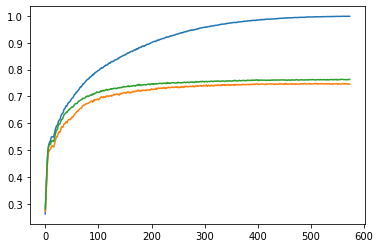

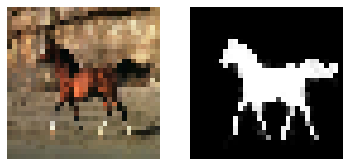

Epoch 575, Loss: 0.0246, IOU - Train: 0.999 Test: 0.762


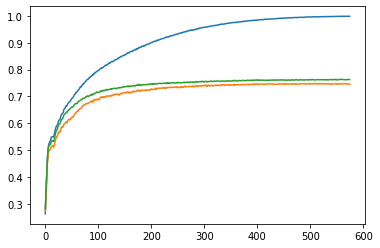

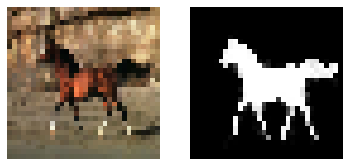

Epoch 576, Loss: 0.0233, IOU - Train: 0.999 Test: 0.762


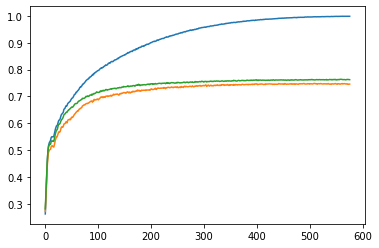

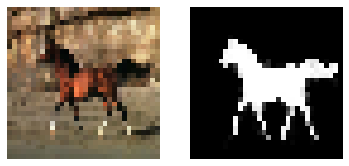

Epoch 577, Loss: 0.0239, IOU - Train: 0.999 Test: 0.762


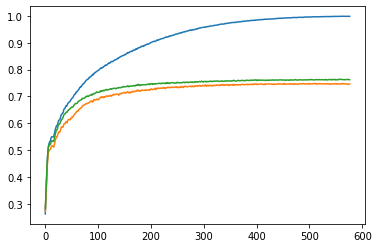

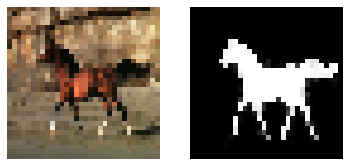

Epoch 578, Loss: 0.0233, IOU - Train: 0.999 Test: 0.762


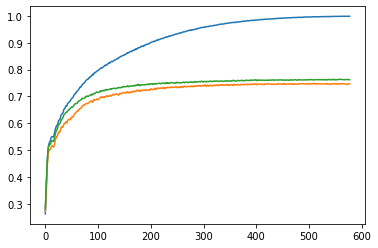

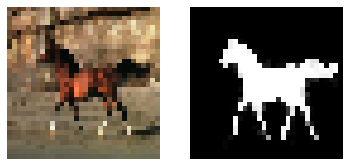

Epoch 579, Loss: 0.0226, IOU - Train: 0.999 Test: 0.762


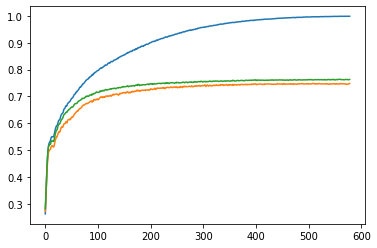

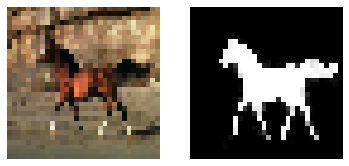

Epoch 580, Loss: 0.0225, IOU - Train: 0.999 Test: 0.762


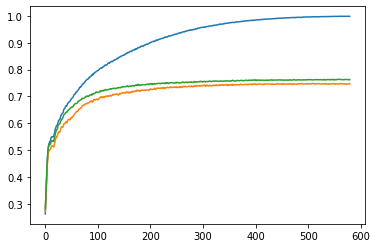

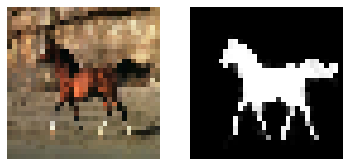

Epoch 581, Loss: 0.0233, IOU - Train: 0.999 Test: 0.762


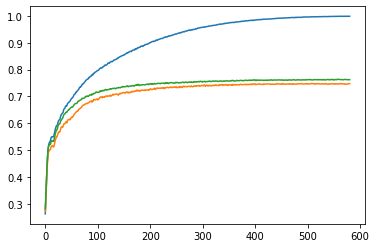

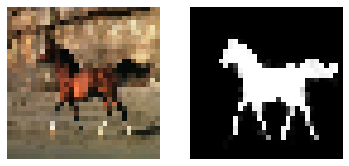

Epoch 582, Loss: 0.0241, IOU - Train: 0.999 Test: 0.762


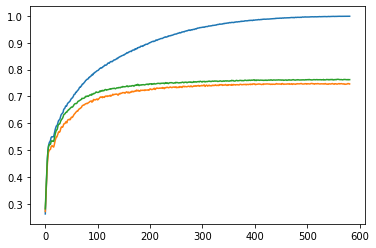

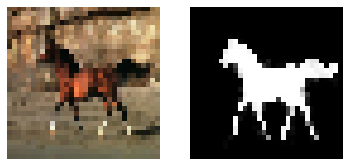

Epoch 583, Loss: 0.0239, IOU - Train: 0.999 Test: 0.762


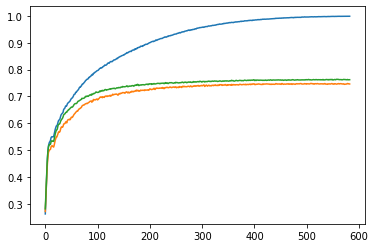

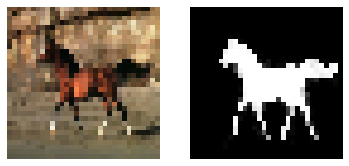

Epoch 584, Loss: 0.0229, IOU - Train: 0.999 Test: 0.762


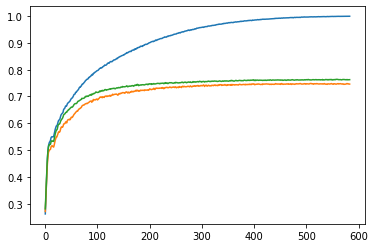

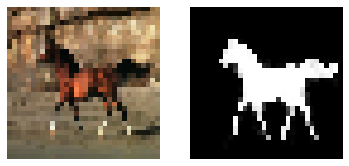

Epoch 585, Loss: 0.0221, IOU - Train: 0.999 Test: 0.762


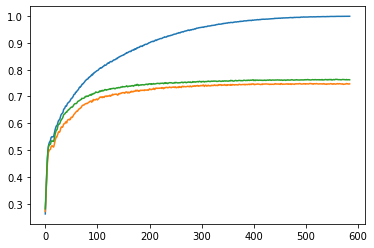

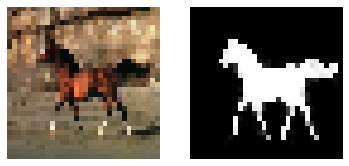

Epoch 586, Loss: 0.0229, IOU - Train: 0.999 Test: 0.762


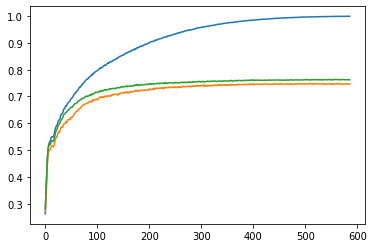

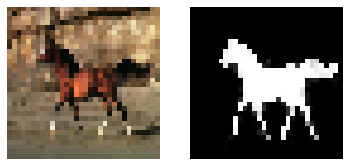

Epoch 587, Loss: 0.0218, IOU - Train: 0.999 Test: 0.762


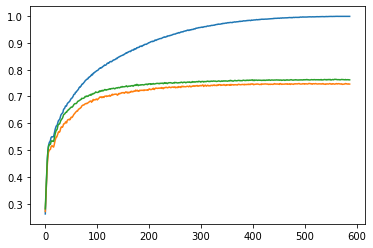

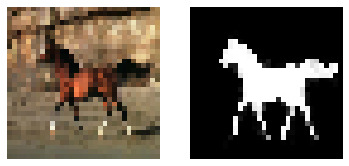

Epoch 588, Loss: 0.0218, IOU - Train: 0.999 Test: 0.762


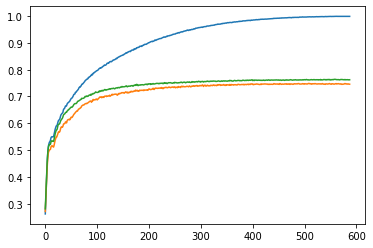

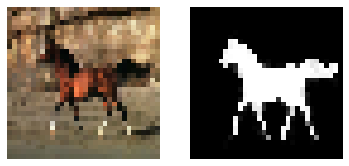

Epoch 589, Loss: 0.0212, IOU - Train: 0.999 Test: 0.762


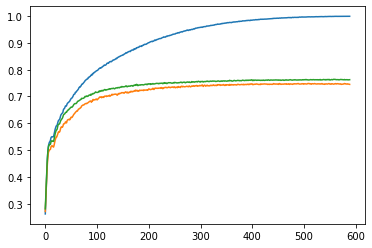

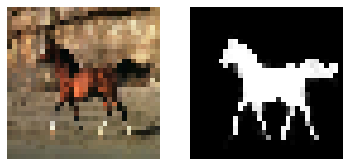

Epoch 590, Loss: 0.0206, IOU - Train: 0.999 Test: 0.762


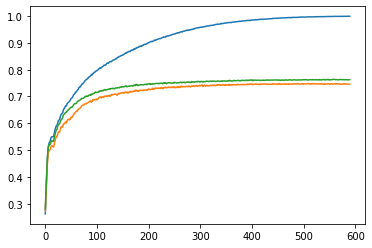

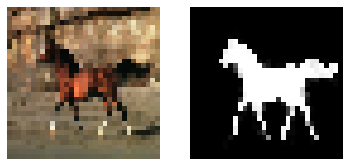

Epoch 591, Loss: 0.023, IOU - Train: 0.999 Test: 0.762


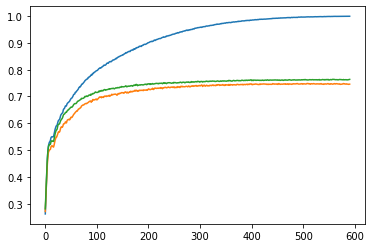

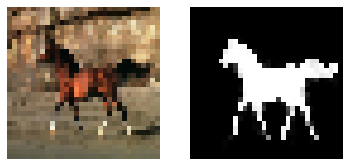

Epoch 592, Loss: 0.0214, IOU - Train: 0.999 Test: 0.762


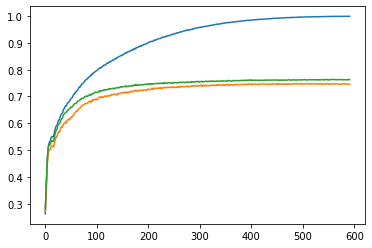

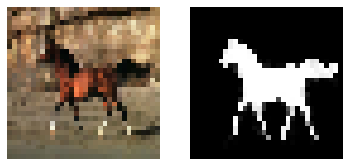

Epoch 593, Loss: 0.022, IOU - Train: 0.999 Test: 0.762


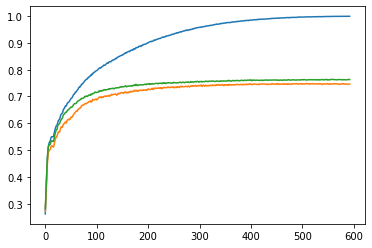

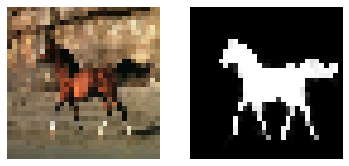

Epoch 594, Loss: 0.0201, IOU - Train: 0.999 Test: 0.762


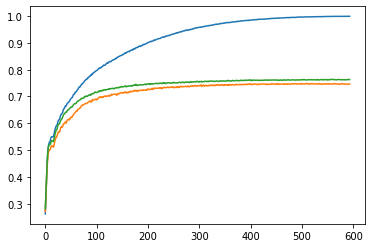

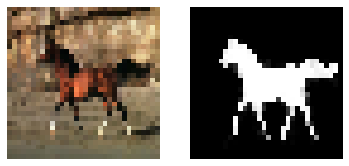

Epoch 595, Loss: 0.0208, IOU - Train: 1.0 Test: 0.762


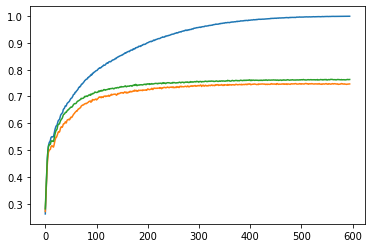

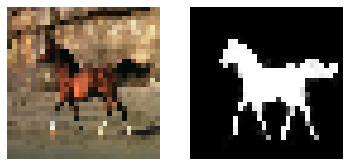

Epoch 596, Loss: 0.0198, IOU - Train: 0.999 Test: 0.762


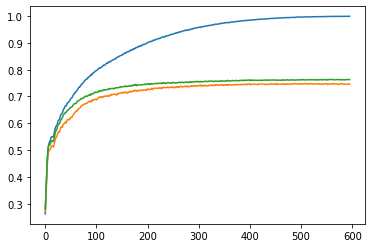

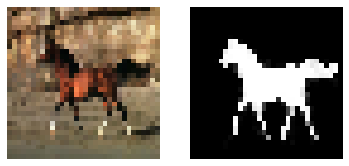

Epoch 597, Loss: 0.0213, IOU - Train: 0.999 Test: 0.762


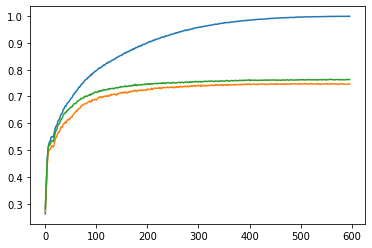

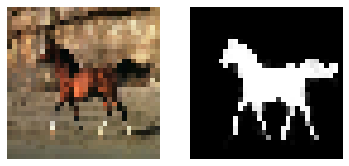

Epoch 598, Loss: 0.0205, IOU - Train: 0.999 Test: 0.762


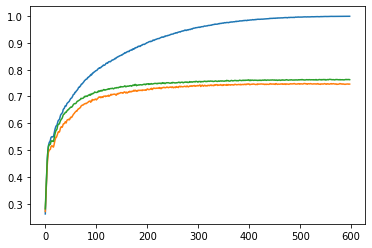

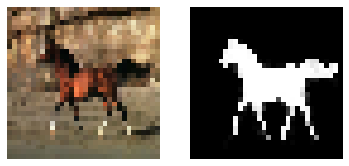

Epoch 599, Loss: 0.0211, IOU - Train: 0.999 Test: 0.762


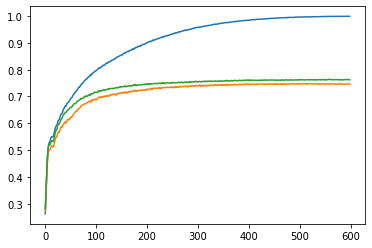

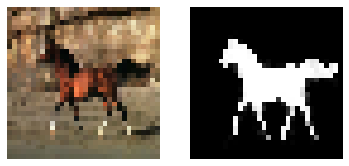

Epoch 600, Loss: 0.0198, IOU - Train: 0.999 Test: 0.762


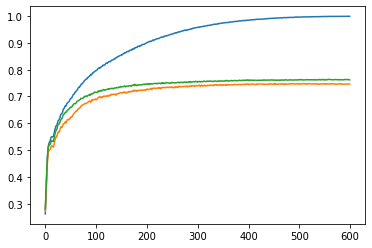

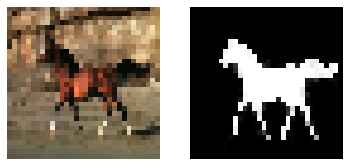

Epoch 601, Loss: 0.0219, IOU - Train: 0.999 Test: 0.762


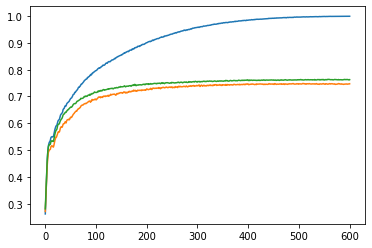

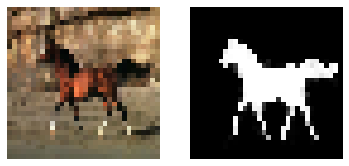

Epoch 602, Loss: 0.0209, IOU - Train: 0.999 Test: 0.762


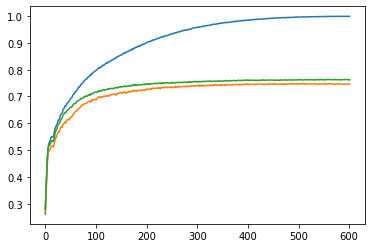

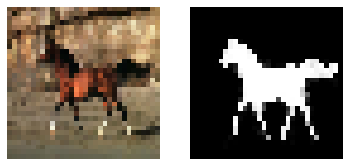

Epoch 603, Loss: 0.0195, IOU - Train: 0.999 Test: 0.762


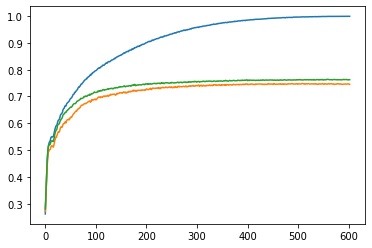

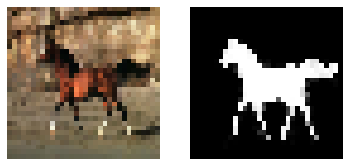

Epoch 604, Loss: 0.0198, IOU - Train: 0.999 Test: 0.762


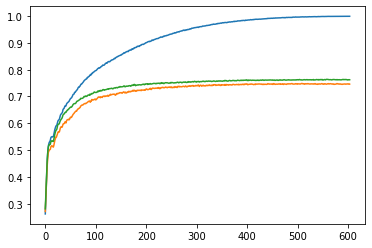

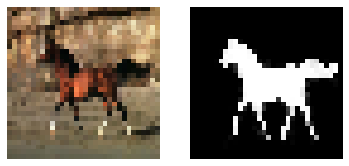

Epoch 605, Loss: 0.0206, IOU - Train: 0.999 Test: 0.762


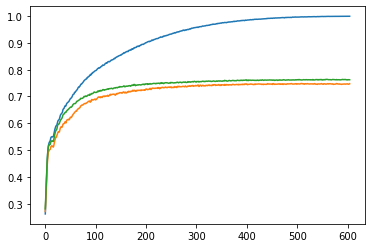

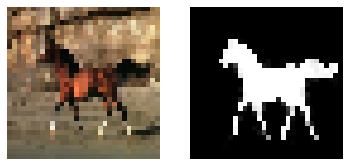

Epoch 606, Loss: 0.0198, IOU - Train: 0.999 Test: 0.762


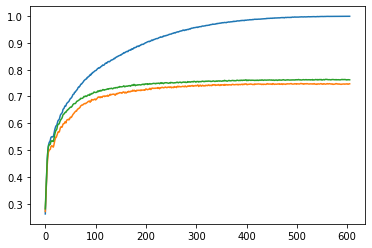

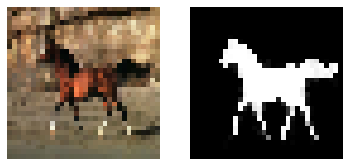

Epoch 607, Loss: 0.0195, IOU - Train: 0.999 Test: 0.762


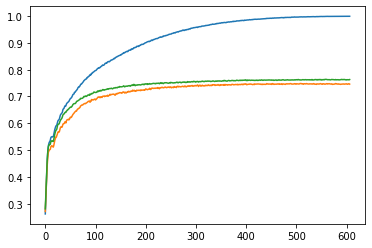

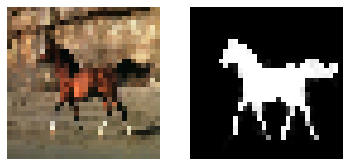

Epoch 608, Loss: 0.0197, IOU - Train: 1.0 Test: 0.762


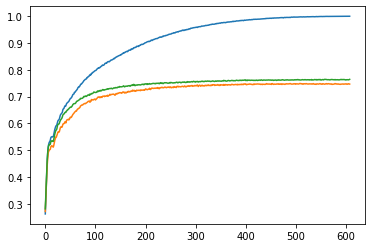

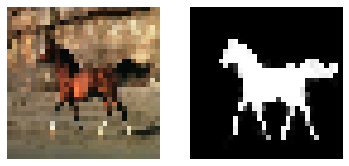

Epoch 609, Loss: 0.0196, IOU - Train: 1.0 Test: 0.762


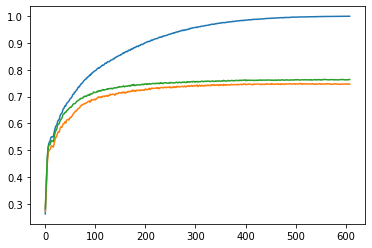

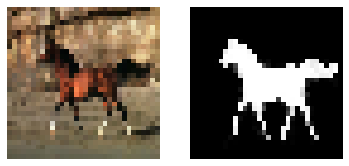

Epoch 610, Loss: 0.0194, IOU - Train: 0.999 Test: 0.762


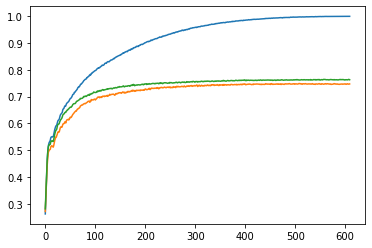

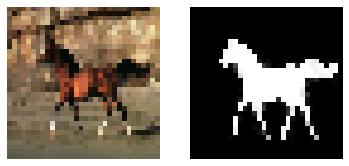

Epoch 611, Loss: 0.0195, IOU - Train: 0.999 Test: 0.762


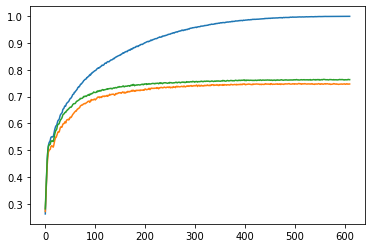

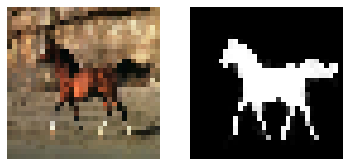

Epoch 612, Loss: 0.0178, IOU - Train: 1.0 Test: 0.762


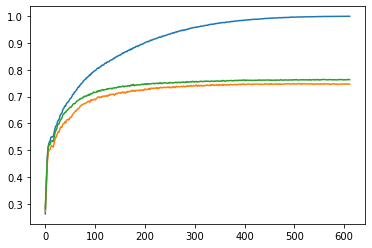

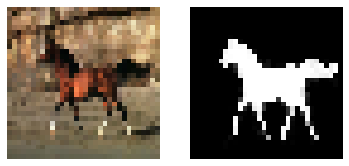

Epoch 613, Loss: 0.0179, IOU - Train: 1.0 Test: 0.762


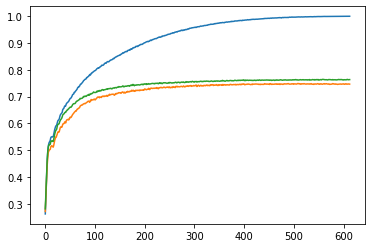

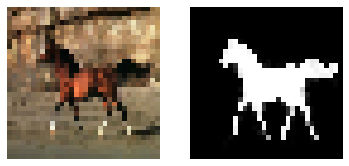

Epoch 614, Loss: 0.0184, IOU - Train: 1.0 Test: 0.762


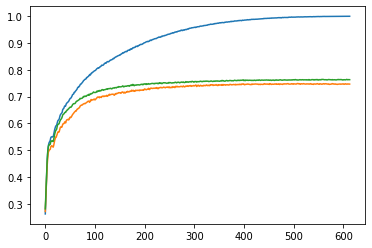

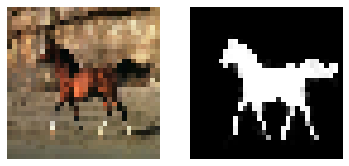

Epoch 615, Loss: 0.0196, IOU - Train: 1.0 Test: 0.762


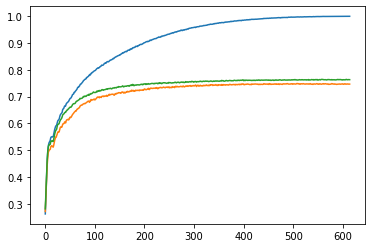

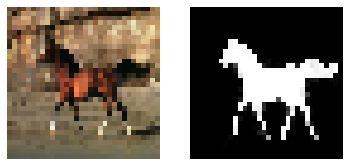

Epoch 616, Loss: 0.0182, IOU - Train: 1.0 Test: 0.762


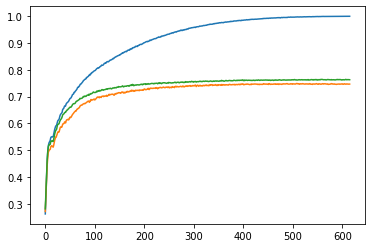

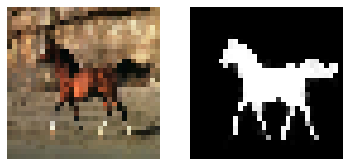

Epoch 617, Loss: 0.0199, IOU - Train: 1.0 Test: 0.762


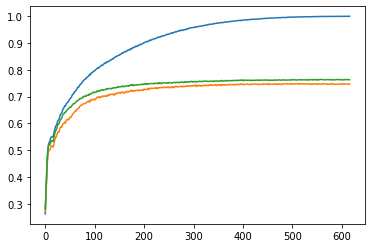

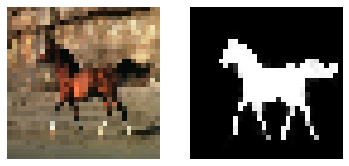

Epoch 618, Loss: 0.0178, IOU - Train: 1.0 Test: 0.762


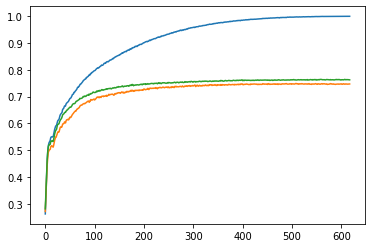

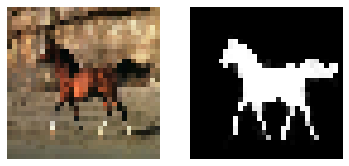

Epoch 619, Loss: 0.0182, IOU - Train: 1.0 Test: 0.762


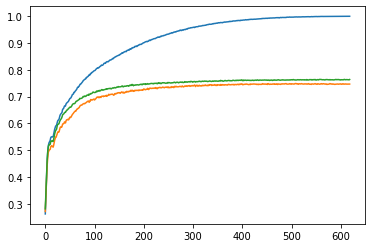

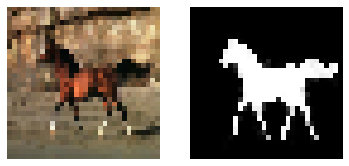

Epoch 620, Loss: 0.0177, IOU - Train: 1.0 Test: 0.762


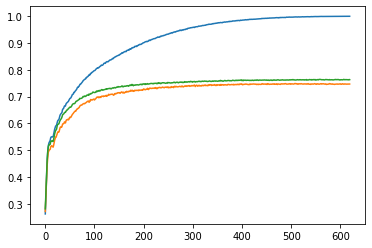

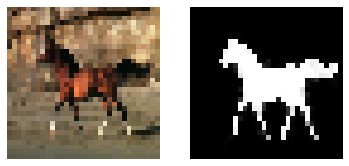

Epoch 621, Loss: 0.0179, IOU - Train: 1.0 Test: 0.762


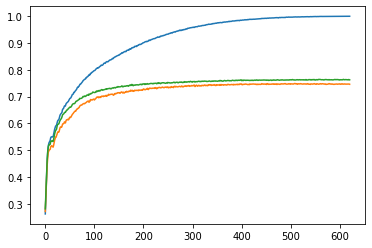

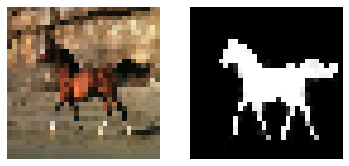

Epoch 622, Loss: 0.0179, IOU - Train: 1.0 Test: 0.762


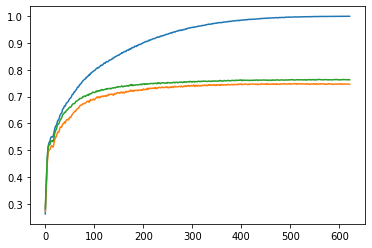

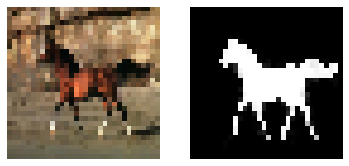

Epoch 623, Loss: 0.0169, IOU - Train: 1.0 Test: 0.762


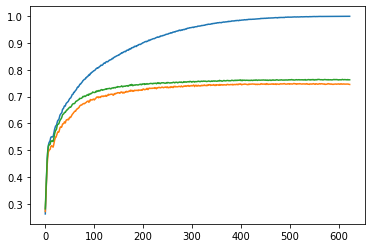

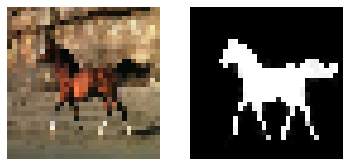

Epoch 624, Loss: 0.0161, IOU - Train: 1.0 Test: 0.762


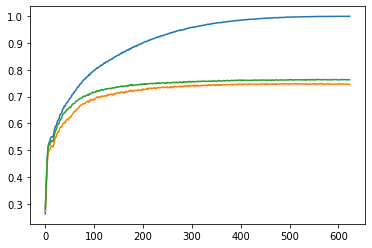

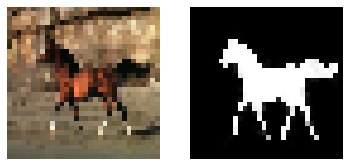

Epoch 625, Loss: 0.016, IOU - Train: 1.0 Test: 0.762


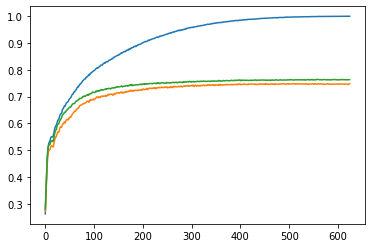

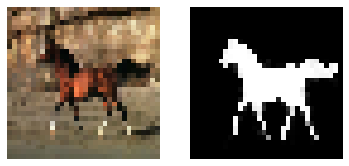

Epoch 626, Loss: 0.0158, IOU - Train: 1.0 Test: 0.762


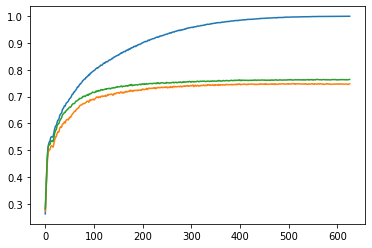

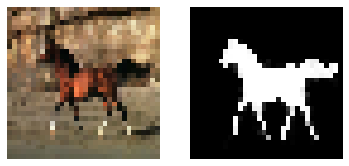

Epoch 627, Loss: 0.0162, IOU - Train: 1.0 Test: 0.762


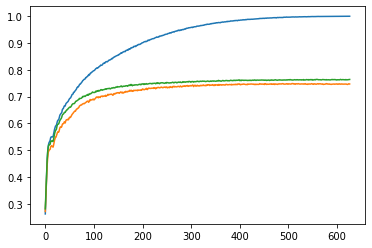

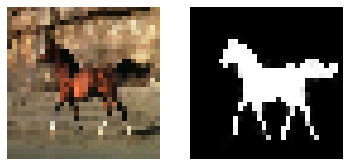

Epoch 628, Loss: 0.0167, IOU - Train: 1.0 Test: 0.762


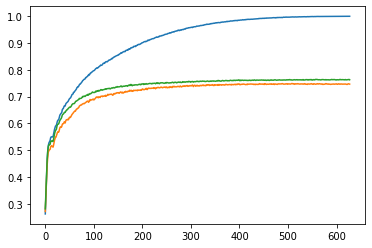

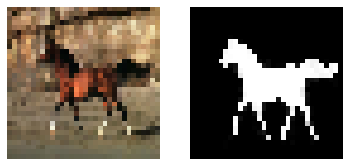

Epoch 629, Loss: 0.0175, IOU - Train: 1.0 Test: 0.762


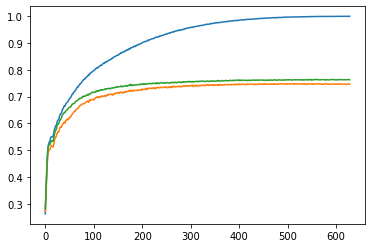

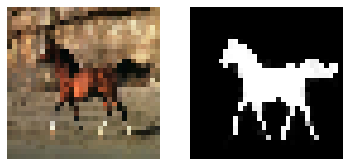

Epoch 630, Loss: 0.0169, IOU - Train: 1.0 Test: 0.762


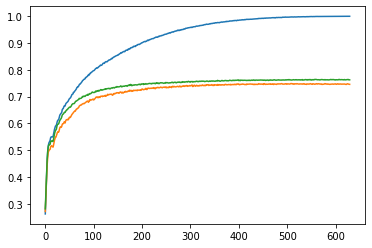

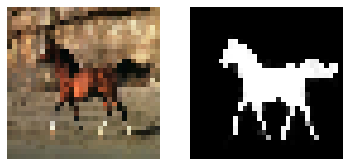

Epoch 631, Loss: 0.0169, IOU - Train: 1.0 Test: 0.762


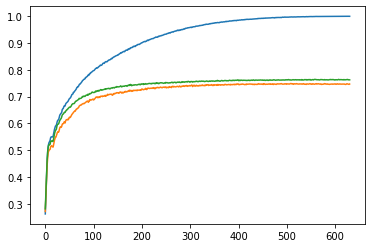

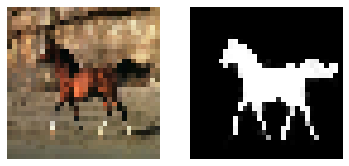

Epoch 632, Loss: 0.0166, IOU - Train: 1.0 Test: 0.762


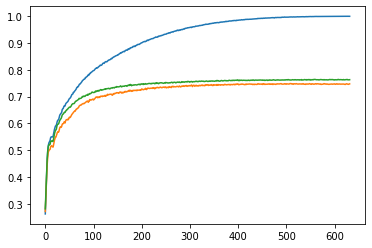

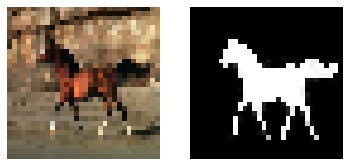

Epoch 633, Loss: 0.016, IOU - Train: 1.0 Test: 0.762


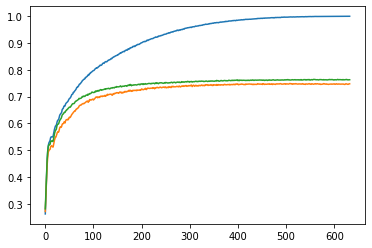

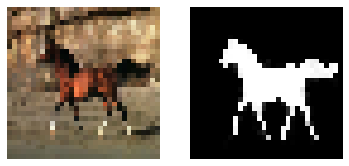

Epoch 634, Loss: 0.0164, IOU - Train: 1.0 Test: 0.762


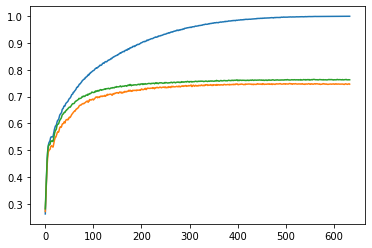

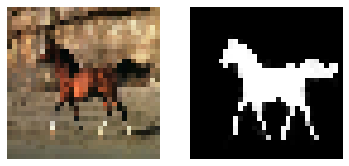

Epoch 635, Loss: 0.0156, IOU - Train: 1.0 Test: 0.762


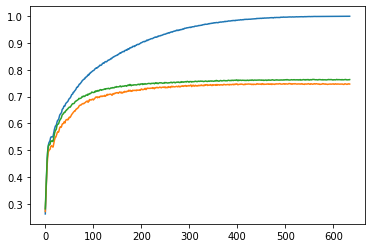

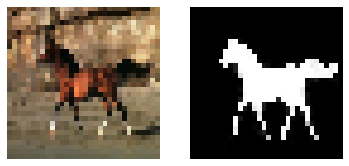

Epoch 636, Loss: 0.0169, IOU - Train: 1.0 Test: 0.762


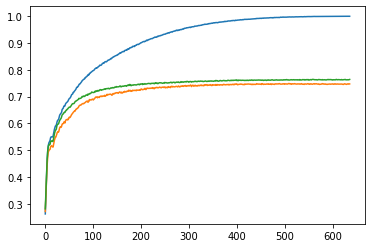

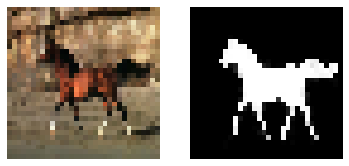

Epoch 637, Loss: 0.016, IOU - Train: 1.0 Test: 0.762


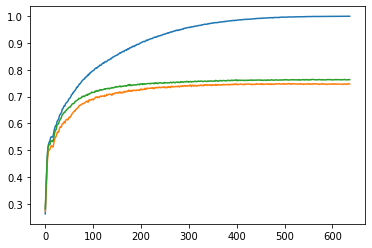

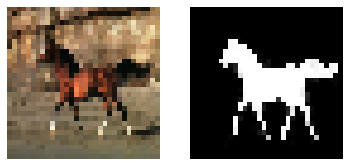

Epoch 638, Loss: 0.0171, IOU - Train: 1.0 Test: 0.762


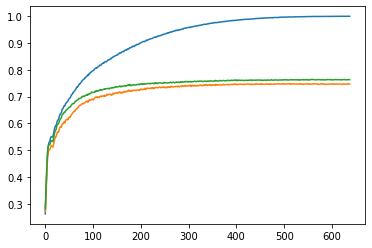

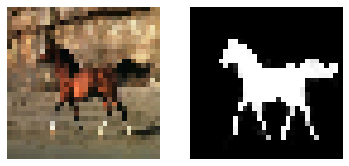

Epoch 639, Loss: 0.0164, IOU - Train: 1.0 Test: 0.762


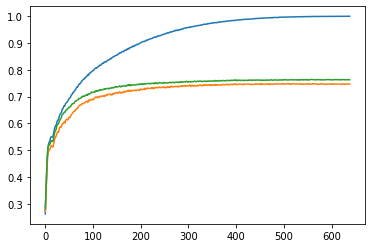

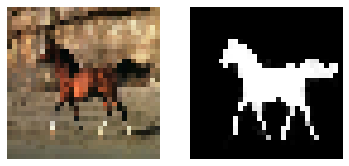

Epoch 640, Loss: 0.0151, IOU - Train: 1.0 Test: 0.762


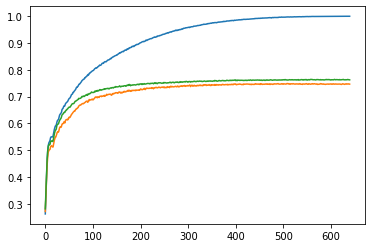

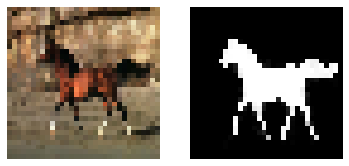

Epoch 641, Loss: 0.0156, IOU - Train: 1.0 Test: 0.762


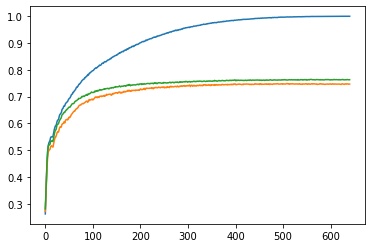

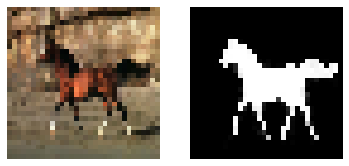

Epoch 642, Loss: 0.0157, IOU - Train: 1.0 Test: 0.762


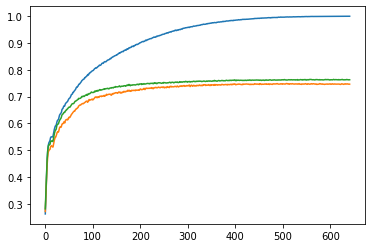

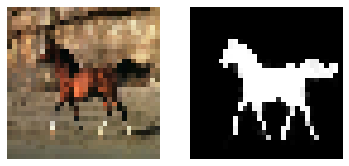

Epoch 643, Loss: 0.0154, IOU - Train: 1.0 Test: 0.762


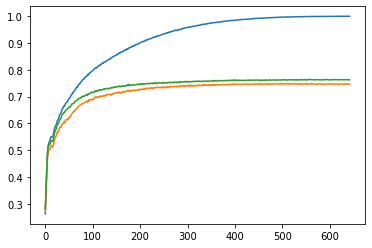

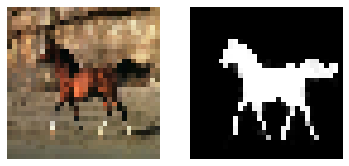

Epoch 644, Loss: 0.0144, IOU - Train: 1.0 Test: 0.762


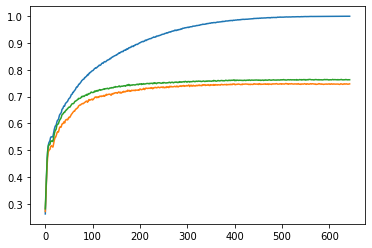

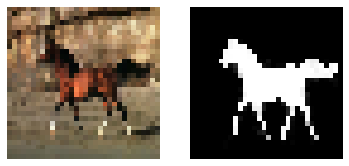

Epoch 645, Loss: 0.0154, IOU - Train: 1.0 Test: 0.762


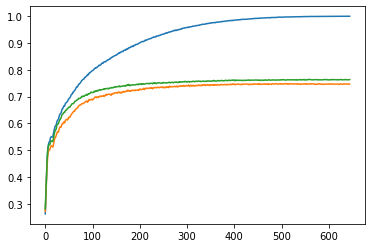

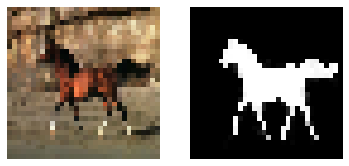

Epoch 646, Loss: 0.0156, IOU - Train: 1.0 Test: 0.762


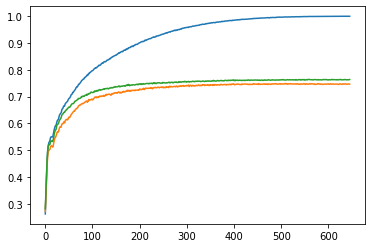

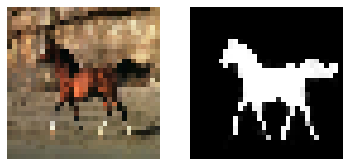

Epoch 647, Loss: 0.0155, IOU - Train: 1.0 Test: 0.762


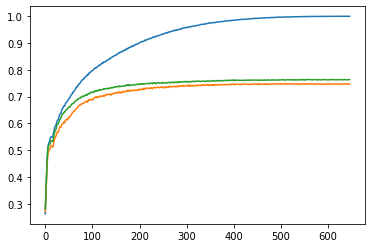

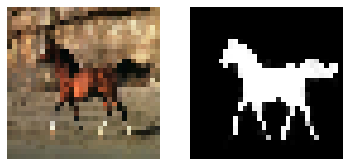

Epoch 648, Loss: 0.0148, IOU - Train: 1.0 Test: 0.762


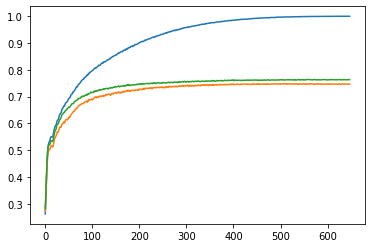

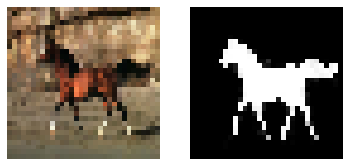

Epoch 649, Loss: 0.014, IOU - Train: 1.0 Test: 0.762


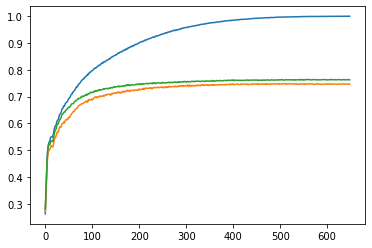

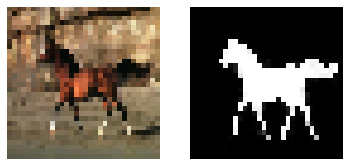

Epoch 650, Loss: 0.0167, IOU - Train: 1.0 Test: 0.762


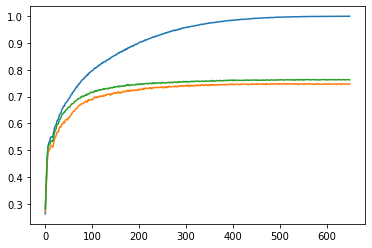

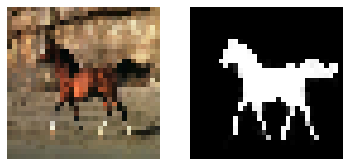

Epoch 651, Loss: 0.0145, IOU - Train: 1.0 Test: 0.762


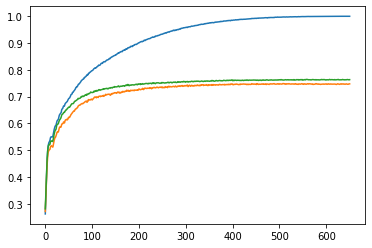

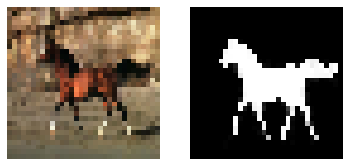

Epoch 652, Loss: 0.0148, IOU - Train: 1.0 Test: 0.762


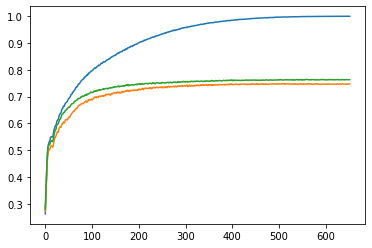

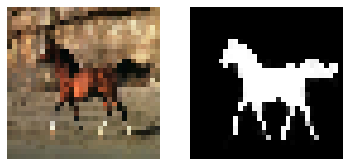

Epoch 653, Loss: 0.0152, IOU - Train: 1.0 Test: 0.762


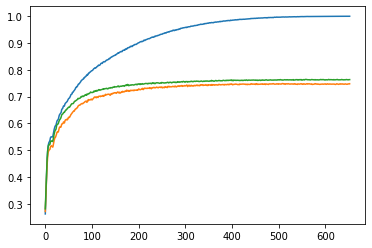

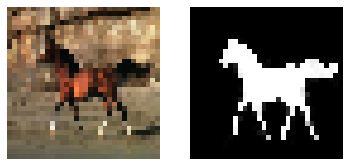

Epoch 654, Loss: 0.0152, IOU - Train: 1.0 Test: 0.762


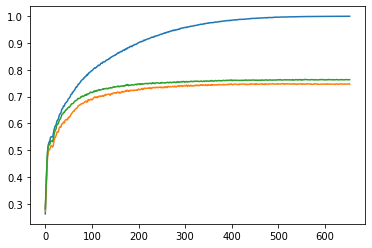

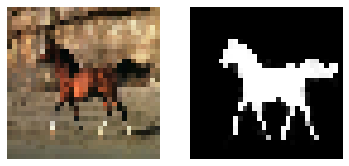

Epoch 655, Loss: 0.0147, IOU - Train: 1.0 Test: 0.762


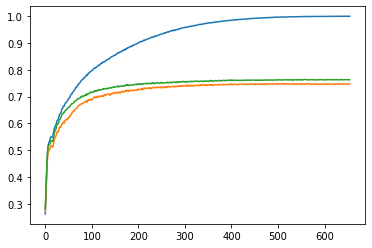

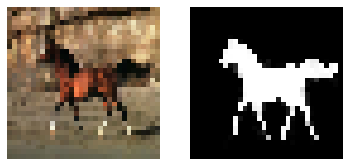

Epoch 656, Loss: 0.0139, IOU - Train: 1.0 Test: 0.762


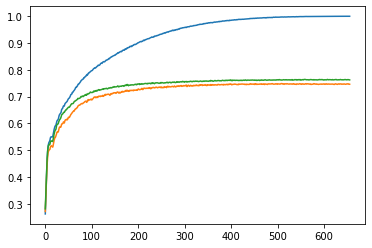

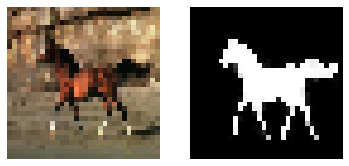

Epoch 657, Loss: 0.0144, IOU - Train: 1.0 Test: 0.762


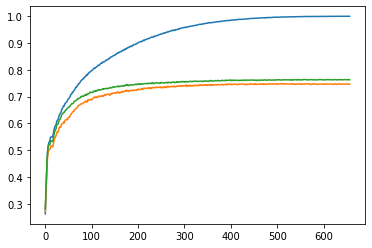

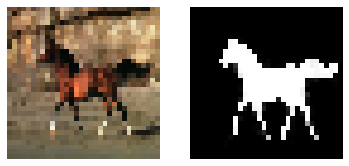

Epoch 658, Loss: 0.014, IOU - Train: 1.0 Test: 0.762


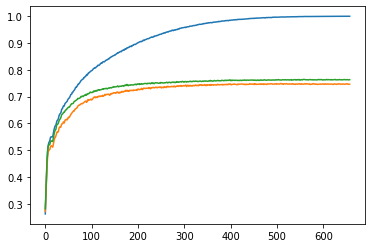

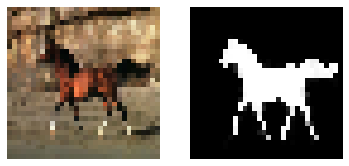

Epoch 659, Loss: 0.014, IOU - Train: 1.0 Test: 0.762


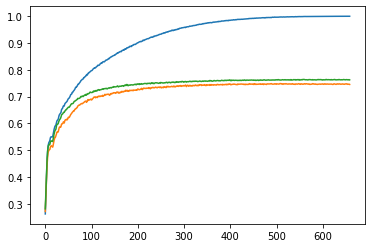

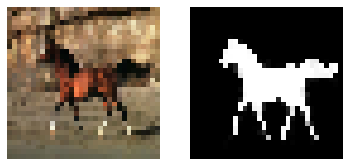

Epoch 660, Loss: 0.0136, IOU - Train: 1.0 Test: 0.762


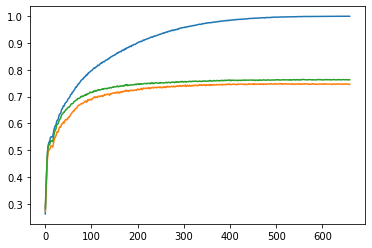

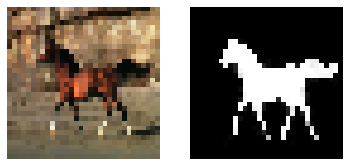

Epoch 661, Loss: 0.0142, IOU - Train: 1.0 Test: 0.762


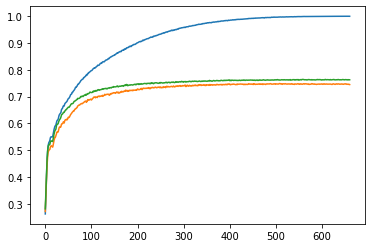

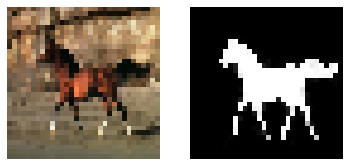

Epoch 662, Loss: 0.015, IOU - Train: 1.0 Test: 0.762


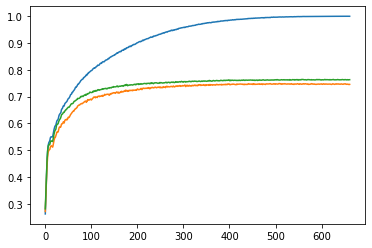

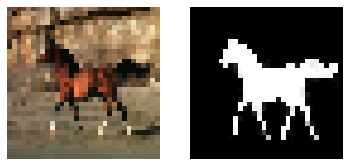

Epoch 663, Loss: 0.0141, IOU - Train: 1.0 Test: 0.762


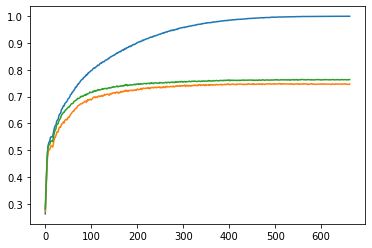

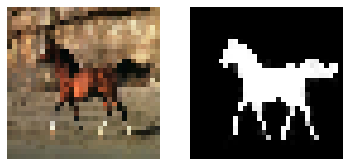

Epoch 664, Loss: 0.0138, IOU - Train: 1.0 Test: 0.762


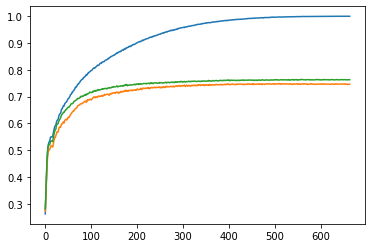

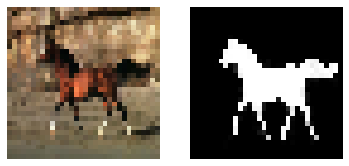

Epoch 665, Loss: 0.0146, IOU - Train: 1.0 Test: 0.762


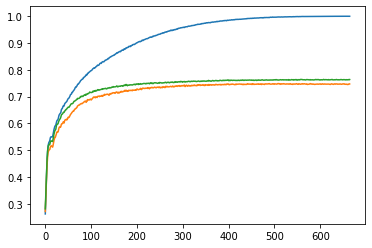

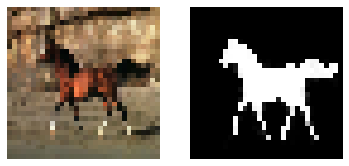

Epoch 666, Loss: 0.0127, IOU - Train: 1.0 Test: 0.762


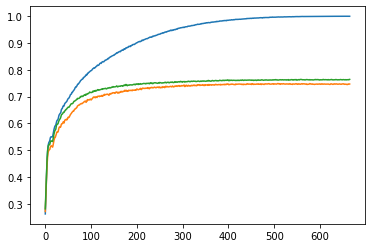

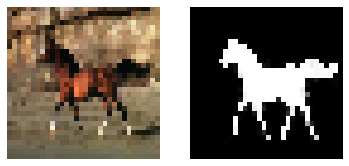

Epoch 667, Loss: 0.0142, IOU - Train: 1.0 Test: 0.762


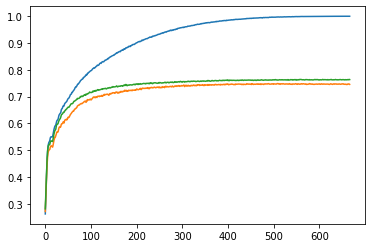

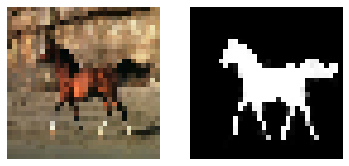

Epoch 668, Loss: 0.0137, IOU - Train: 1.0 Test: 0.762


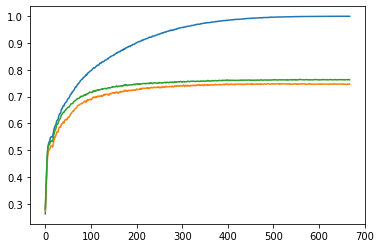

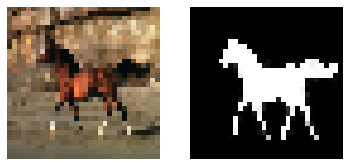

Epoch 669, Loss: 0.0148, IOU - Train: 1.0 Test: 0.762


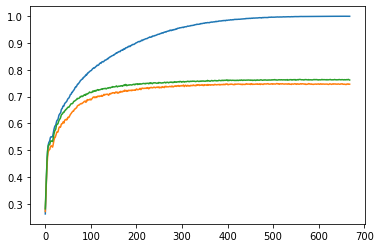

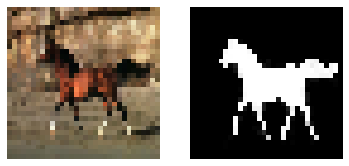

Epoch 670, Loss: 0.0129, IOU - Train: 1.0 Test: 0.762


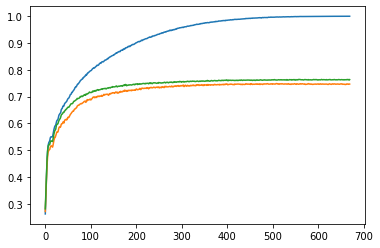

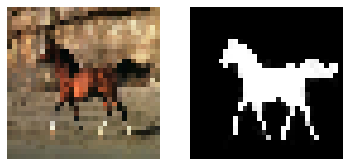

Epoch 671, Loss: 0.014, IOU - Train: 1.0 Test: 0.762


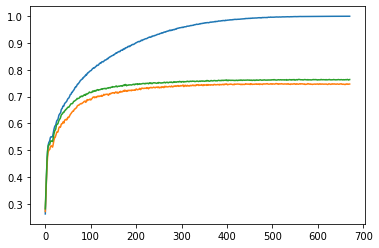

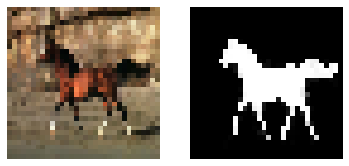

Epoch 672, Loss: 0.0134, IOU - Train: 1.0 Test: 0.762


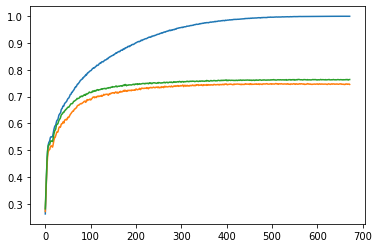

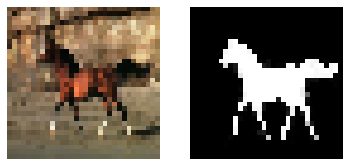

Epoch 673, Loss: 0.0131, IOU - Train: 1.0 Test: 0.762


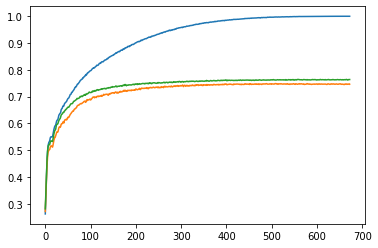

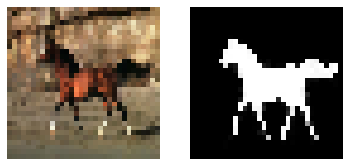

Epoch 674, Loss: 0.0129, IOU - Train: 1.0 Test: 0.762


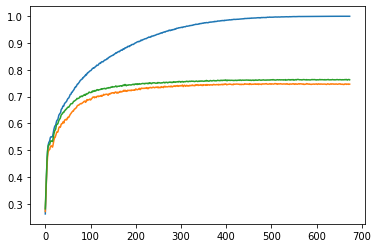

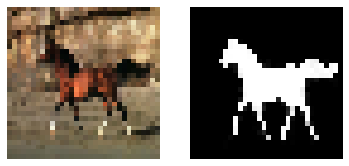

Epoch 675, Loss: 0.0121, IOU - Train: 1.0 Test: 0.762


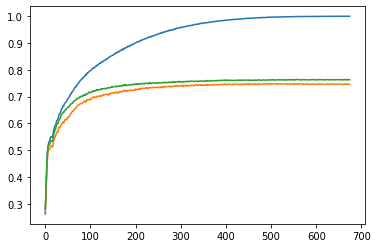

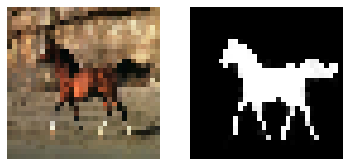

Epoch 676, Loss: 0.0126, IOU - Train: 1.0 Test: 0.762


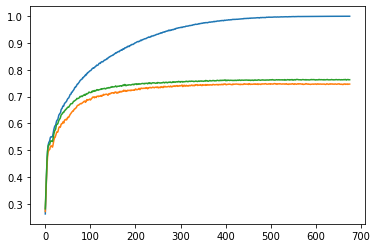

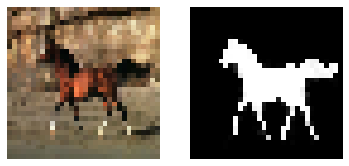

Epoch 677, Loss: 0.0121, IOU - Train: 1.0 Test: 0.762


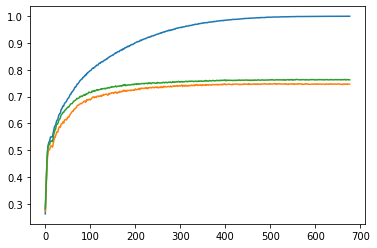

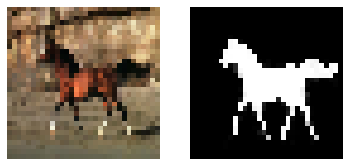

Epoch 678, Loss: 0.0133, IOU - Train: 1.0 Test: 0.762


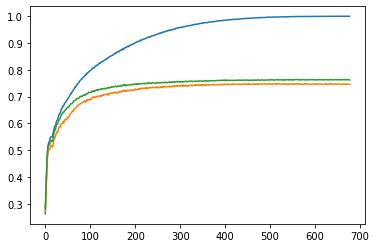

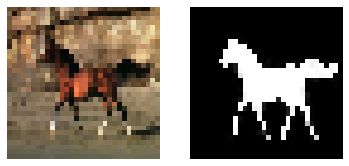

Epoch 679, Loss: 0.0116, IOU - Train: 1.0 Test: 0.762


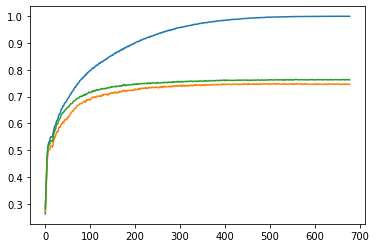

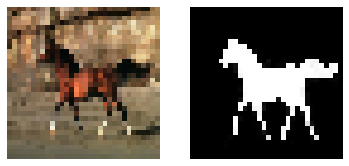

Epoch 680, Loss: 0.0129, IOU - Train: 1.0 Test: 0.762


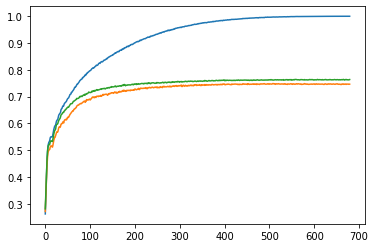

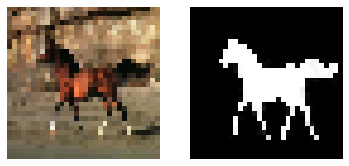

Epoch 681, Loss: 0.0126, IOU - Train: 1.0 Test: 0.762


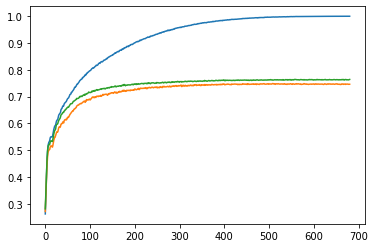

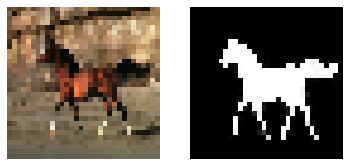

Epoch 682, Loss: 0.0119, IOU - Train: 1.0 Test: 0.762


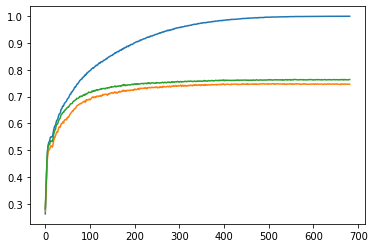

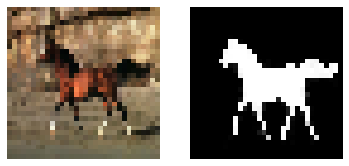

Epoch 683, Loss: 0.0127, IOU - Train: 1.0 Test: 0.762


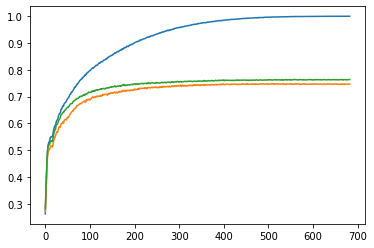

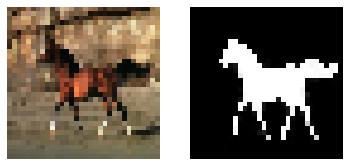

Epoch 684, Loss: 0.0117, IOU - Train: 1.0 Test: 0.762


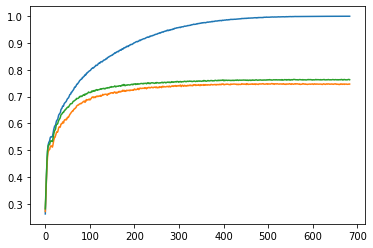

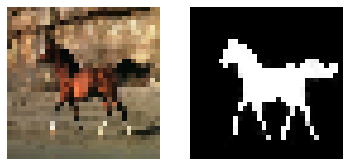

Epoch 685, Loss: 0.0116, IOU - Train: 1.0 Test: 0.762


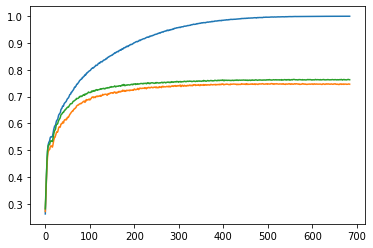

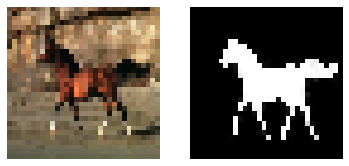

Epoch 686, Loss: 0.0118, IOU - Train: 1.0 Test: 0.762


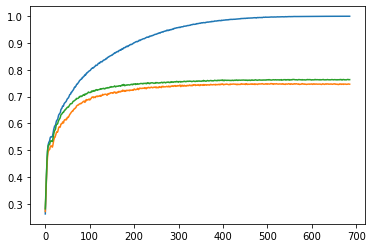

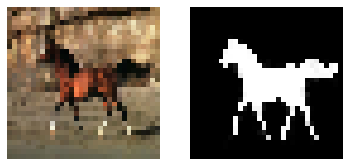

Epoch 687, Loss: 0.0126, IOU - Train: 1.0 Test: 0.762


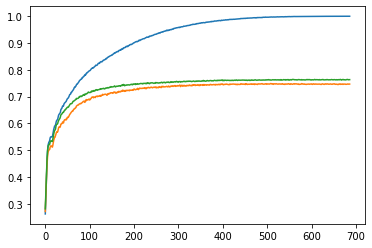

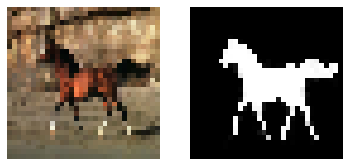

Epoch 688, Loss: 0.012, IOU - Train: 1.0 Test: 0.762


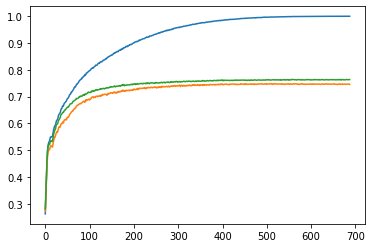

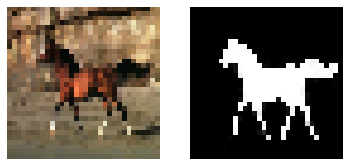

Epoch 689, Loss: 0.0114, IOU - Train: 1.0 Test: 0.762


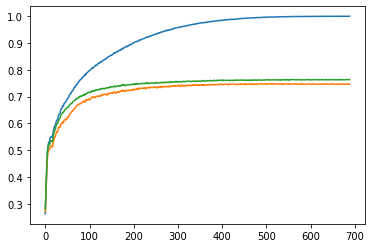

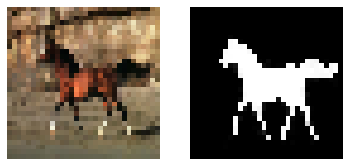

Epoch 690, Loss: 0.0117, IOU - Train: 1.0 Test: 0.762


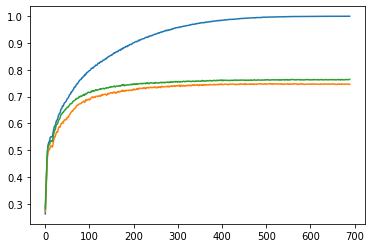

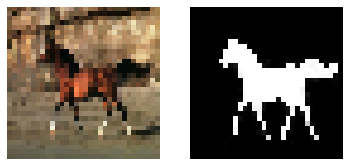

Epoch 691, Loss: 0.0122, IOU - Train: 1.0 Test: 0.762


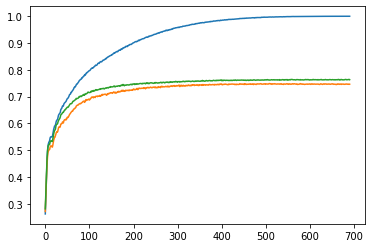

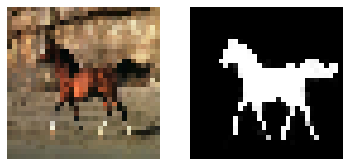

Epoch 692, Loss: 0.0124, IOU - Train: 1.0 Test: 0.762


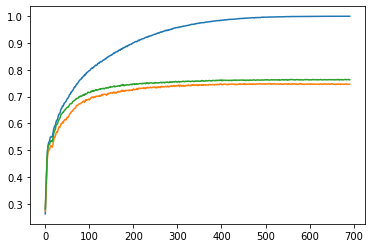

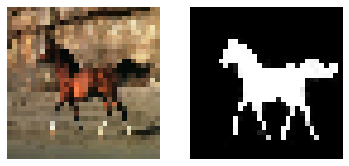

Epoch 693, Loss: 0.0111, IOU - Train: 1.0 Test: 0.762


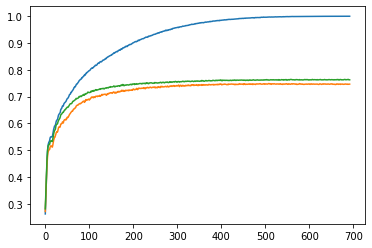

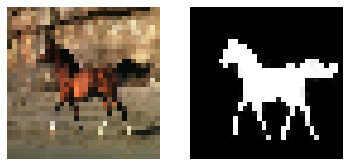

Epoch 694, Loss: 0.0121, IOU - Train: 1.0 Test: 0.762


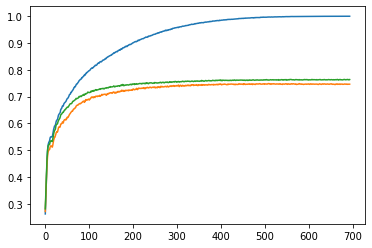

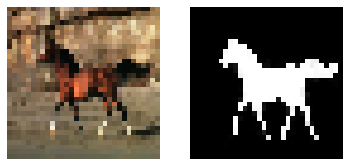

Epoch 695, Loss: 0.0118, IOU - Train: 1.0 Test: 0.762


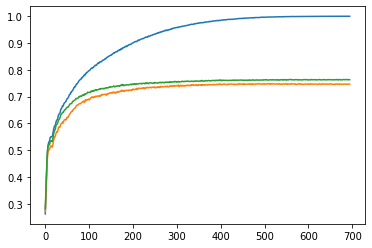

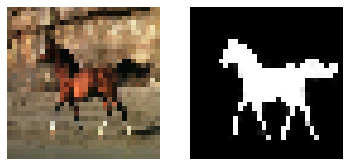

Epoch 696, Loss: 0.0114, IOU - Train: 1.0 Test: 0.762


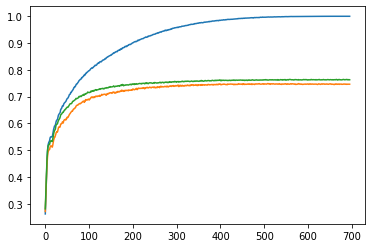

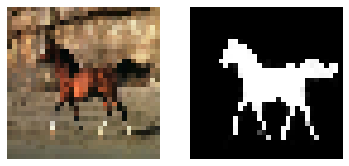

Epoch 697, Loss: 0.0114, IOU - Train: 1.0 Test: 0.762


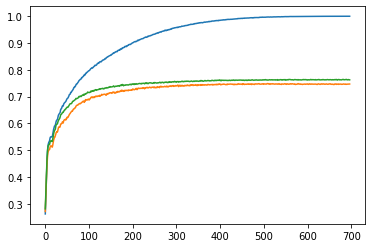

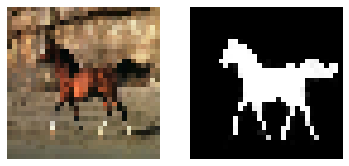

Epoch 698, Loss: 0.0105, IOU - Train: 1.0 Test: 0.762


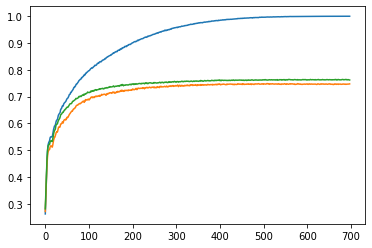

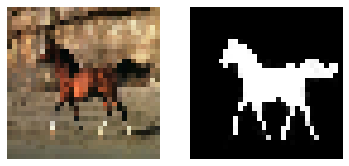

Epoch 699, Loss: 0.0112, IOU - Train: 1.0 Test: 0.762


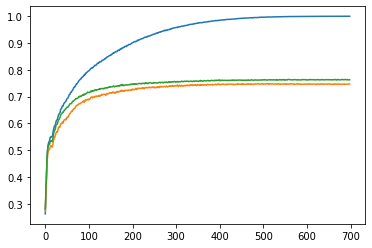

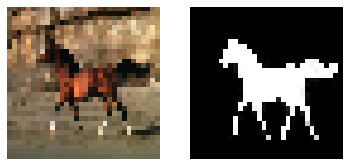

Epoch 700, Loss: 0.0108, IOU - Train: 1.0 Test: 0.762


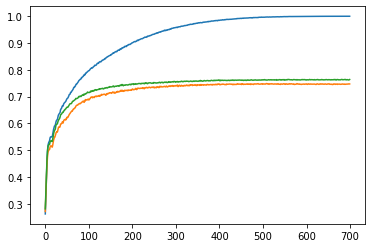

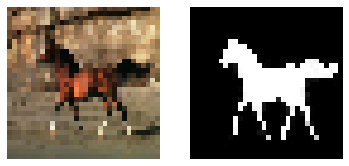

Epoch 701, Loss: 0.0117, IOU - Train: 1.0 Test: 0.762


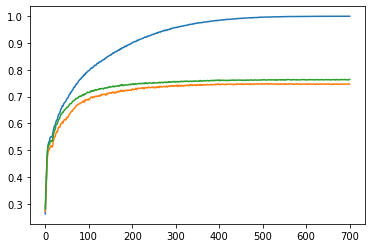

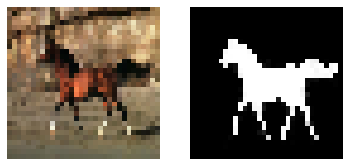

Epoch 702, Loss: 0.0115, IOU - Train: 1.0 Test: 0.762


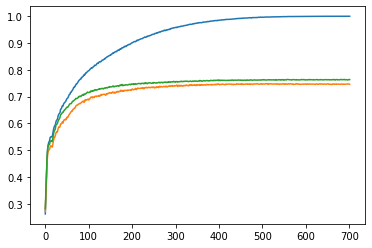

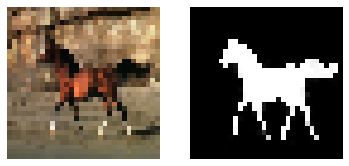

Epoch 703, Loss: 0.0107, IOU - Train: 1.0 Test: 0.762


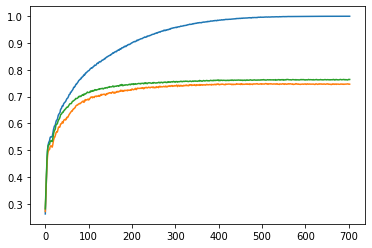

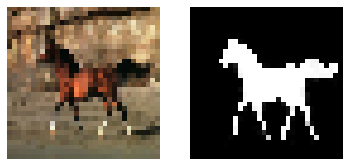

Epoch 704, Loss: 0.0111, IOU - Train: 1.0 Test: 0.762


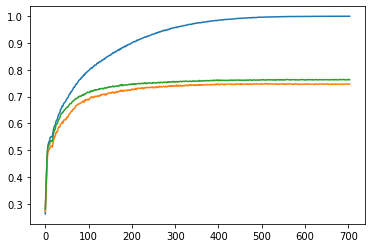

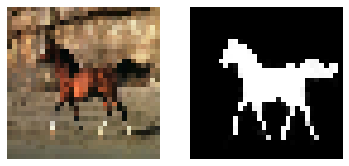

Epoch 705, Loss: 0.0109, IOU - Train: 1.0 Test: 0.762


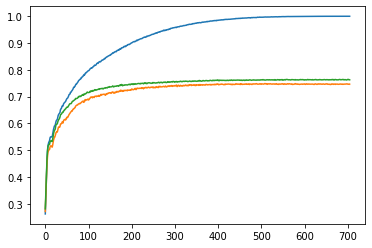

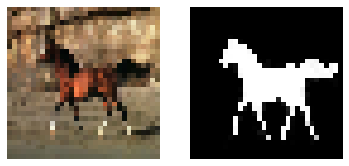

Epoch 706, Loss: 0.0112, IOU - Train: 1.0 Test: 0.762


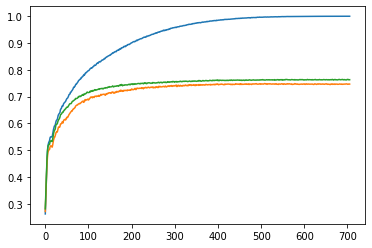

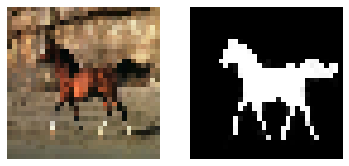

Epoch 707, Loss: 0.0108, IOU - Train: 1.0 Test: 0.762


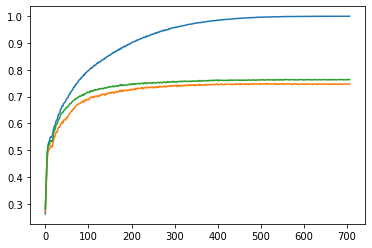

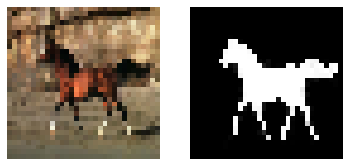

Epoch 708, Loss: 0.0103, IOU - Train: 1.0 Test: 0.762


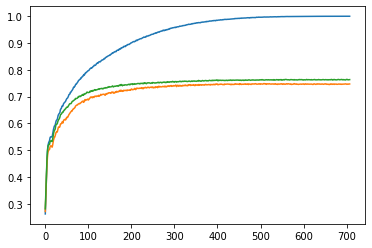

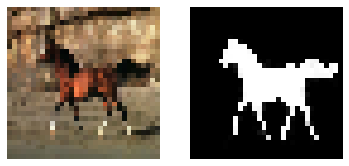

Epoch 709, Loss: 0.0104, IOU - Train: 1.0 Test: 0.762


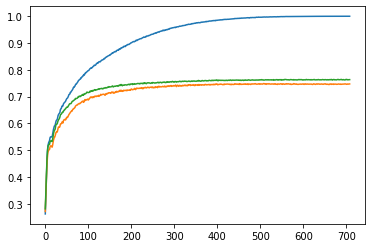

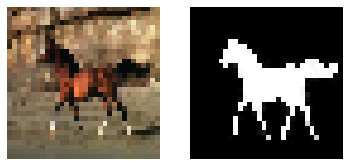

Epoch 710, Loss: 0.0102, IOU - Train: 1.0 Test: 0.762


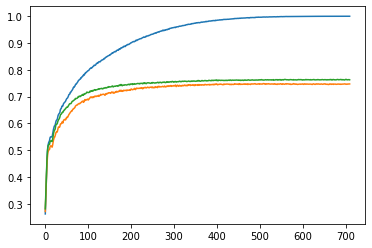

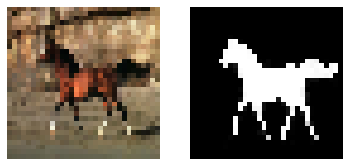

Epoch 711, Loss: 0.0106, IOU - Train: 1.0 Test: 0.762


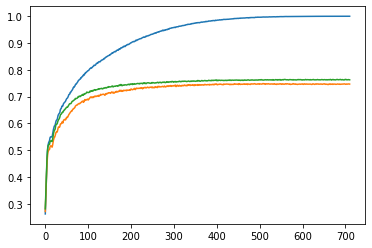

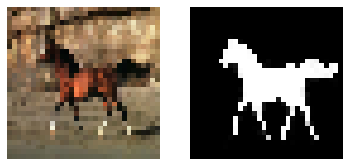

Epoch 712, Loss: 0.0111, IOU - Train: 1.0 Test: 0.762


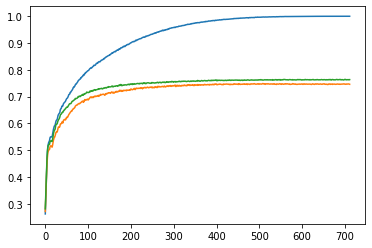

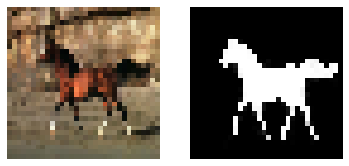

Epoch 713, Loss: 0.0104, IOU - Train: 1.0 Test: 0.762


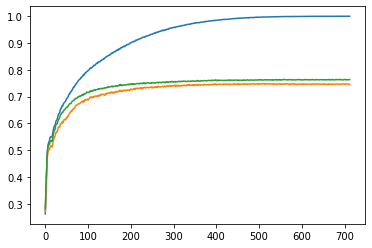

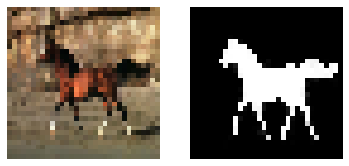

Epoch 714, Loss: 0.0106, IOU - Train: 1.0 Test: 0.762


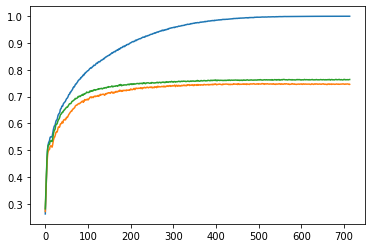

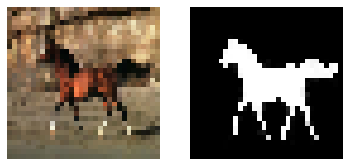

Epoch 715, Loss: 0.0106, IOU - Train: 1.0 Test: 0.762


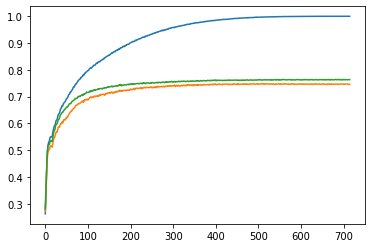

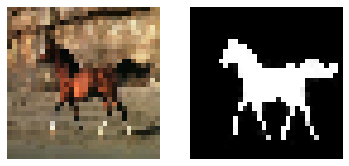

Epoch 716, Loss: 0.0099, IOU - Train: 1.0 Test: 0.762


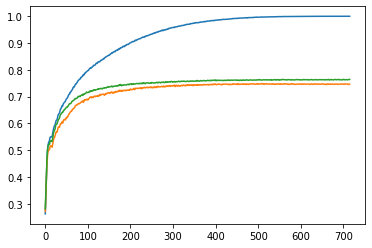

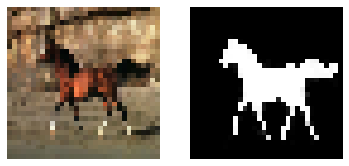

Epoch 717, Loss: 0.00949, IOU - Train: 1.0 Test: 0.762


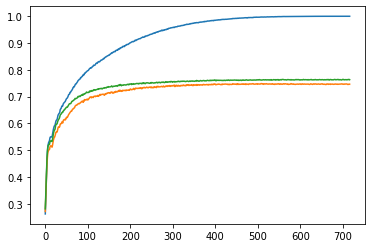

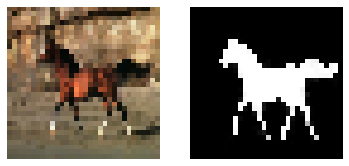

Epoch 718, Loss: 0.00965, IOU - Train: 1.0 Test: 0.762


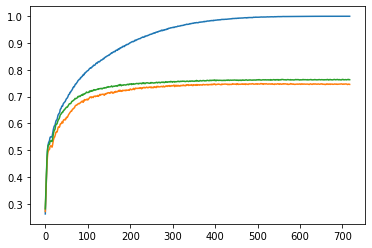

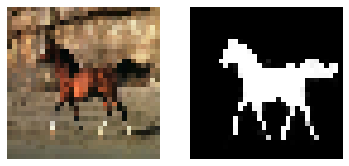

Epoch 719, Loss: 0.0107, IOU - Train: 1.0 Test: 0.762


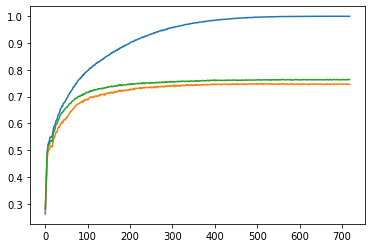

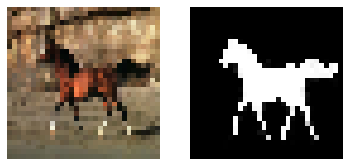

Epoch 720, Loss: 0.0102, IOU - Train: 1.0 Test: 0.762


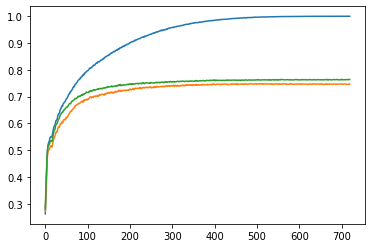

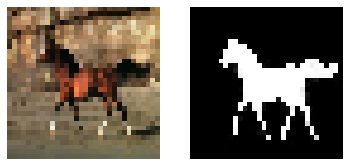

Epoch 721, Loss: 0.0103, IOU - Train: 1.0 Test: 0.762


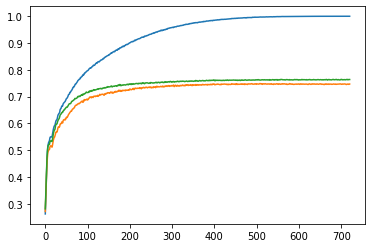

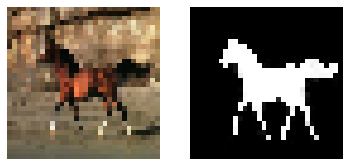

Epoch 722, Loss: 0.0111, IOU - Train: 1.0 Test: 0.762


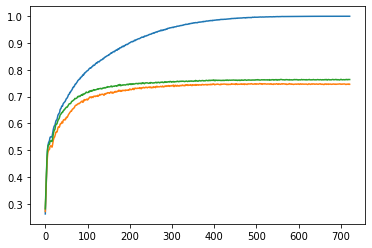

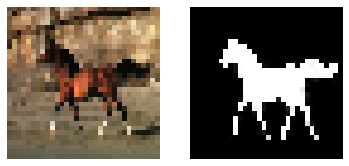

Epoch 723, Loss: 0.00951, IOU - Train: 1.0 Test: 0.762


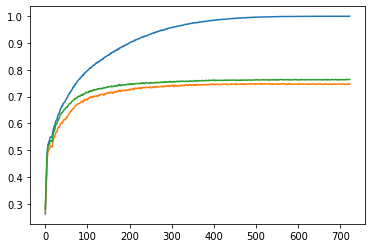

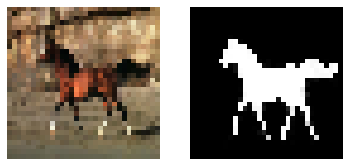

Epoch 724, Loss: 0.00998, IOU - Train: 1.0 Test: 0.762


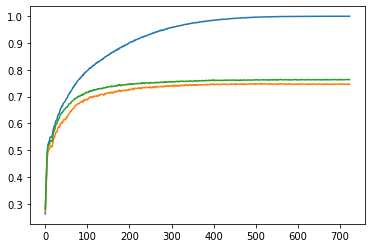

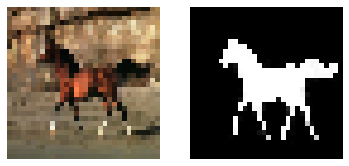

Epoch 725, Loss: 0.0096, IOU - Train: 1.0 Test: 0.762


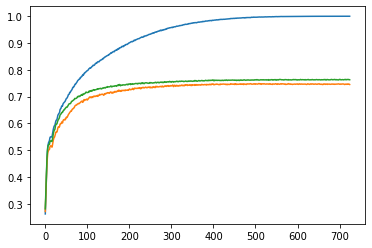

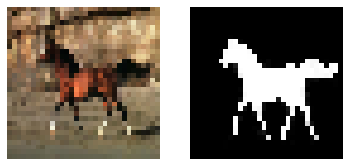

Epoch 726, Loss: 0.01, IOU - Train: 1.0 Test: 0.762


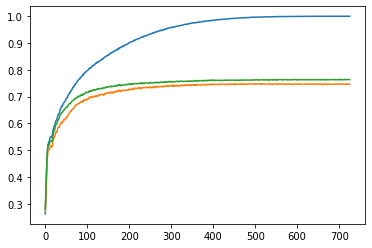

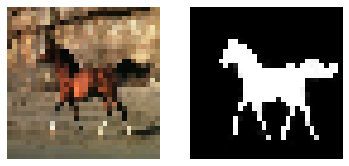

Epoch 727, Loss: 0.00981, IOU - Train: 1.0 Test: 0.762


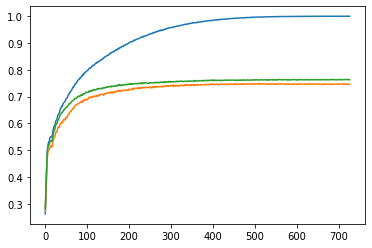

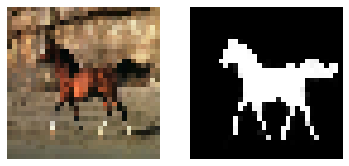

Epoch 728, Loss: 0.00989, IOU - Train: 1.0 Test: 0.762


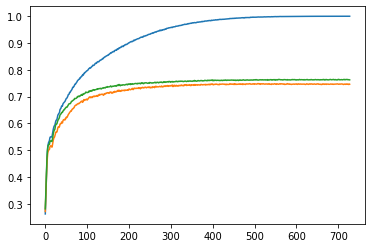

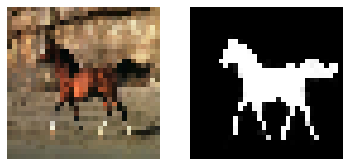

Epoch 729, Loss: 0.00995, IOU - Train: 1.0 Test: 0.762


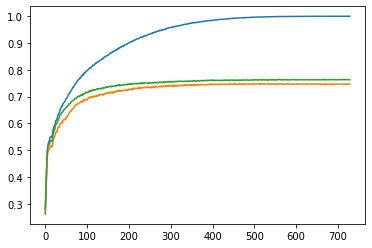

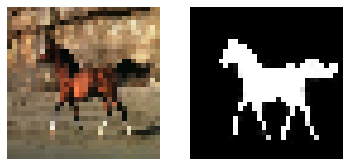

Epoch 730, Loss: 0.0093, IOU - Train: 1.0 Test: 0.762


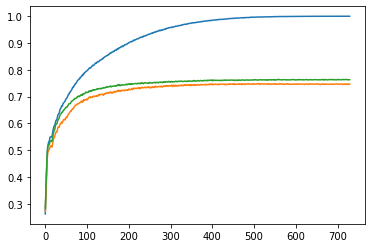

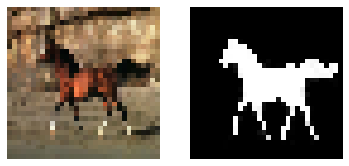

Epoch 731, Loss: 0.00914, IOU - Train: 1.0 Test: 0.762


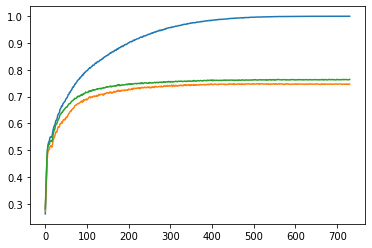

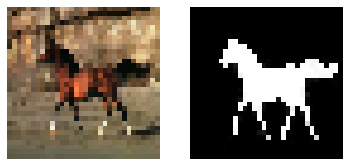

Epoch 732, Loss: 0.0094, IOU - Train: 1.0 Test: 0.762


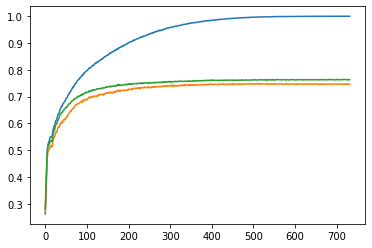

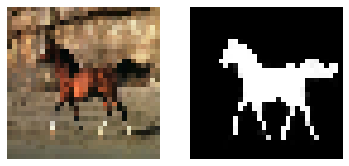

Epoch 733, Loss: 0.00945, IOU - Train: 1.0 Test: 0.762


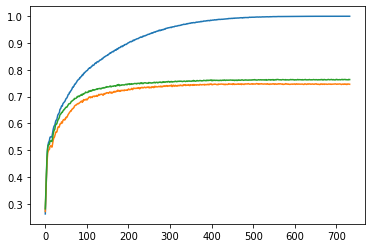

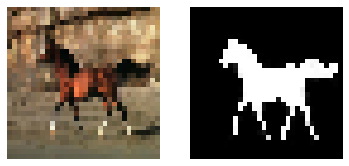

Epoch 734, Loss: 0.00898, IOU - Train: 1.0 Test: 0.762


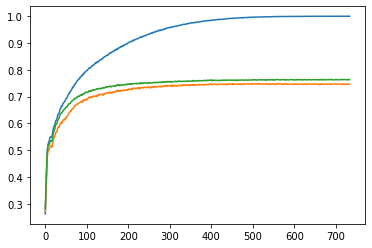

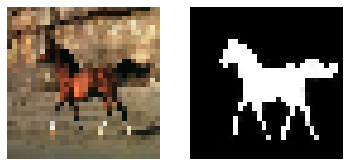

Epoch 735, Loss: 0.00986, IOU - Train: 1.0 Test: 0.762


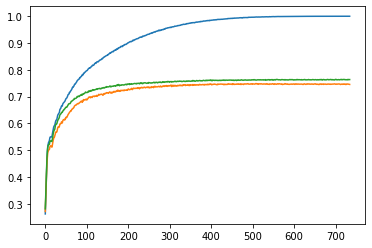

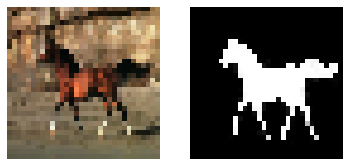

Epoch 736, Loss: 0.00986, IOU - Train: 1.0 Test: 0.762


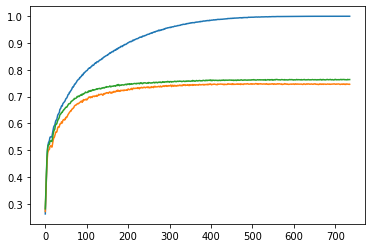

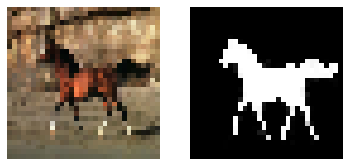

Epoch 737, Loss: 0.0095, IOU - Train: 1.0 Test: 0.762


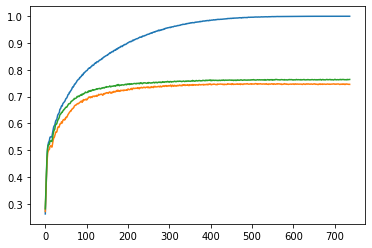

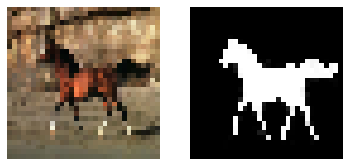

Epoch 738, Loss: 0.00977, IOU - Train: 1.0 Test: 0.762


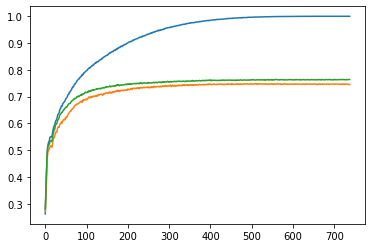

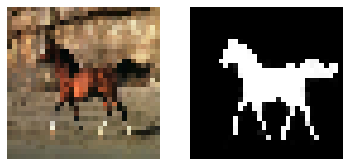

Epoch 739, Loss: 0.00974, IOU - Train: 1.0 Test: 0.762


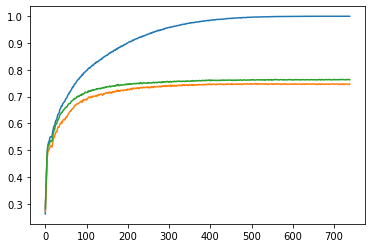

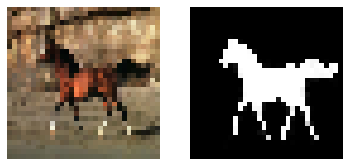

Epoch 740, Loss: 0.00923, IOU - Train: 1.0 Test: 0.762


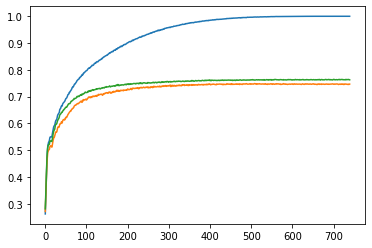

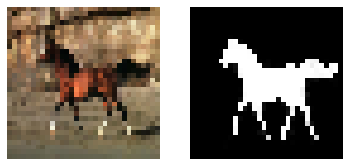

Epoch 741, Loss: 0.01, IOU - Train: 1.0 Test: 0.762


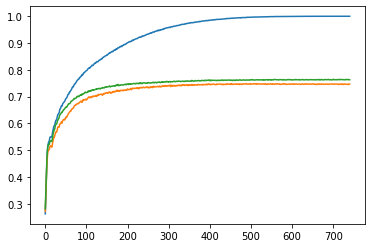

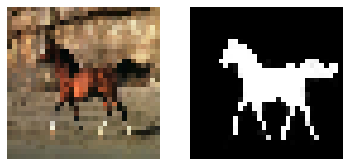

Epoch 742, Loss: 0.00911, IOU - Train: 1.0 Test: 0.762


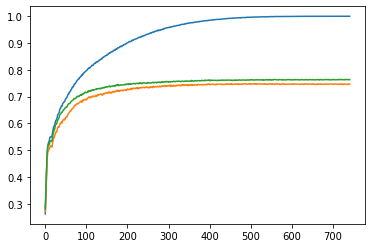

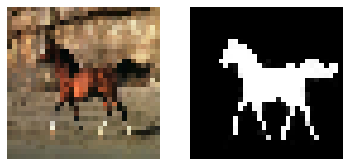

Epoch 743, Loss: 0.00945, IOU - Train: 1.0 Test: 0.762


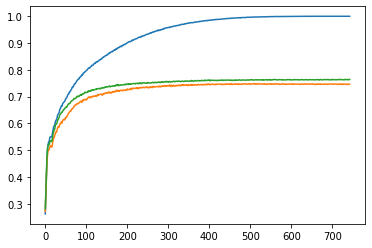

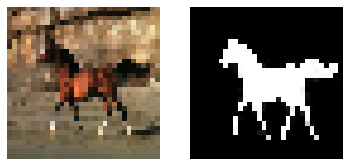

Epoch 744, Loss: 0.00849, IOU - Train: 1.0 Test: 0.762


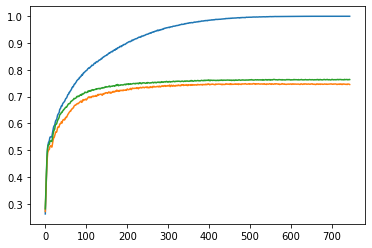

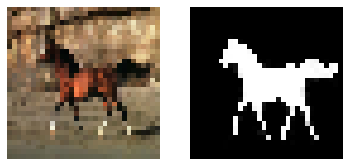

Epoch 745, Loss: 0.0086, IOU - Train: 1.0 Test: 0.762


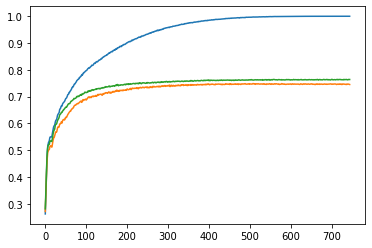

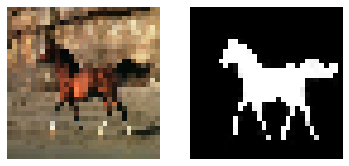

Epoch 746, Loss: 0.00855, IOU - Train: 1.0 Test: 0.762


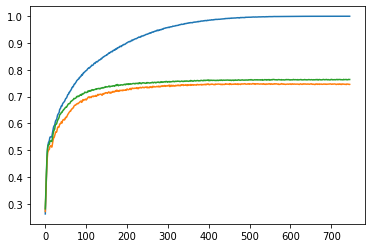

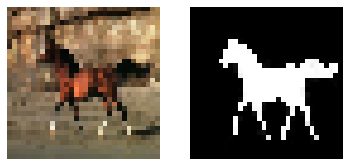

Epoch 747, Loss: 0.00887, IOU - Train: 1.0 Test: 0.762


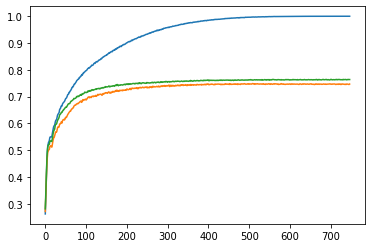

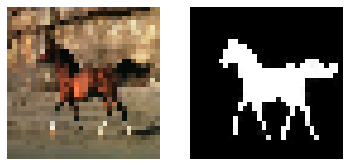

Epoch 748, Loss: 0.00883, IOU - Train: 1.0 Test: 0.762


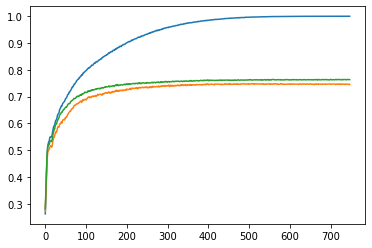

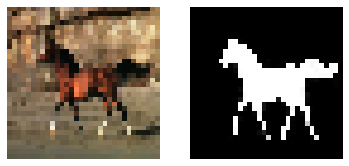

Epoch 749, Loss: 0.00867, IOU - Train: 1.0 Test: 0.762


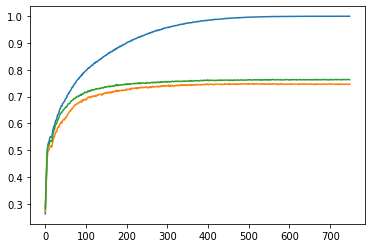

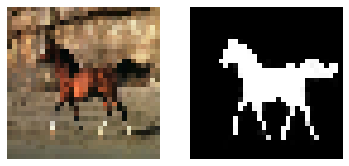

Epoch 750, Loss: 0.00826, IOU - Train: 1.0 Test: 0.762


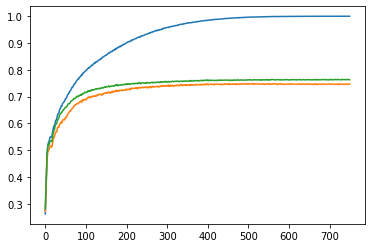

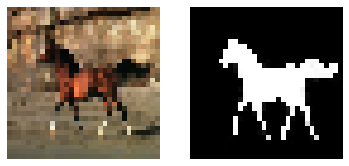

Epoch 751, Loss: 0.00817, IOU - Train: 1.0 Test: 0.762


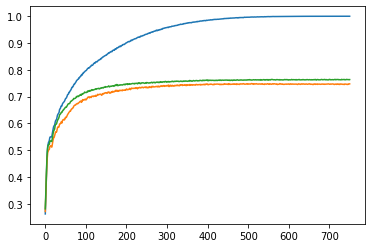

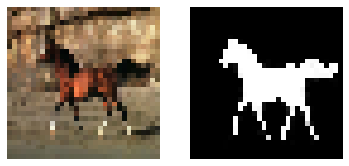

Epoch 752, Loss: 0.00822, IOU - Train: 1.0 Test: 0.762


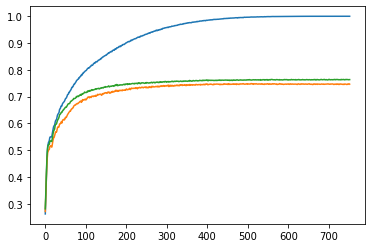

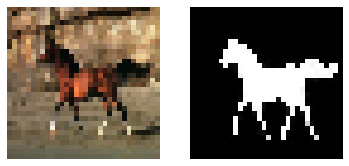

Epoch 753, Loss: 0.00839, IOU - Train: 1.0 Test: 0.762


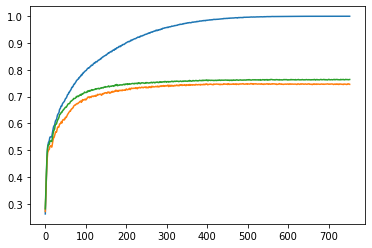

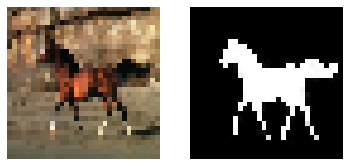

Epoch 754, Loss: 0.00876, IOU - Train: 1.0 Test: 0.762


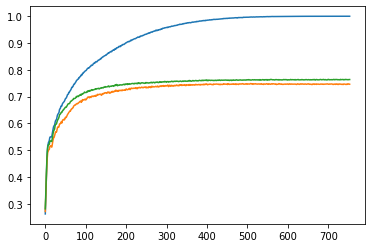

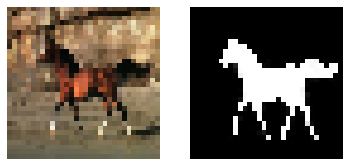

Epoch 755, Loss: 0.00809, IOU - Train: 1.0 Test: 0.762


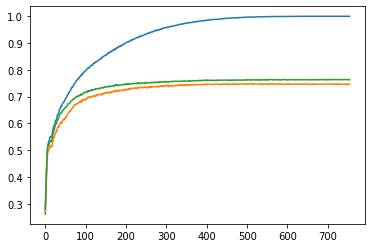

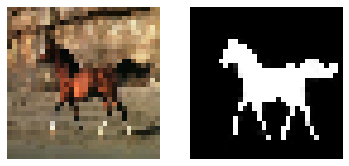

Epoch 756, Loss: 0.00843, IOU - Train: 1.0 Test: 0.762


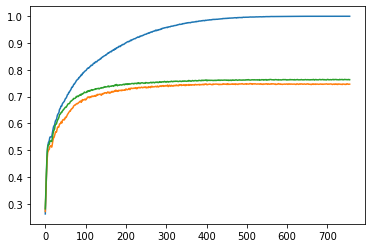

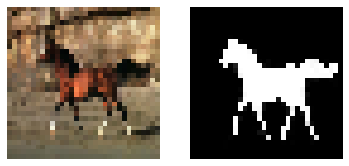

Epoch 757, Loss: 0.00824, IOU - Train: 1.0 Test: 0.762


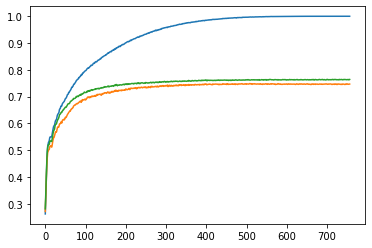

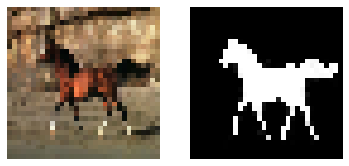

Epoch 758, Loss: 0.00791, IOU - Train: 1.0 Test: 0.762


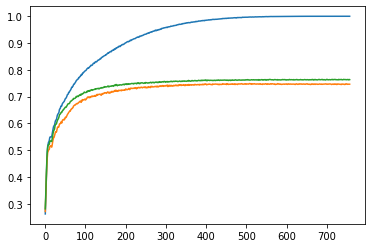

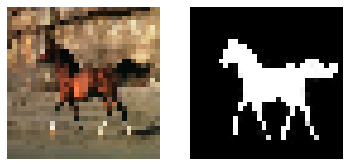

Epoch 759, Loss: 0.0087, IOU - Train: 1.0 Test: 0.762


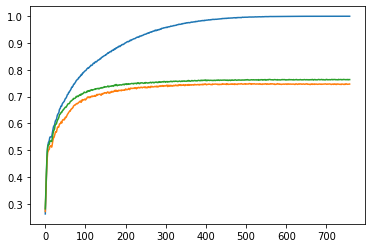

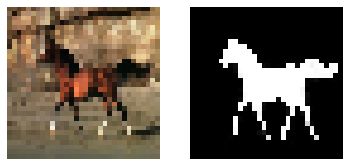

Epoch 760, Loss: 0.00837, IOU - Train: 1.0 Test: 0.762


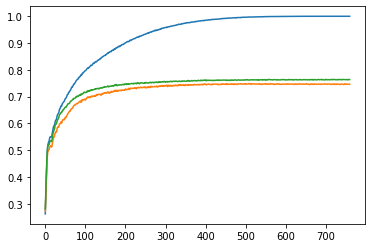

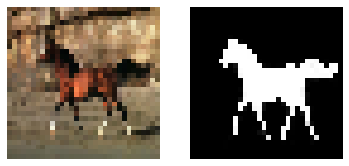

Epoch 761, Loss: 0.00817, IOU - Train: 1.0 Test: 0.762


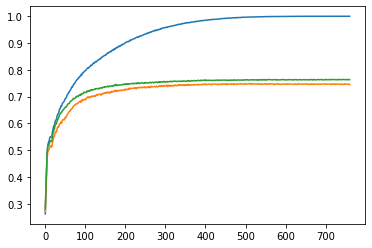

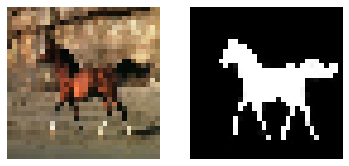

Epoch 762, Loss: 0.00829, IOU - Train: 1.0 Test: 0.762


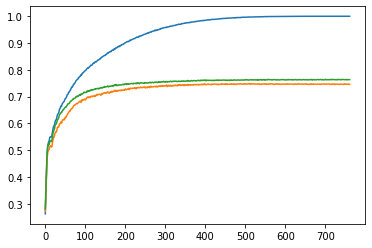

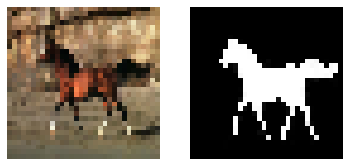

Epoch 763, Loss: 0.00803, IOU - Train: 1.0 Test: 0.762


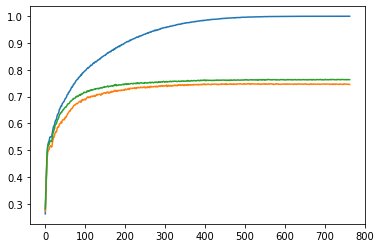

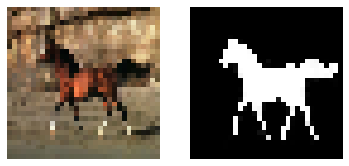

Epoch 764, Loss: 0.00776, IOU - Train: 1.0 Test: 0.762


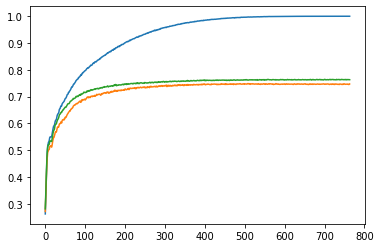

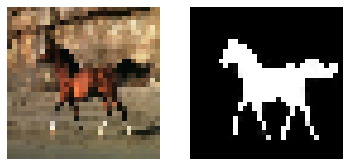

Epoch 765, Loss: 0.00777, IOU - Train: 1.0 Test: 0.762


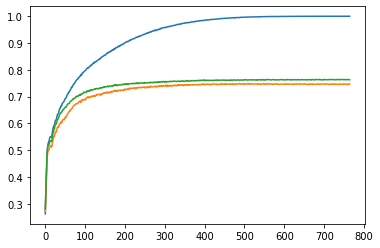

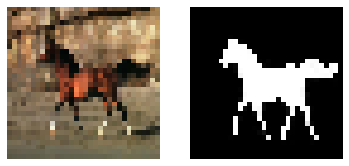

Epoch 766, Loss: 0.00774, IOU - Train: 1.0 Test: 0.762


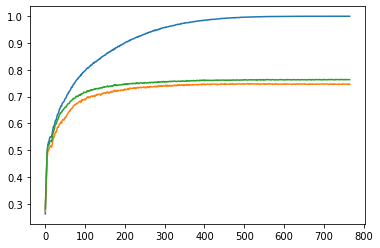

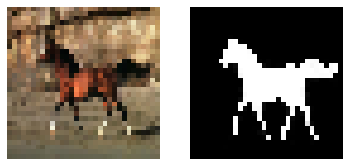

Epoch 767, Loss: 0.00783, IOU - Train: 1.0 Test: 0.762


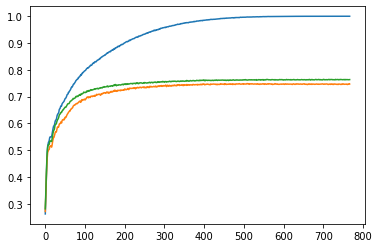

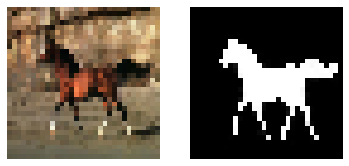

Epoch 768, Loss: 0.00847, IOU - Train: 1.0 Test: 0.762


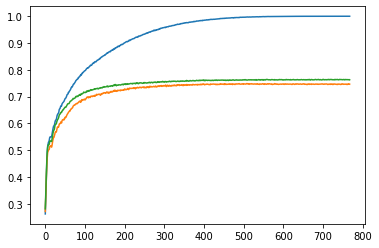

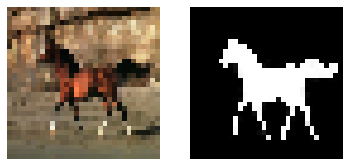

Epoch 769, Loss: 0.00792, IOU - Train: 1.0 Test: 0.762


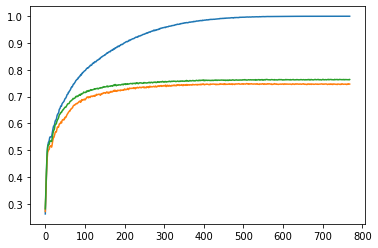

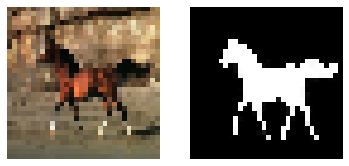

Epoch 770, Loss: 0.00808, IOU - Train: 1.0 Test: 0.762


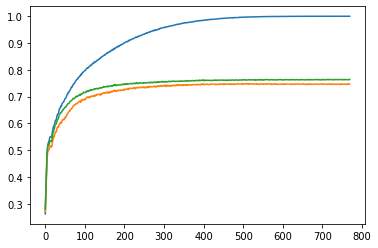

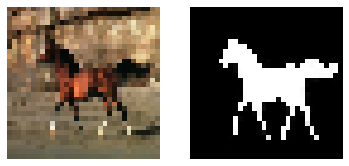

Epoch 771, Loss: 0.00804, IOU - Train: 1.0 Test: 0.762


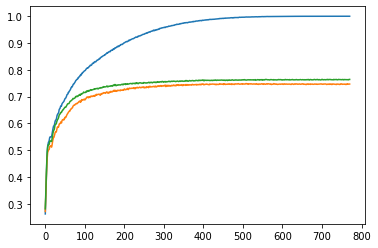

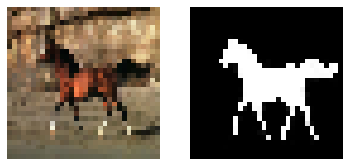

Epoch 772, Loss: 0.00761, IOU - Train: 1.0 Test: 0.762


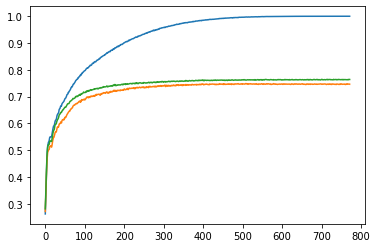

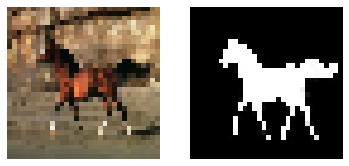

Epoch 773, Loss: 0.00797, IOU - Train: 1.0 Test: 0.762


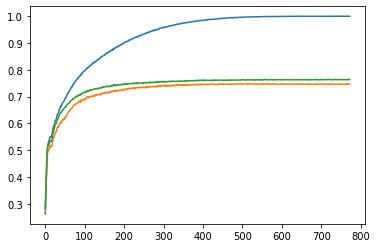

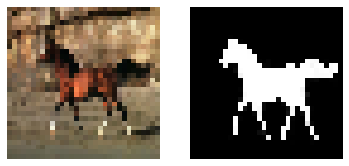

Epoch 774, Loss: 0.00778, IOU - Train: 1.0 Test: 0.762


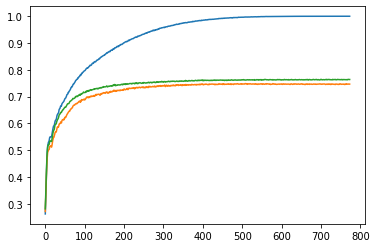

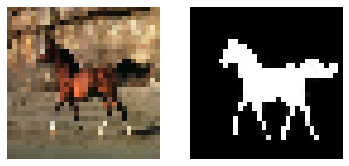

Epoch 775, Loss: 0.00798, IOU - Train: 1.0 Test: 0.762


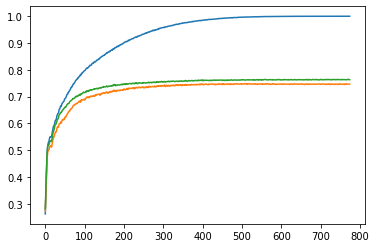

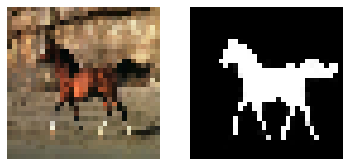

Epoch 776, Loss: 0.00821, IOU - Train: 1.0 Test: 0.762


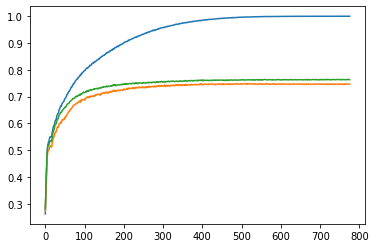

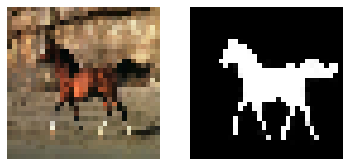

Epoch 777, Loss: 0.00789, IOU - Train: 1.0 Test: 0.762


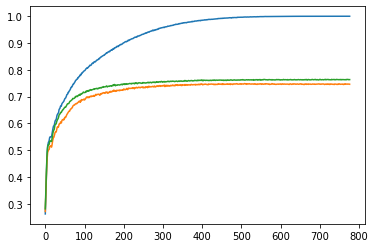

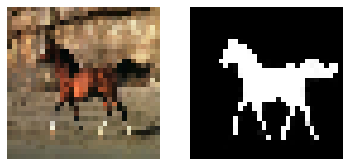

Epoch 778, Loss: 0.00847, IOU - Train: 1.0 Test: 0.762


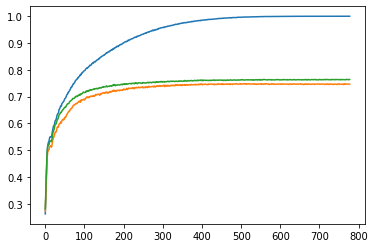

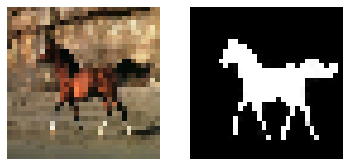

Epoch 779, Loss: 0.00912, IOU - Train: 1.0 Test: 0.762


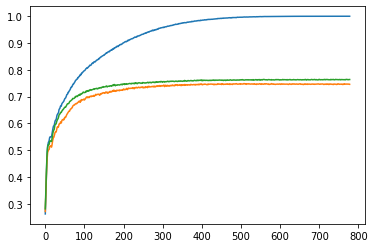

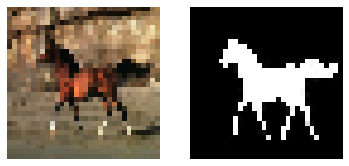

Epoch 780, Loss: 0.00796, IOU - Train: 1.0 Test: 0.762


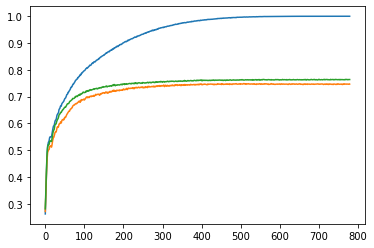

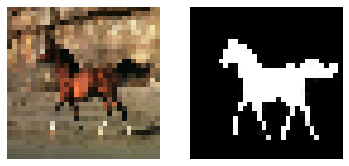

Epoch 781, Loss: 0.00849, IOU - Train: 1.0 Test: 0.762


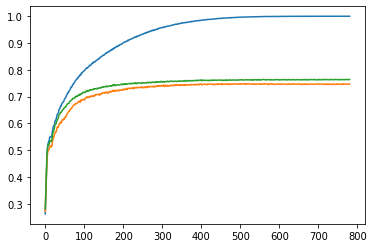

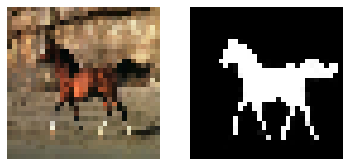

Epoch 782, Loss: 0.00848, IOU - Train: 1.0 Test: 0.762


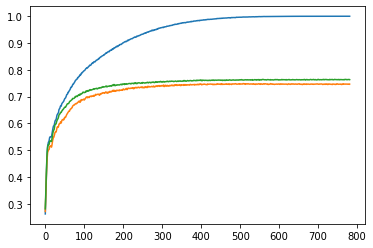

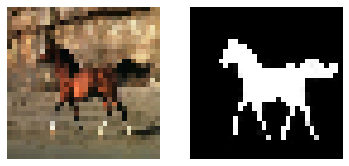

Epoch 783, Loss: 0.00881, IOU - Train: 1.0 Test: 0.762


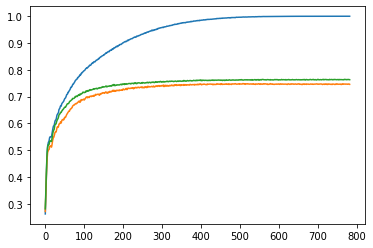

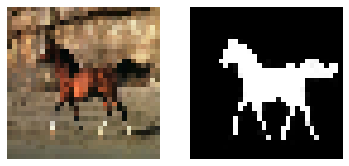

Epoch 784, Loss: 0.00827, IOU - Train: 1.0 Test: 0.762


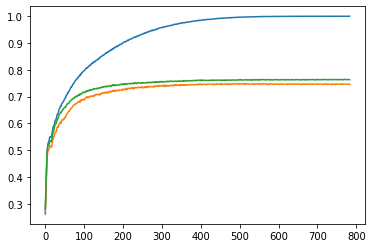

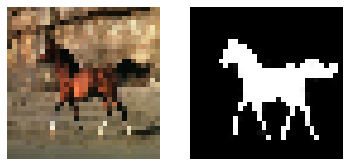

Epoch 785, Loss: 0.00847, IOU - Train: 1.0 Test: 0.762


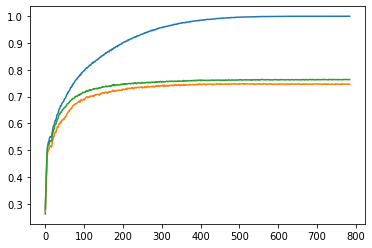

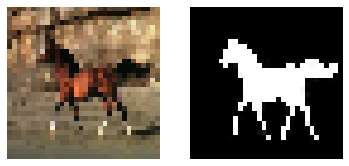

Epoch 786, Loss: 0.00809, IOU - Train: 1.0 Test: 0.762


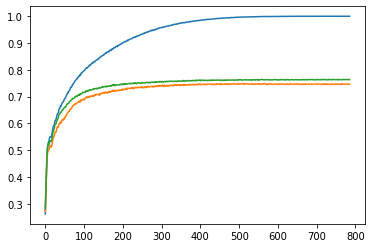

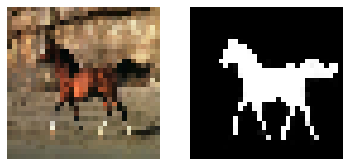

Epoch 787, Loss: 0.0079, IOU - Train: 1.0 Test: 0.762


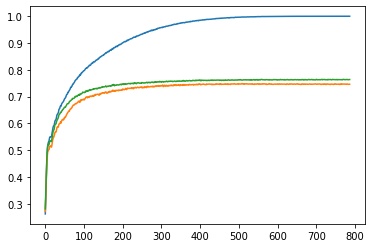

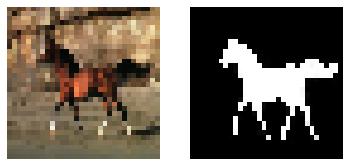

Epoch 788, Loss: 0.00764, IOU - Train: 1.0 Test: 0.762


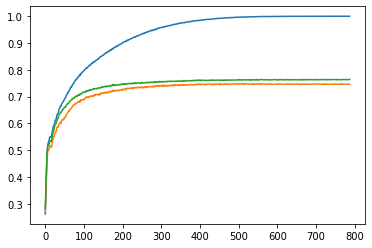

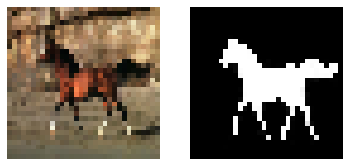

Epoch 789, Loss: 0.00781, IOU - Train: 1.0 Test: 0.762


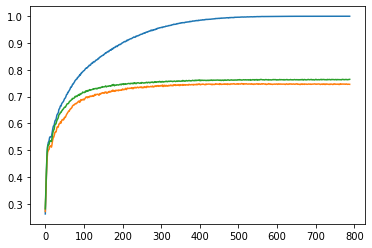

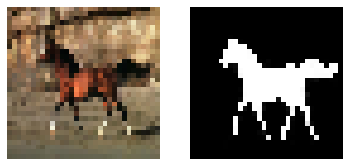

Epoch 790, Loss: 0.00749, IOU - Train: 1.0 Test: 0.762


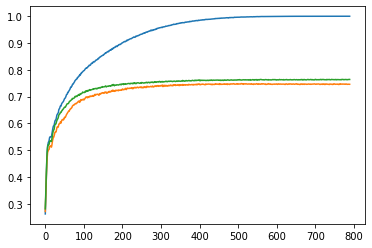

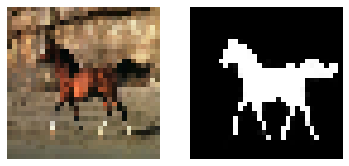

Epoch 791, Loss: 0.00723, IOU - Train: 1.0 Test: 0.762


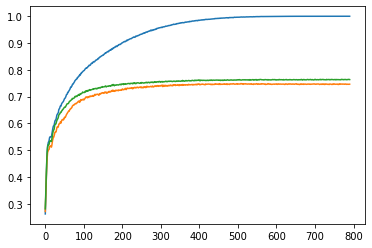

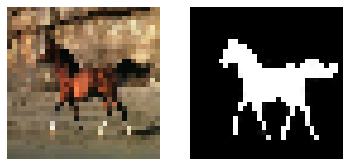

Epoch 792, Loss: 0.00733, IOU - Train: 1.0 Test: 0.762


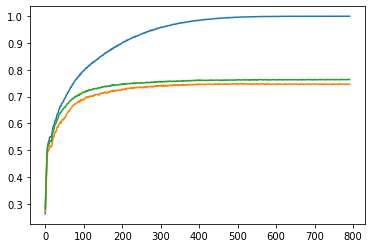

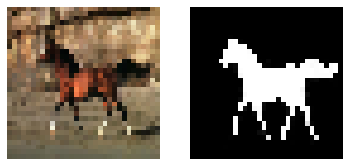

Epoch 793, Loss: 0.00797, IOU - Train: 1.0 Test: 0.762


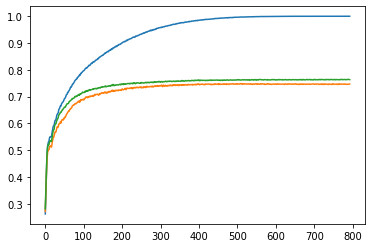

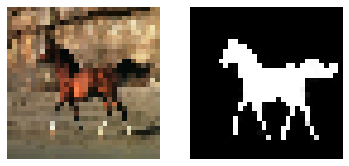

Epoch 794, Loss: 0.00732, IOU - Train: 1.0 Test: 0.762


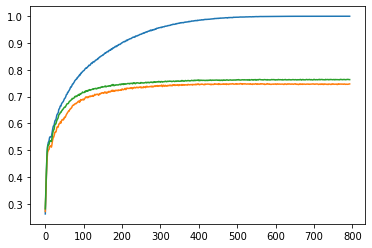

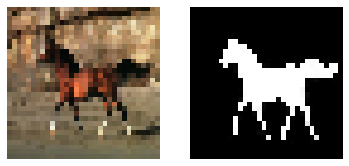

Epoch 795, Loss: 0.00727, IOU - Train: 1.0 Test: 0.762


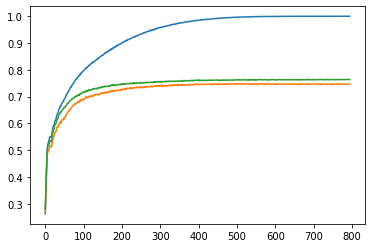

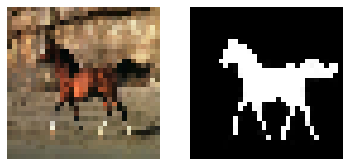

Epoch 796, Loss: 0.00715, IOU - Train: 1.0 Test: 0.762


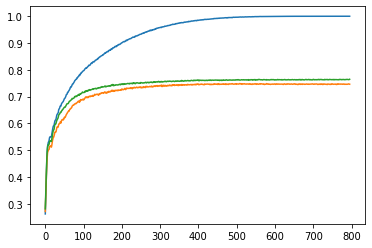

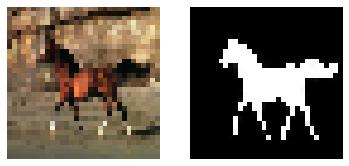

Epoch 797, Loss: 0.00705, IOU - Train: 1.0 Test: 0.762


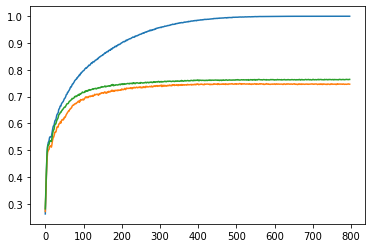

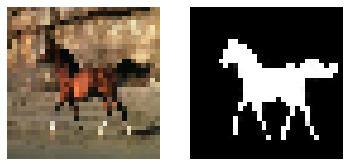

Epoch 798, Loss: 0.00678, IOU - Train: 1.0 Test: 0.762


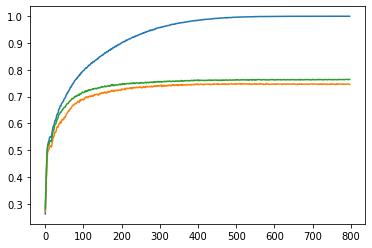

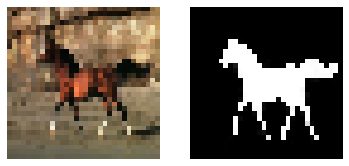

Epoch 799, Loss: 0.00696, IOU - Train: 1.0 Test: 0.762


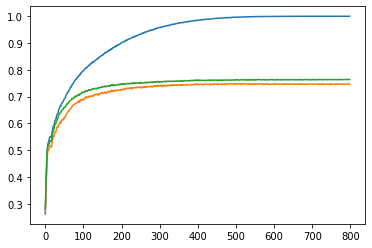

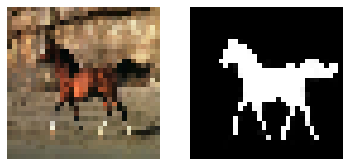

Epoch 800, Loss: 0.00653, IOU - Train: 1.0 Test: 0.762


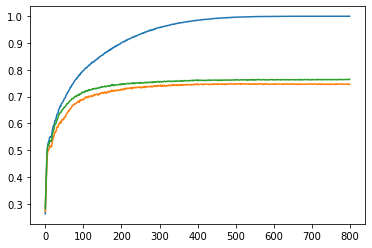

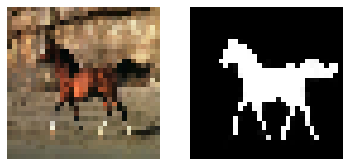

Epoch 801, Loss: 0.00653, IOU - Train: 1.0 Test: 0.762


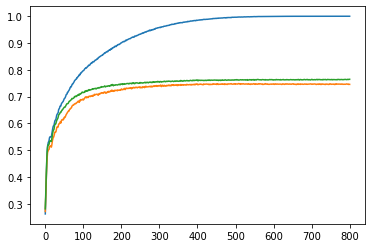

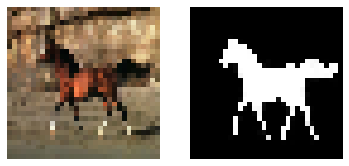

Epoch 802, Loss: 0.00653, IOU - Train: 1.0 Test: 0.762


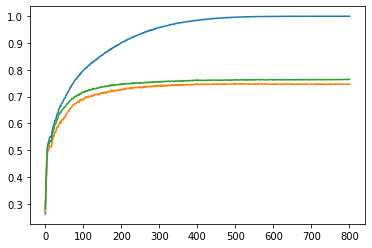

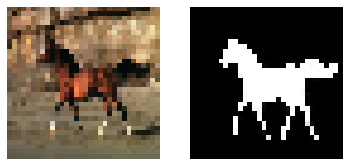

Epoch 803, Loss: 0.00631, IOU - Train: 1.0 Test: 0.762


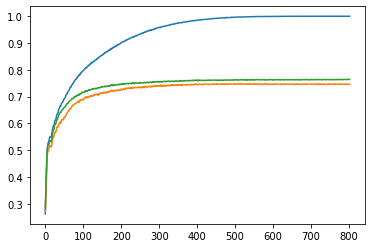

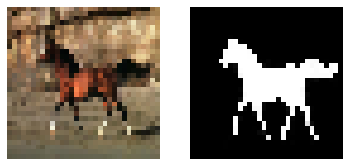

Epoch 804, Loss: 0.00631, IOU - Train: 1.0 Test: 0.762


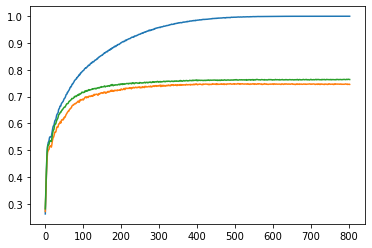

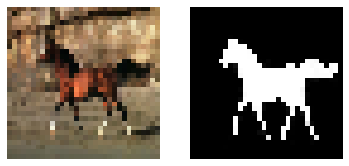

Epoch 805, Loss: 0.00685, IOU - Train: 1.0 Test: 0.762


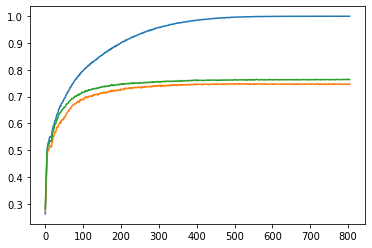

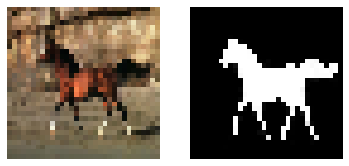

Epoch 806, Loss: 0.00628, IOU - Train: 1.0 Test: 0.762


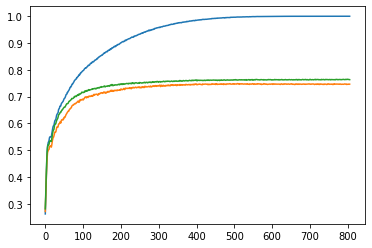

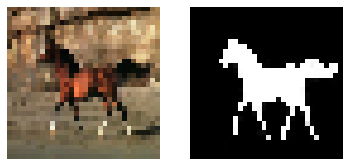

Epoch 807, Loss: 0.00682, IOU - Train: 1.0 Test: 0.762


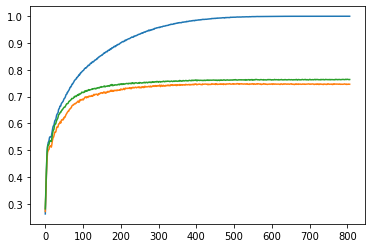

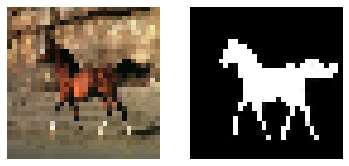

Epoch 808, Loss: 0.00683, IOU - Train: 1.0 Test: 0.762


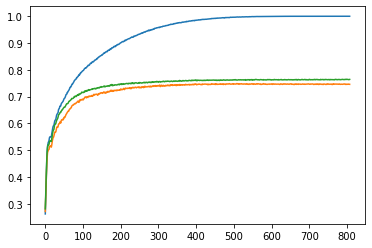

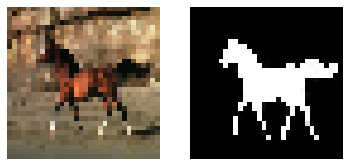

Epoch 809, Loss: 0.00669, IOU - Train: 1.0 Test: 0.762


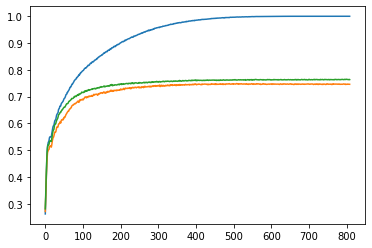

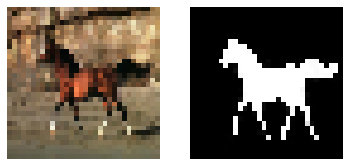

Epoch 810, Loss: 0.0065, IOU - Train: 1.0 Test: 0.762


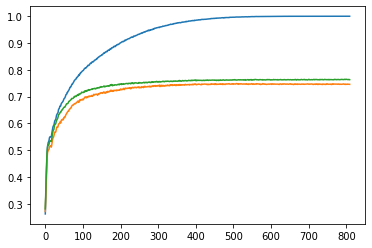

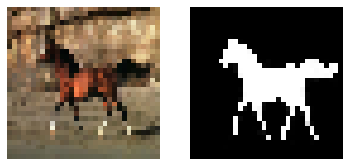

Epoch 811, Loss: 0.00648, IOU - Train: 1.0 Test: 0.762


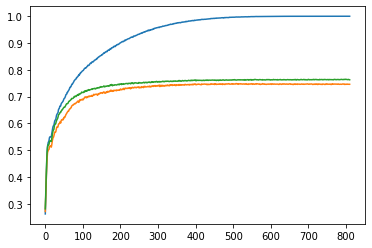

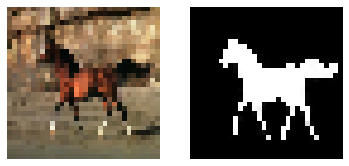

Epoch 812, Loss: 0.00636, IOU - Train: 1.0 Test: 0.762


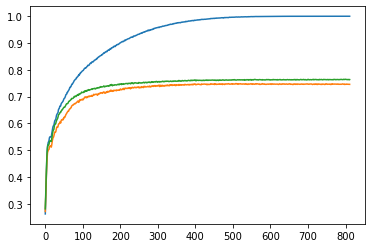

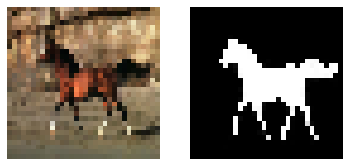

Epoch 813, Loss: 0.00611, IOU - Train: 1.0 Test: 0.762


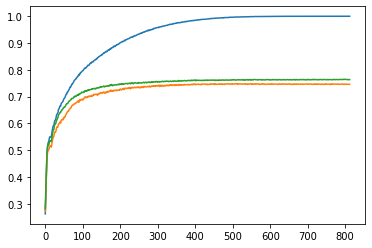

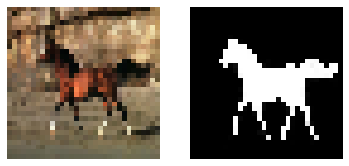

Epoch 814, Loss: 0.00639, IOU - Train: 1.0 Test: 0.762


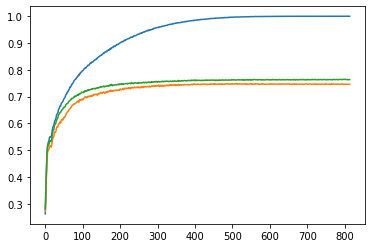

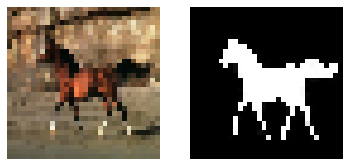

Epoch 815, Loss: 0.00613, IOU - Train: 1.0 Test: 0.762


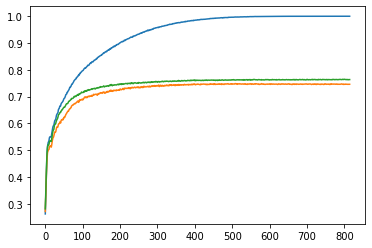

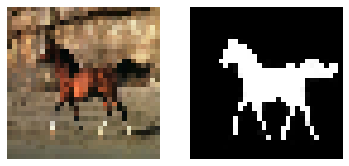

Epoch 816, Loss: 0.00608, IOU - Train: 1.0 Test: 0.762


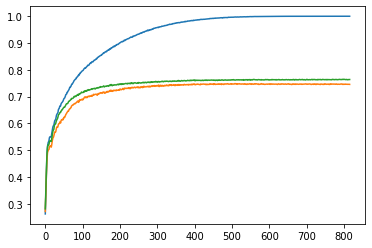

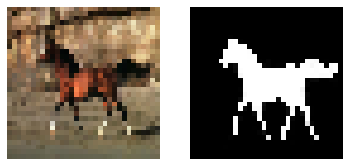

Epoch 817, Loss: 0.00611, IOU - Train: 1.0 Test: 0.762


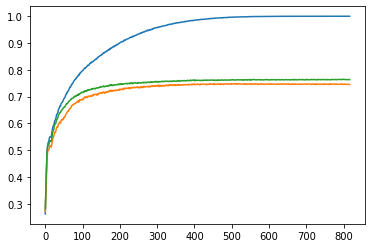

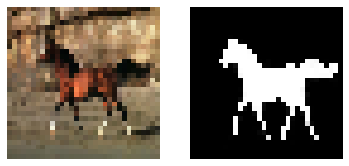

Epoch 818, Loss: 0.00592, IOU - Train: 1.0 Test: 0.762


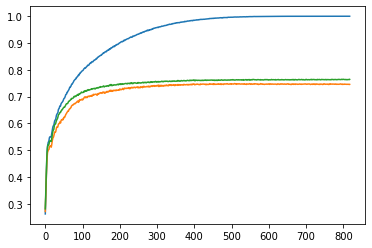

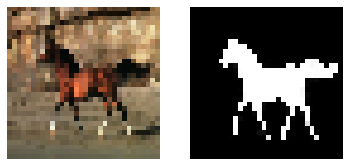

Epoch 819, Loss: 0.00597, IOU - Train: 1.0 Test: 0.762


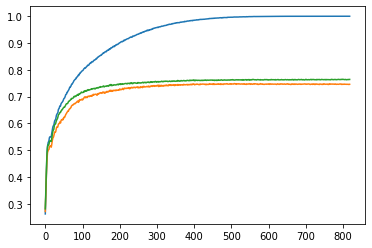

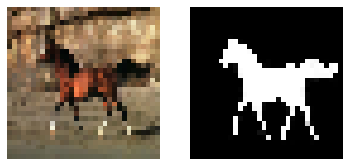

Epoch 820, Loss: 0.00613, IOU - Train: 1.0 Test: 0.762


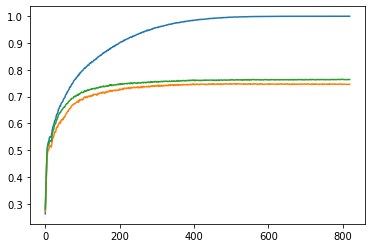

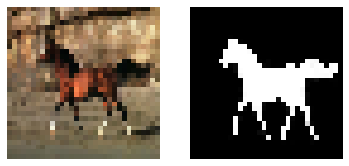

Epoch 821, Loss: 0.00616, IOU - Train: 1.0 Test: 0.762


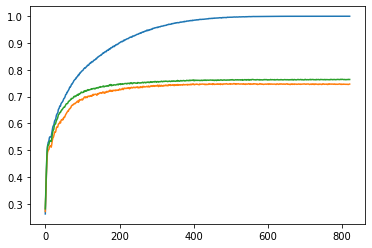

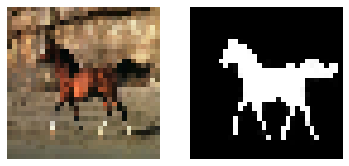

Epoch 822, Loss: 0.0062, IOU - Train: 1.0 Test: 0.762


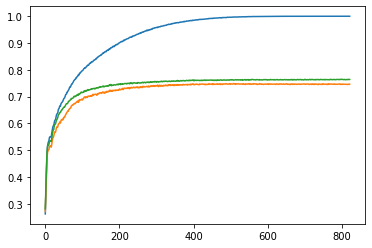

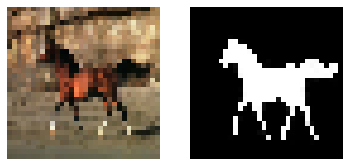

Epoch 823, Loss: 0.00603, IOU - Train: 1.0 Test: 0.762


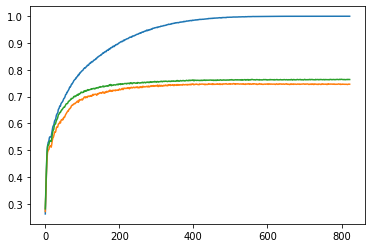

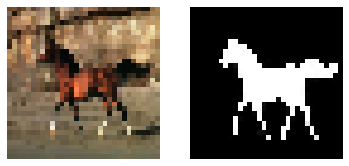

Epoch 824, Loss: 0.00613, IOU - Train: 1.0 Test: 0.762


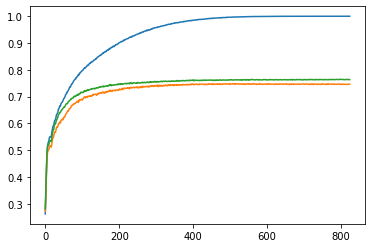

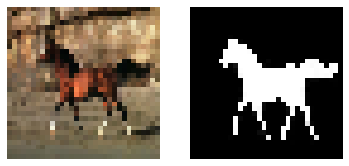

Epoch 825, Loss: 0.00613, IOU - Train: 1.0 Test: 0.762


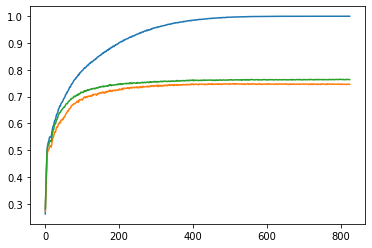

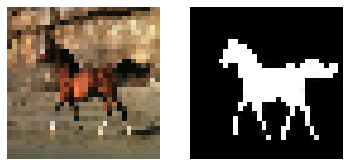

Epoch 826, Loss: 0.00604, IOU - Train: 1.0 Test: 0.762


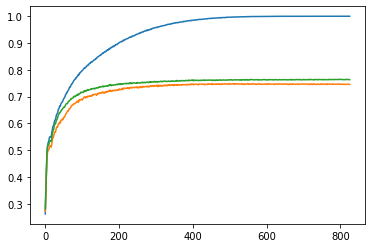

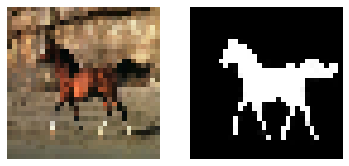

Epoch 827, Loss: 0.0062, IOU - Train: 1.0 Test: 0.762


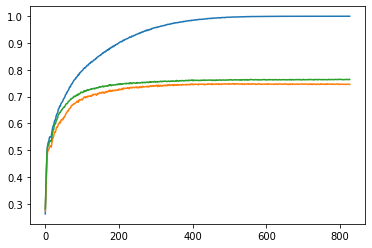

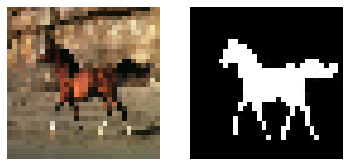

Epoch 828, Loss: 0.00597, IOU - Train: 1.0 Test: 0.762


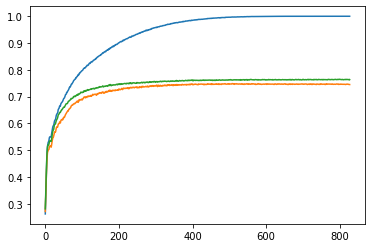

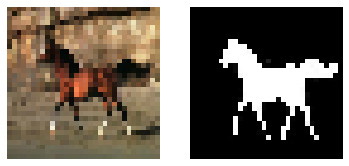

Epoch 829, Loss: 0.00636, IOU - Train: 1.0 Test: 0.762


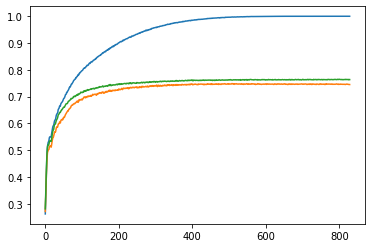

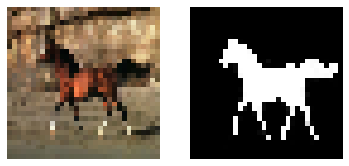

Epoch 830, Loss: 0.00606, IOU - Train: 1.0 Test: 0.762


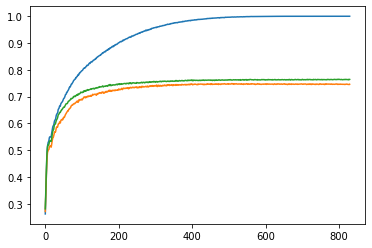

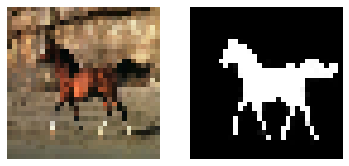

Epoch 831, Loss: 0.0055, IOU - Train: 1.0 Test: 0.762


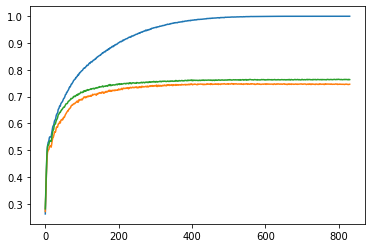

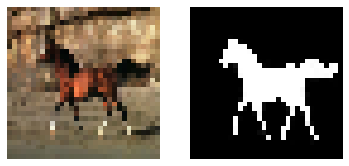

Epoch 832, Loss: 0.00592, IOU - Train: 1.0 Test: 0.762


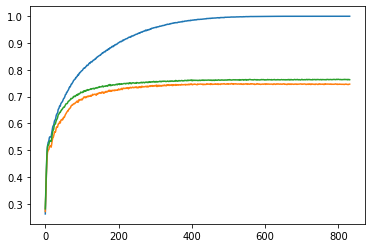

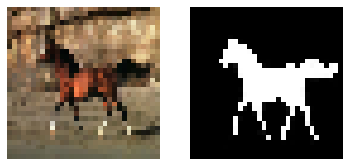

Epoch 833, Loss: 0.00588, IOU - Train: 1.0 Test: 0.762


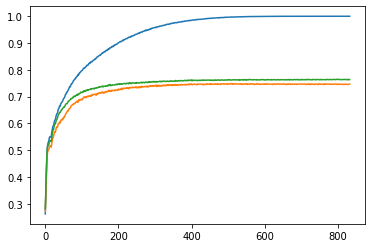

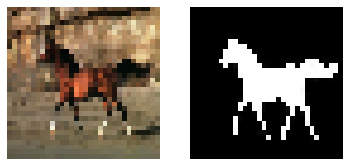

Epoch 834, Loss: 0.00578, IOU - Train: 1.0 Test: 0.762


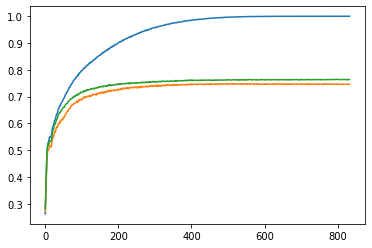

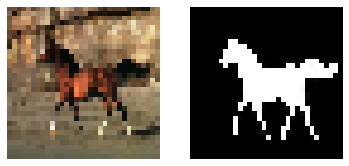

Epoch 835, Loss: 0.00534, IOU - Train: 1.0 Test: 0.762


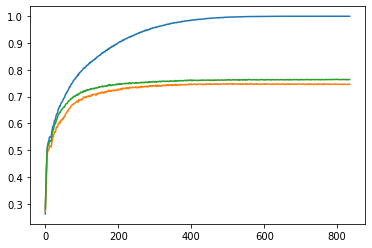

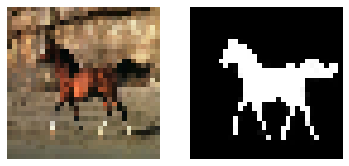

Epoch 836, Loss: 0.00563, IOU - Train: 1.0 Test: 0.762


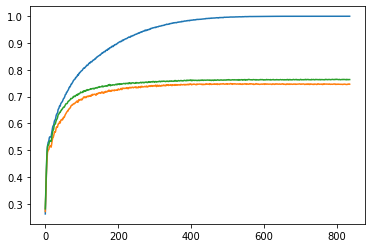

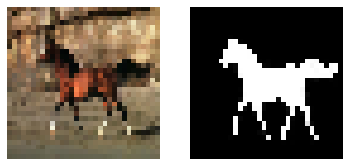

Epoch 837, Loss: 0.00542, IOU - Train: 1.0 Test: 0.762


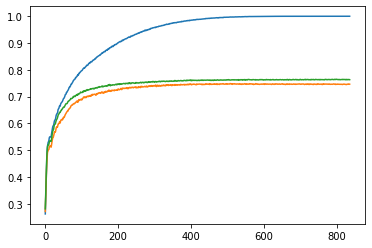

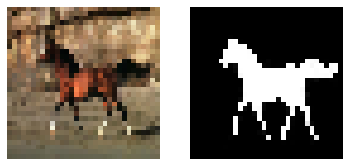

Epoch 838, Loss: 0.00552, IOU - Train: 1.0 Test: 0.762


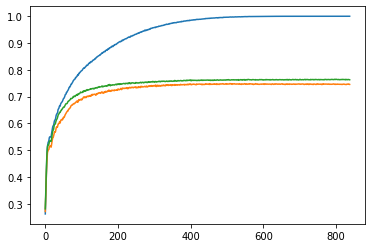

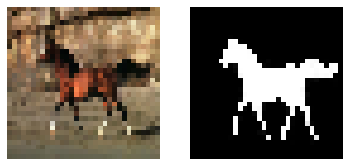

Epoch 839, Loss: 0.00547, IOU - Train: 1.0 Test: 0.762


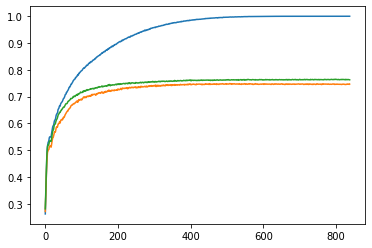

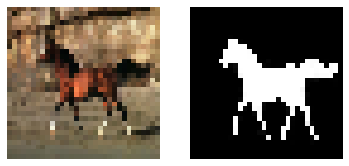

Epoch 840, Loss: 0.00535, IOU - Train: 1.0 Test: 0.762


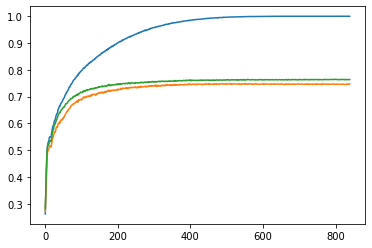

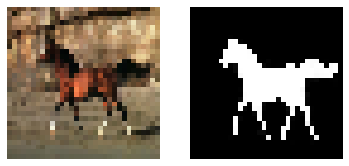

Epoch 841, Loss: 0.00558, IOU - Train: 1.0 Test: 0.762


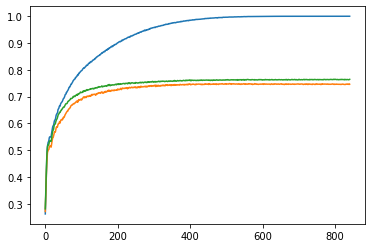

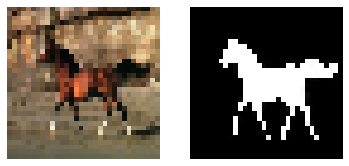

Epoch 842, Loss: 0.0055, IOU - Train: 1.0 Test: 0.762


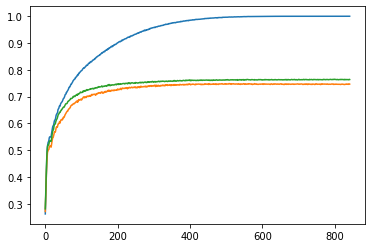

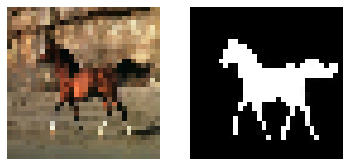

Epoch 843, Loss: 0.00531, IOU - Train: 1.0 Test: 0.762


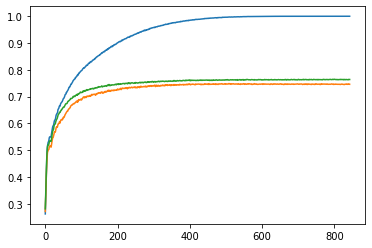

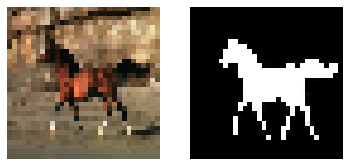

Epoch 844, Loss: 0.00532, IOU - Train: 1.0 Test: 0.762


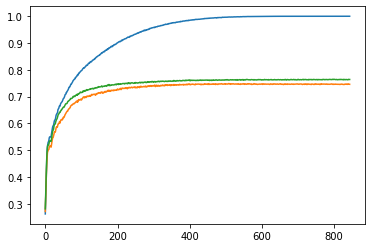

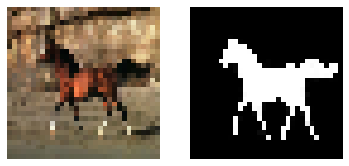

Epoch 845, Loss: 0.00505, IOU - Train: 1.0 Test: 0.762


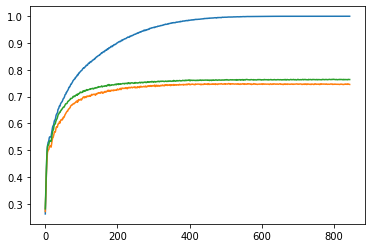

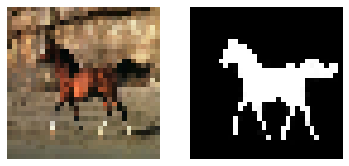

Epoch 846, Loss: 0.0051, IOU - Train: 1.0 Test: 0.762


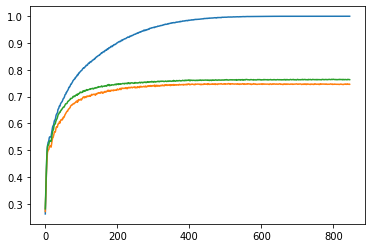

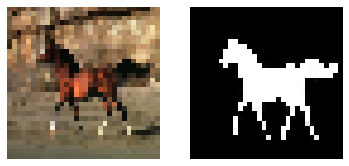

Epoch 847, Loss: 0.00522, IOU - Train: 1.0 Test: 0.762


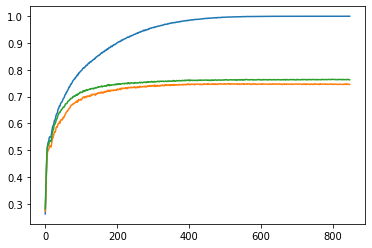

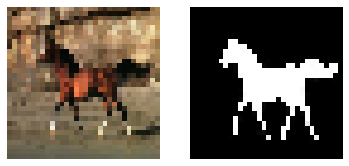

Epoch 848, Loss: 0.00526, IOU - Train: 1.0 Test: 0.762


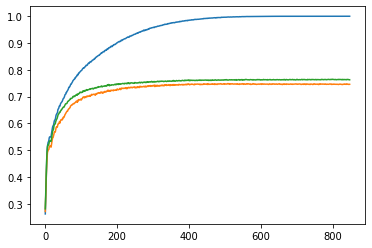

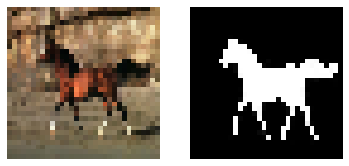

Epoch 849, Loss: 0.00494, IOU - Train: 1.0 Test: 0.762


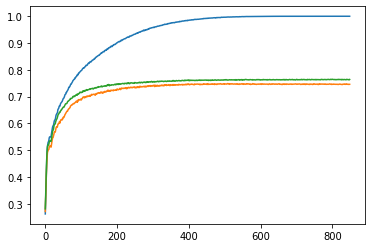

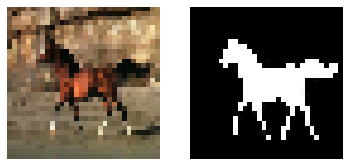

Epoch 850, Loss: 0.00526, IOU - Train: 1.0 Test: 0.762


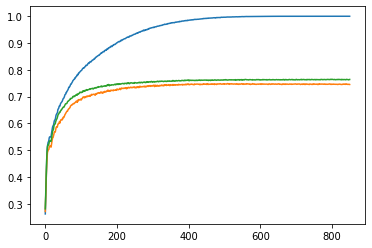

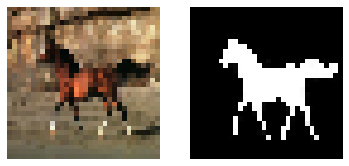

Epoch 851, Loss: 0.00505, IOU - Train: 1.0 Test: 0.762


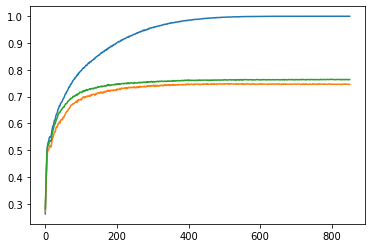

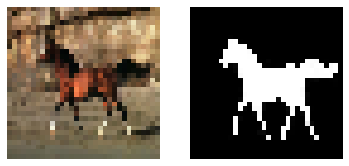

Epoch 852, Loss: 0.00516, IOU - Train: 1.0 Test: 0.762


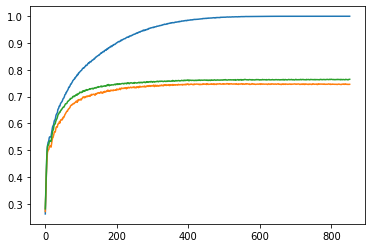

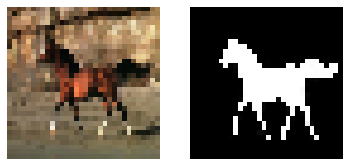

Epoch 853, Loss: 0.0053, IOU - Train: 1.0 Test: 0.762


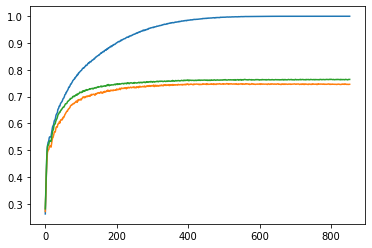

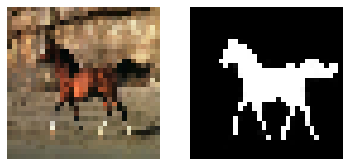

Epoch 854, Loss: 0.00527, IOU - Train: 1.0 Test: 0.762


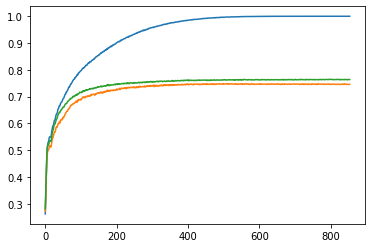

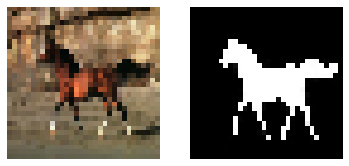

Epoch 855, Loss: 0.00491, IOU - Train: 1.0 Test: 0.762


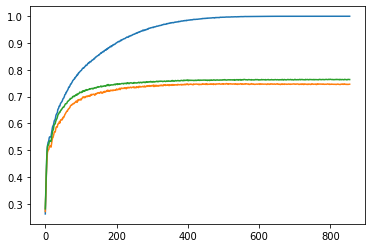

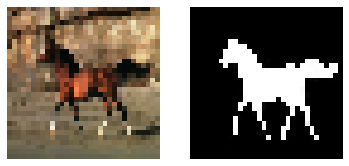

Epoch 856, Loss: 0.00504, IOU - Train: 1.0 Test: 0.762


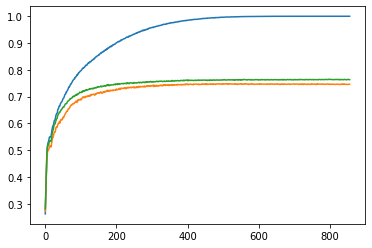

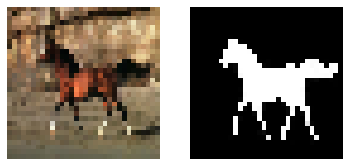

Epoch 857, Loss: 0.00515, IOU - Train: 1.0 Test: 0.762


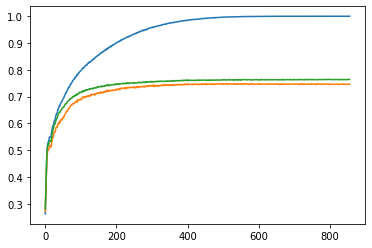

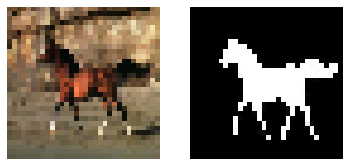

Epoch 858, Loss: 0.00487, IOU - Train: 1.0 Test: 0.762


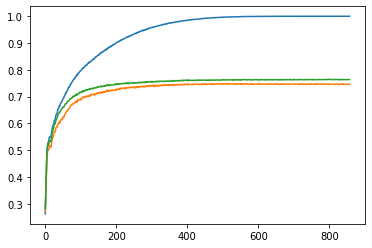

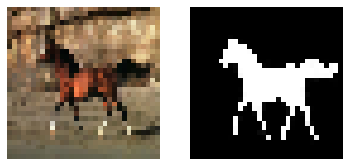

Epoch 859, Loss: 0.00481, IOU - Train: 1.0 Test: 0.762


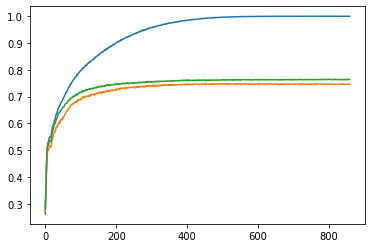

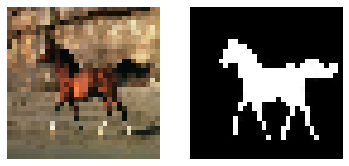

Epoch 860, Loss: 0.00498, IOU - Train: 1.0 Test: 0.762


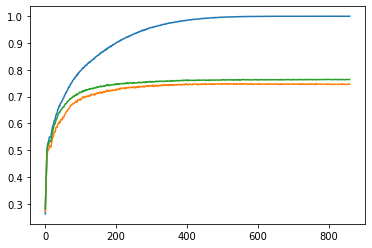

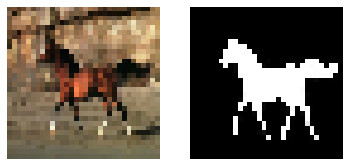

Epoch 861, Loss: 0.00474, IOU - Train: 1.0 Test: 0.762


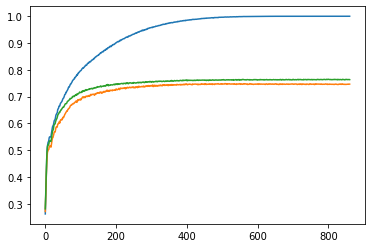

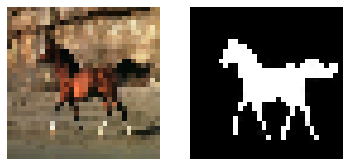

Epoch 862, Loss: 0.00485, IOU - Train: 1.0 Test: 0.762


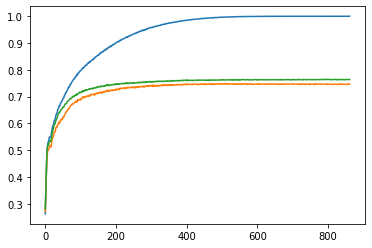

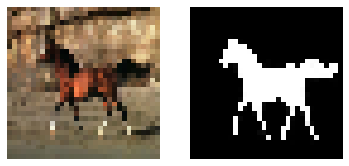

Epoch 863, Loss: 0.00514, IOU - Train: 1.0 Test: 0.762


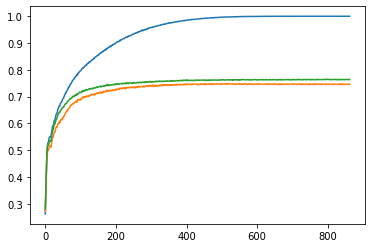

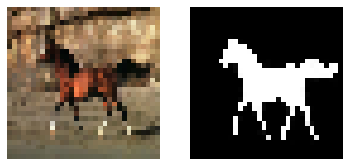

Epoch 864, Loss: 0.00486, IOU - Train: 1.0 Test: 0.762


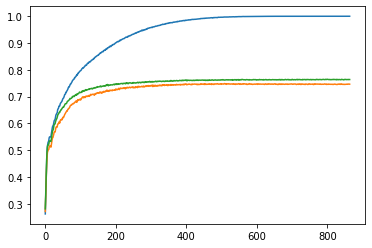

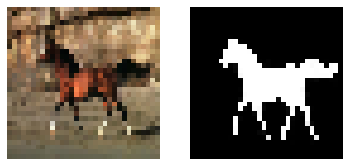

Epoch 865, Loss: 0.0051, IOU - Train: 1.0 Test: 0.762


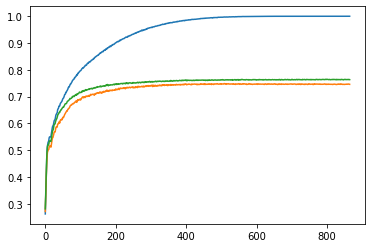

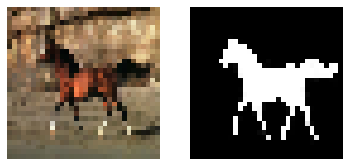

Epoch 866, Loss: 0.00508, IOU - Train: 1.0 Test: 0.762


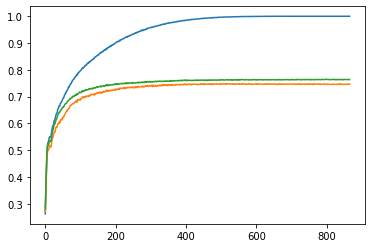

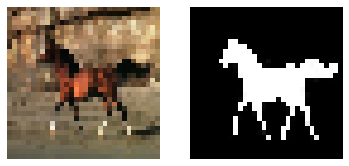

Epoch 867, Loss: 0.00495, IOU - Train: 1.0 Test: 0.762


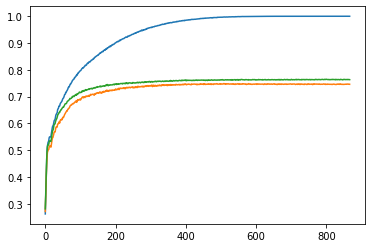

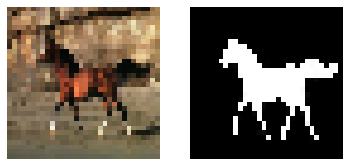

Epoch 868, Loss: 0.00482, IOU - Train: 1.0 Test: 0.762


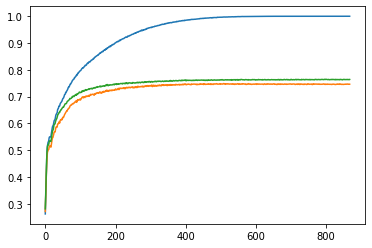

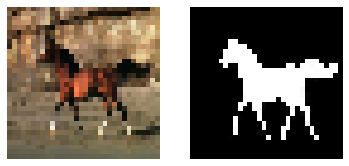

Epoch 869, Loss: 0.00496, IOU - Train: 1.0 Test: 0.762


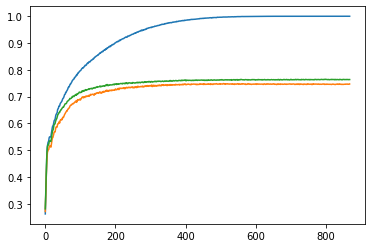

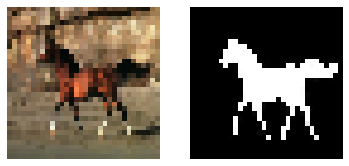

Epoch 870, Loss: 0.0051, IOU - Train: 1.0 Test: 0.762


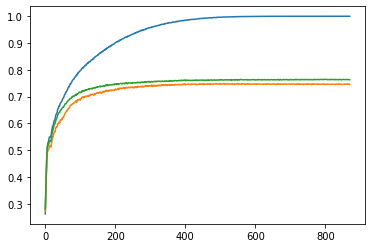

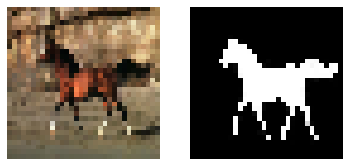

Epoch 871, Loss: 0.00468, IOU - Train: 1.0 Test: 0.762


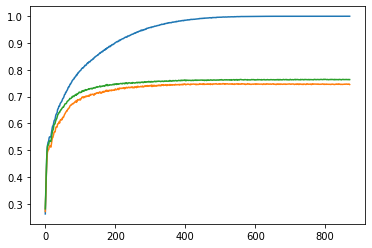

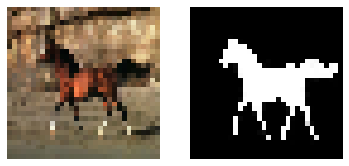

Epoch 872, Loss: 0.005, IOU - Train: 1.0 Test: 0.762


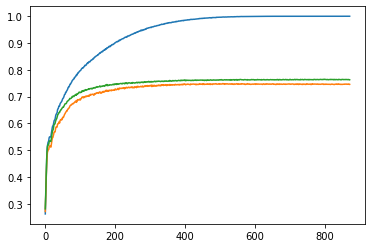

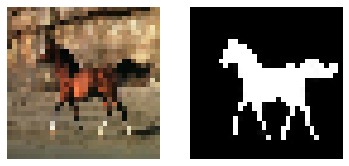

Epoch 873, Loss: 0.00463, IOU - Train: 1.0 Test: 0.762


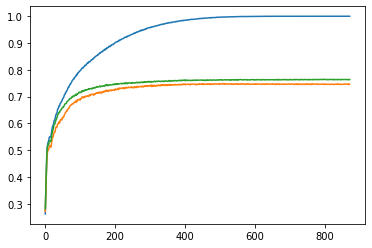

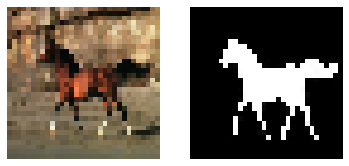

Epoch 874, Loss: 0.00479, IOU - Train: 1.0 Test: 0.762


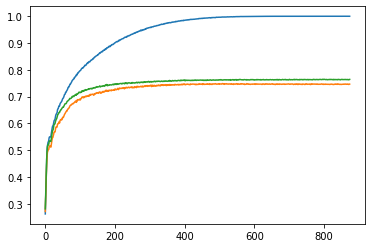

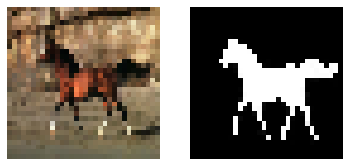

Epoch 875, Loss: 0.0047, IOU - Train: 1.0 Test: 0.762


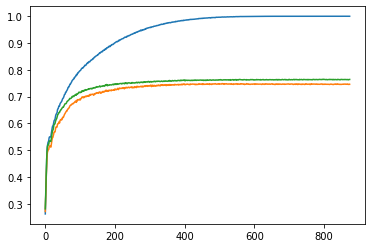

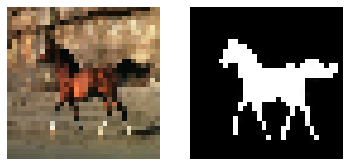

Epoch 876, Loss: 0.00475, IOU - Train: 1.0 Test: 0.762


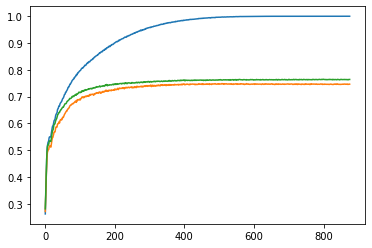

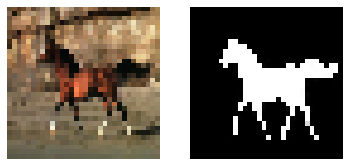

Epoch 877, Loss: 0.00468, IOU - Train: 1.0 Test: 0.762


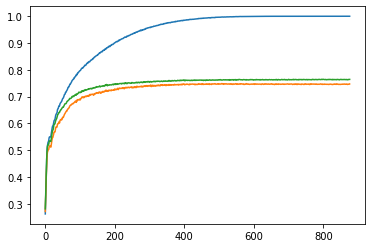

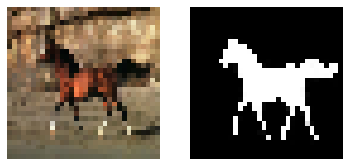

Epoch 878, Loss: 0.00462, IOU - Train: 1.0 Test: 0.762


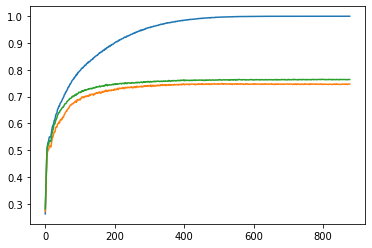

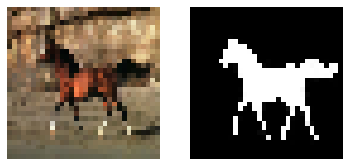

Epoch 879, Loss: 0.00469, IOU - Train: 1.0 Test: 0.762


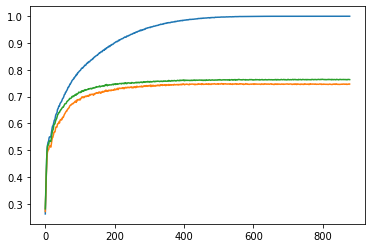

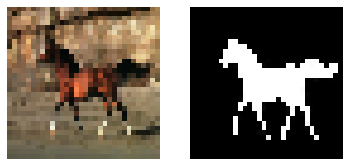

Epoch 880, Loss: 0.00423, IOU - Train: 1.0 Test: 0.762


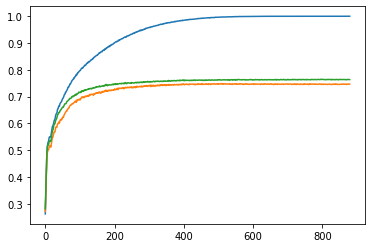

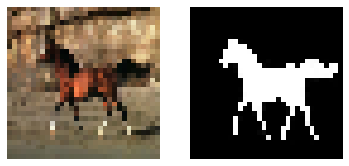

Epoch 881, Loss: 0.00465, IOU - Train: 1.0 Test: 0.762


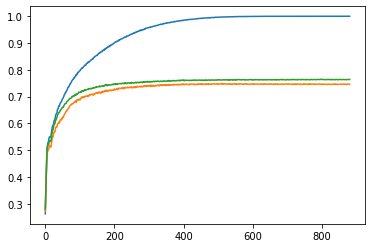

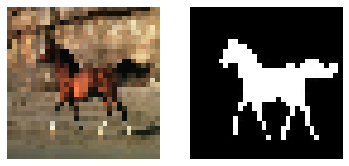

Epoch 882, Loss: 0.00427, IOU - Train: 1.0 Test: 0.762


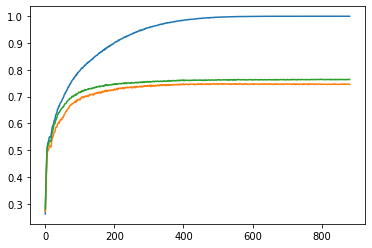

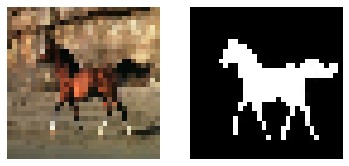

Epoch 883, Loss: 0.00465, IOU - Train: 1.0 Test: 0.762


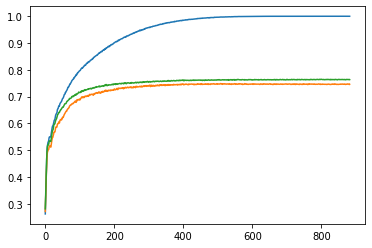

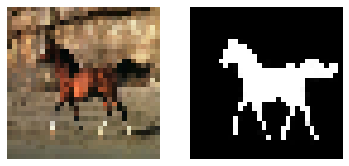

Epoch 884, Loss: 0.00462, IOU - Train: 1.0 Test: 0.762


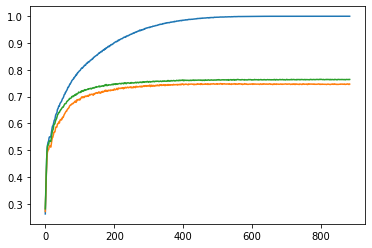

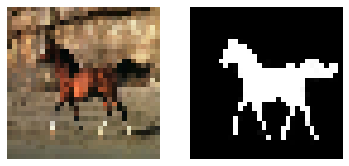

Epoch 885, Loss: 0.0045, IOU - Train: 1.0 Test: 0.762


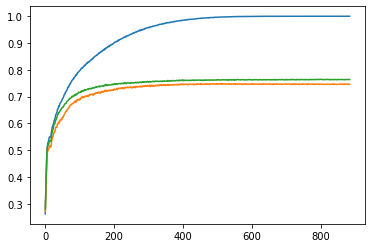

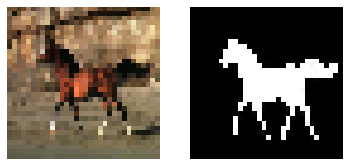

Epoch 886, Loss: 0.00451, IOU - Train: 1.0 Test: 0.762


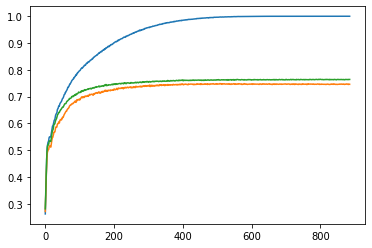

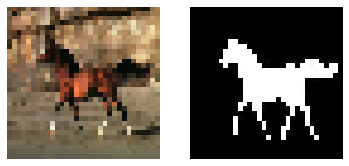

Epoch 887, Loss: 0.00444, IOU - Train: 1.0 Test: 0.762


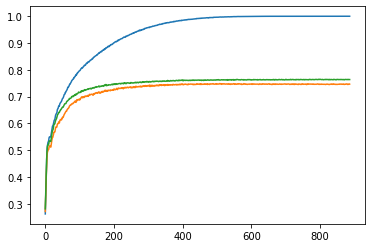

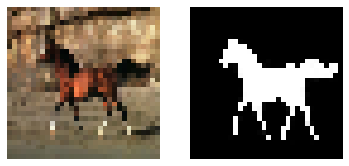

Epoch 888, Loss: 0.00452, IOU - Train: 1.0 Test: 0.762


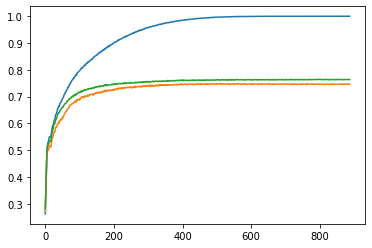

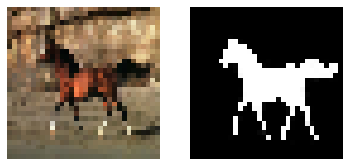

Epoch 889, Loss: 0.0044, IOU - Train: 1.0 Test: 0.762


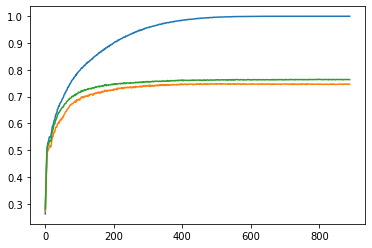

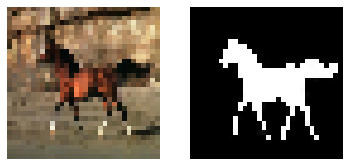

Epoch 890, Loss: 0.00411, IOU - Train: 1.0 Test: 0.762


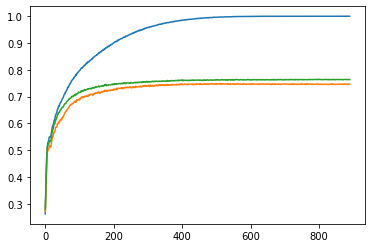

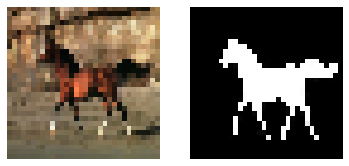

Epoch 891, Loss: 0.00444, IOU - Train: 1.0 Test: 0.762


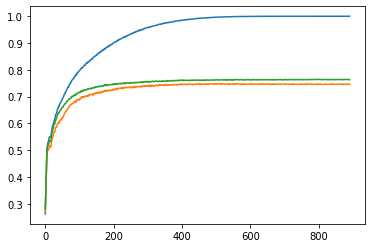

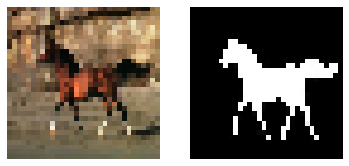

Epoch 892, Loss: 0.00417, IOU - Train: 1.0 Test: 0.762


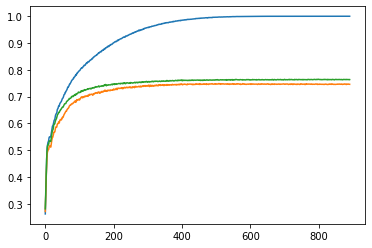

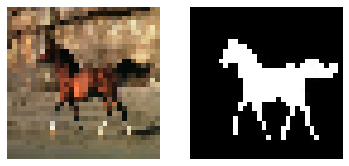

Epoch 893, Loss: 0.00413, IOU - Train: 1.0 Test: 0.762


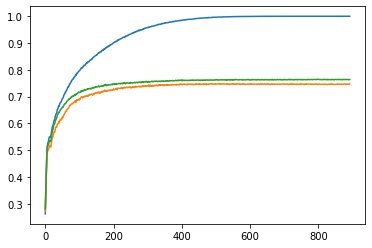

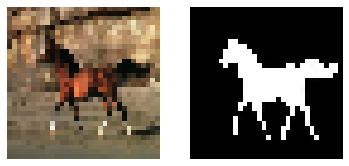

Epoch 894, Loss: 0.00422, IOU - Train: 1.0 Test: 0.762


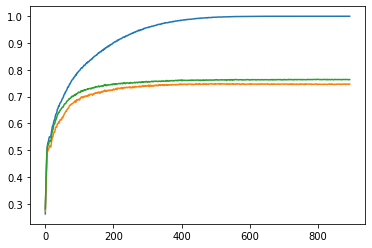

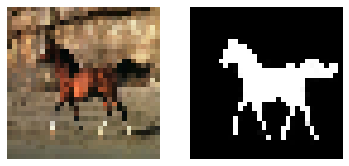

Epoch 895, Loss: 0.00439, IOU - Train: 1.0 Test: 0.762


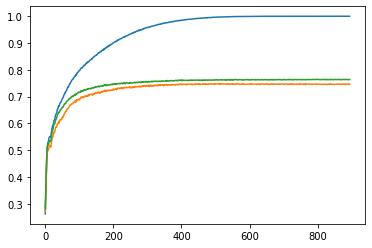

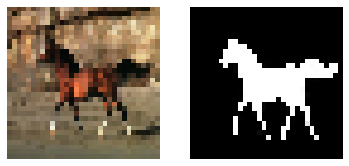

Epoch 896, Loss: 0.00424, IOU - Train: 1.0 Test: 0.762


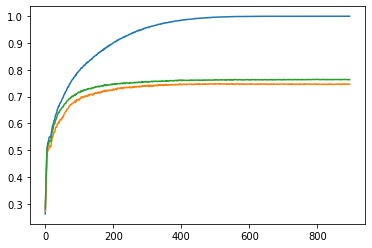

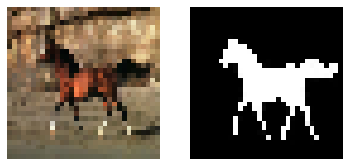

Epoch 897, Loss: 0.00406, IOU - Train: 1.0 Test: 0.762


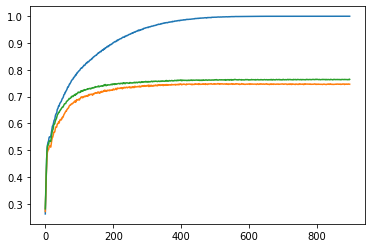

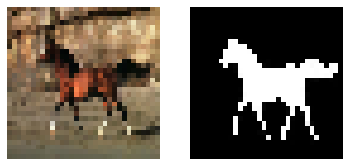

Epoch 898, Loss: 0.00392, IOU - Train: 1.0 Test: 0.762


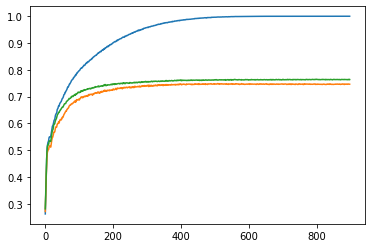

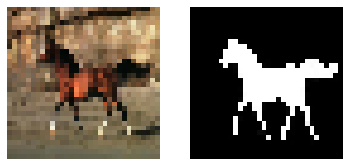

Epoch 899, Loss: 0.00417, IOU - Train: 1.0 Test: 0.762


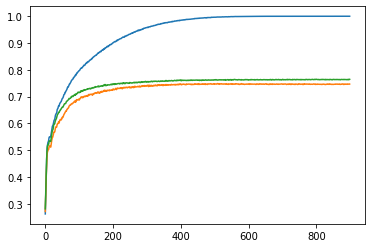

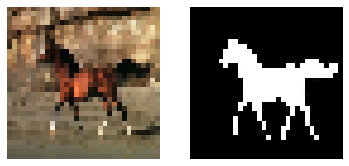

Epoch 900, Loss: 0.00422, IOU - Train: 1.0 Test: 0.762


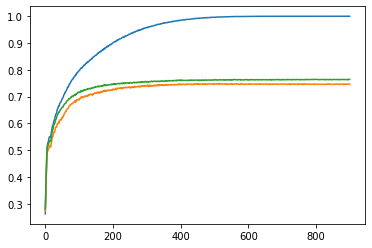

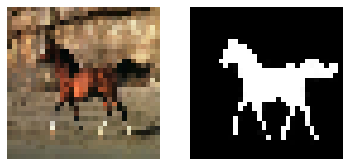

Epoch 901, Loss: 0.00434, IOU - Train: 1.0 Test: 0.762


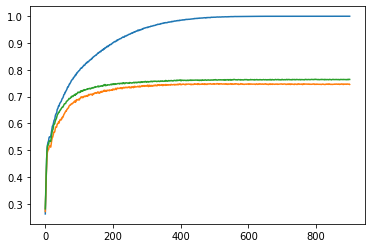

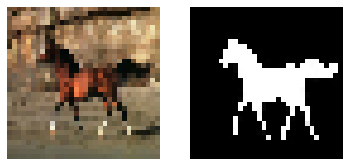

Epoch 902, Loss: 0.00429, IOU - Train: 1.0 Test: 0.762


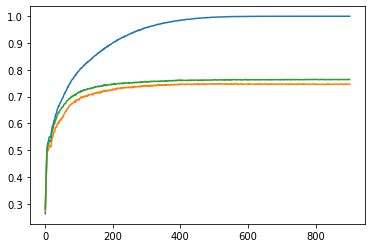

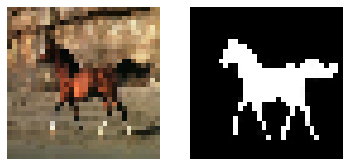

Epoch 903, Loss: 0.00433, IOU - Train: 1.0 Test: 0.762


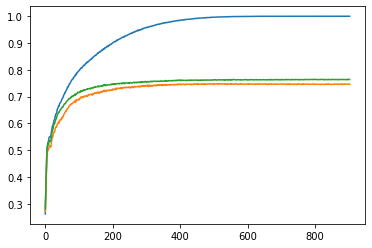

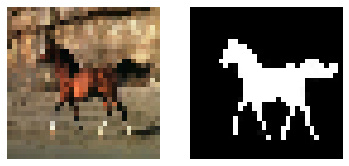

Epoch 904, Loss: 0.00388, IOU - Train: 1.0 Test: 0.762


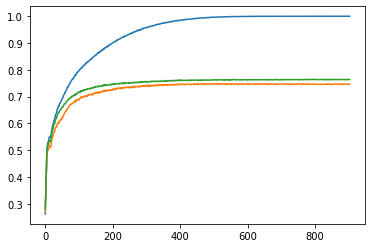

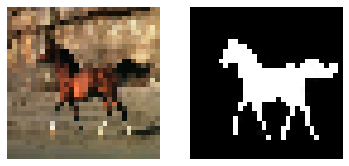

Epoch 905, Loss: 0.00445, IOU - Train: 1.0 Test: 0.762


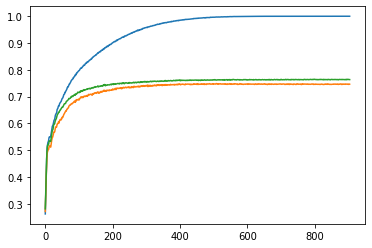

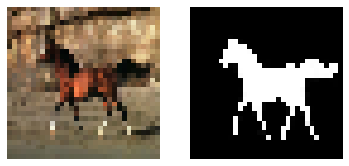

Epoch 906, Loss: 0.00419, IOU - Train: 1.0 Test: 0.762


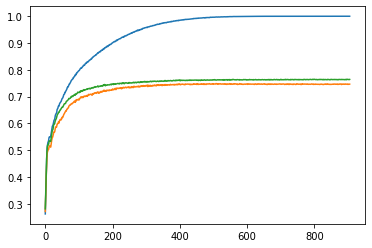

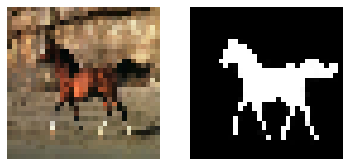

Epoch 907, Loss: 0.00396, IOU - Train: 1.0 Test: 0.762


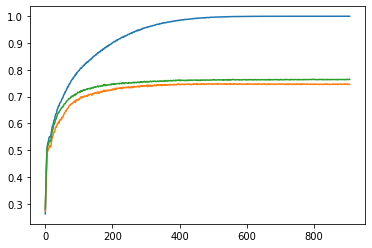

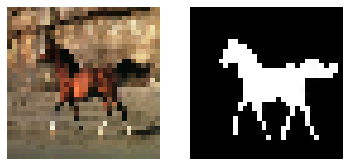

Epoch 908, Loss: 0.00398, IOU - Train: 1.0 Test: 0.762


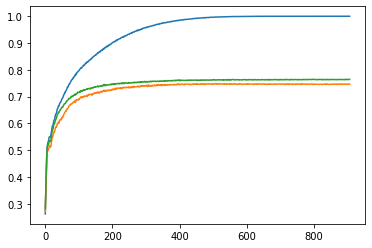

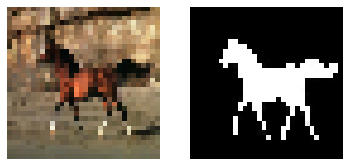

Epoch 909, Loss: 0.00429, IOU - Train: 1.0 Test: 0.762


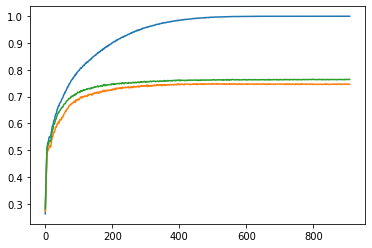

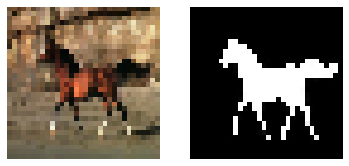

Epoch 910, Loss: 0.00379, IOU - Train: 1.0 Test: 0.762


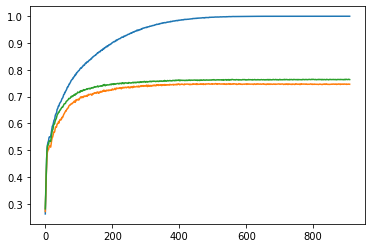

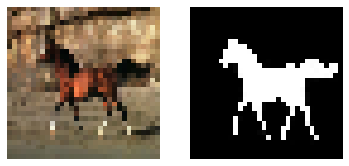

Epoch 911, Loss: 0.0039, IOU - Train: 1.0 Test: 0.762


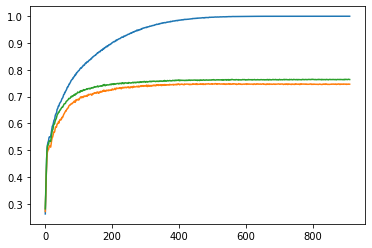

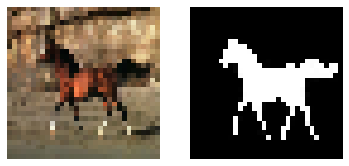

Epoch 912, Loss: 0.00383, IOU - Train: 1.0 Test: 0.762


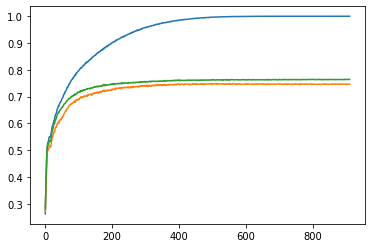

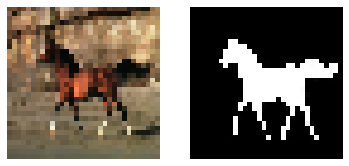

Epoch 913, Loss: 0.00408, IOU - Train: 1.0 Test: 0.762


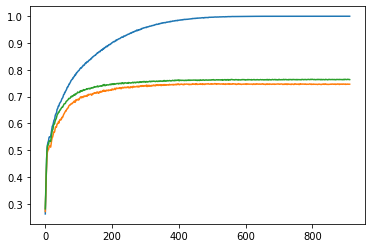

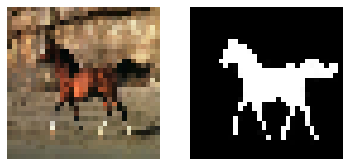

Epoch 914, Loss: 0.00376, IOU - Train: 1.0 Test: 0.762


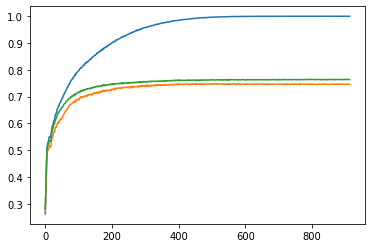

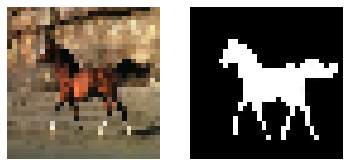

Epoch 915, Loss: 0.00396, IOU - Train: 1.0 Test: 0.762


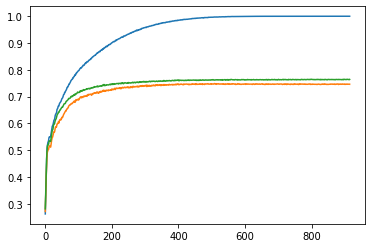

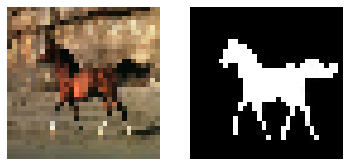

Epoch 916, Loss: 0.00408, IOU - Train: 1.0 Test: 0.762


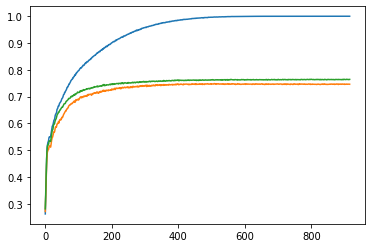

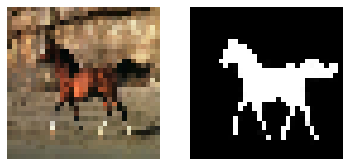

Epoch 917, Loss: 0.00374, IOU - Train: 1.0 Test: 0.762


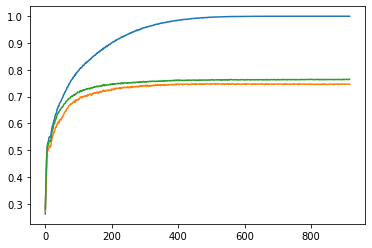

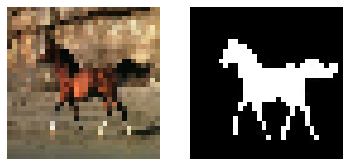

Epoch 918, Loss: 0.00364, IOU - Train: 1.0 Test: 0.762


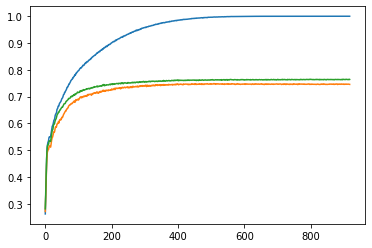

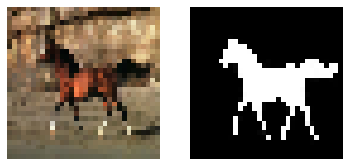

Epoch 919, Loss: 0.00355, IOU - Train: 1.0 Test: 0.762


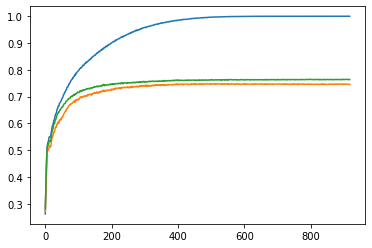

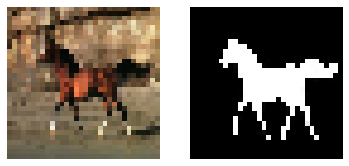

Epoch 920, Loss: 0.00371, IOU - Train: 1.0 Test: 0.762


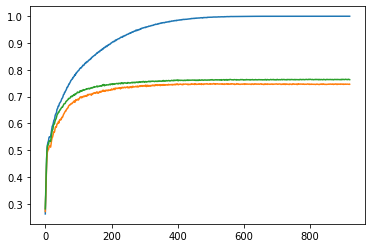

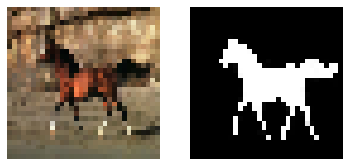

Epoch 921, Loss: 0.00365, IOU - Train: 1.0 Test: 0.762


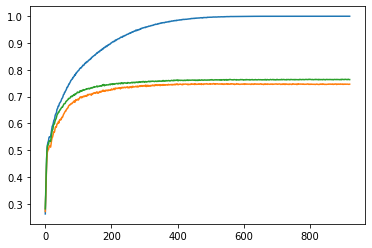

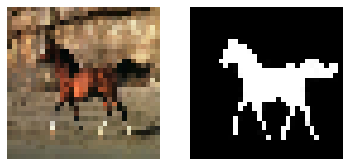

Epoch 922, Loss: 0.00372, IOU - Train: 1.0 Test: 0.762


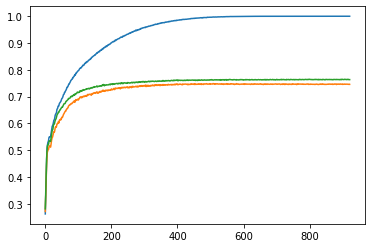

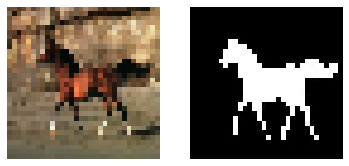

Epoch 923, Loss: 0.00376, IOU - Train: 1.0 Test: 0.762


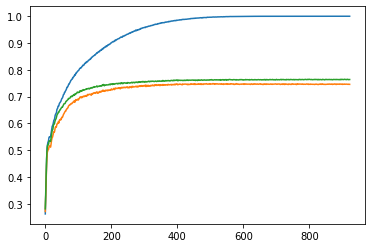

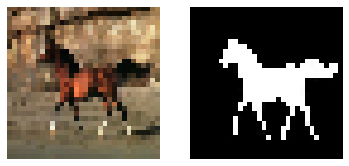

Epoch 924, Loss: 0.00357, IOU - Train: 1.0 Test: 0.762


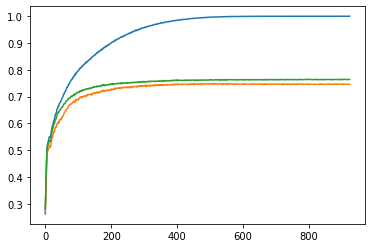

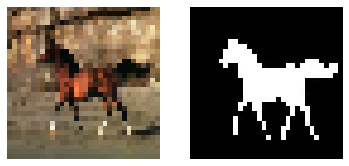

Epoch 925, Loss: 0.00384, IOU - Train: 1.0 Test: 0.762


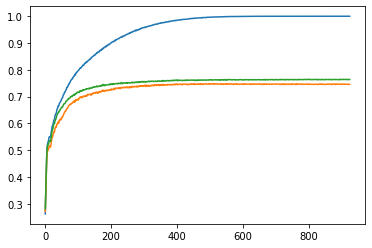

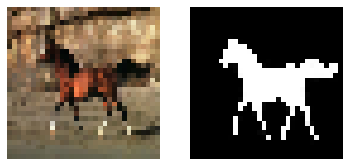

Epoch 926, Loss: 0.00371, IOU - Train: 1.0 Test: 0.762


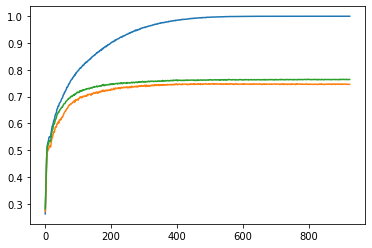

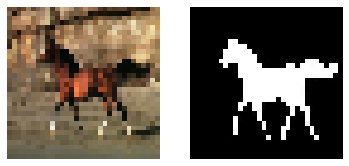

Epoch 927, Loss: 0.00367, IOU - Train: 1.0 Test: 0.762


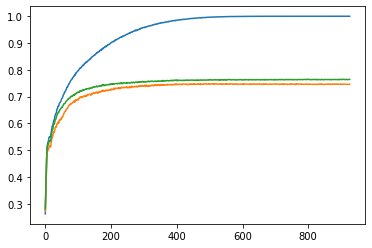

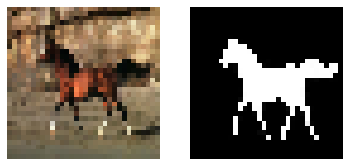

Epoch 928, Loss: 0.00362, IOU - Train: 1.0 Test: 0.762


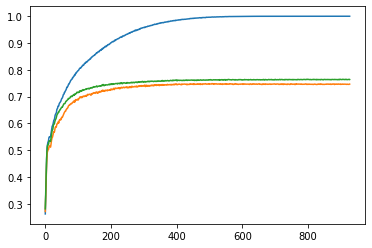

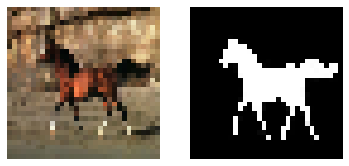

Epoch 929, Loss: 0.00378, IOU - Train: 1.0 Test: 0.762


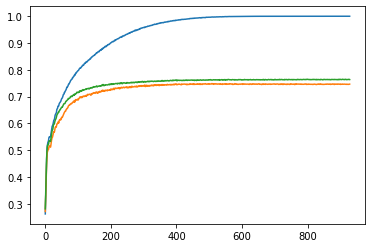

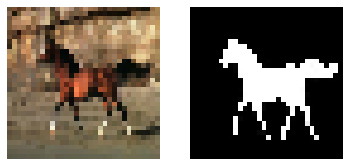

Epoch 930, Loss: 0.00361, IOU - Train: 1.0 Test: 0.762


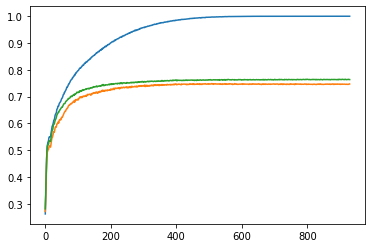

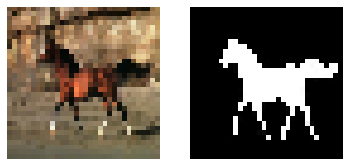

Epoch 931, Loss: 0.00363, IOU - Train: 1.0 Test: 0.762


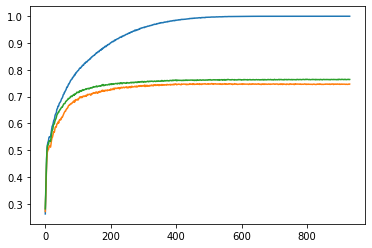

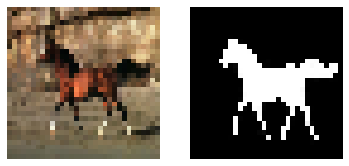

Epoch 932, Loss: 0.00372, IOU - Train: 1.0 Test: 0.762


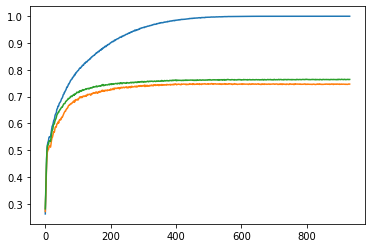

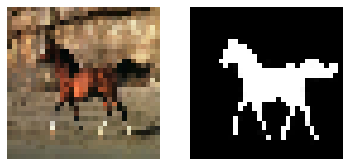

Epoch 933, Loss: 0.00361, IOU - Train: 1.0 Test: 0.762


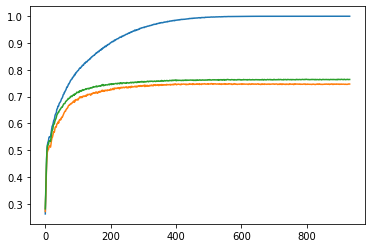

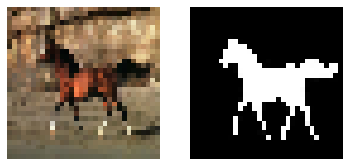

Epoch 934, Loss: 0.00346, IOU - Train: 1.0 Test: 0.762


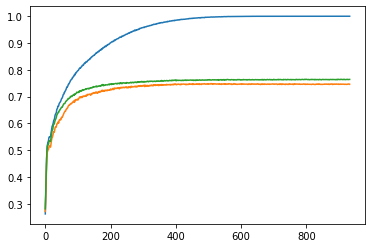

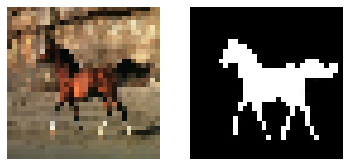

Epoch 935, Loss: 0.00339, IOU - Train: 1.0 Test: 0.762


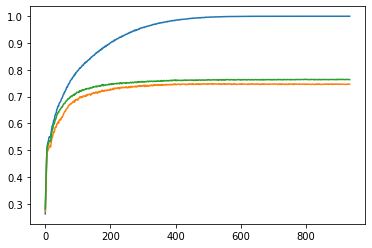

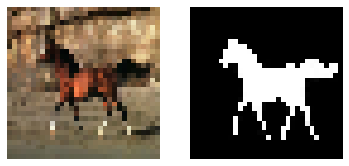

Epoch 936, Loss: 0.00357, IOU - Train: 1.0 Test: 0.762


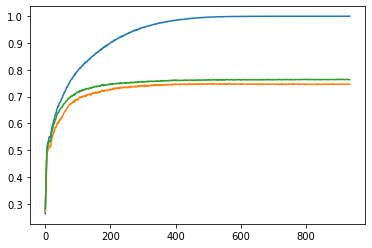

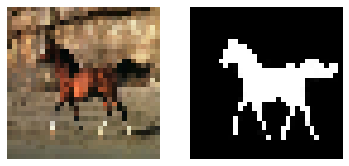

Epoch 937, Loss: 0.00367, IOU - Train: 1.0 Test: 0.762


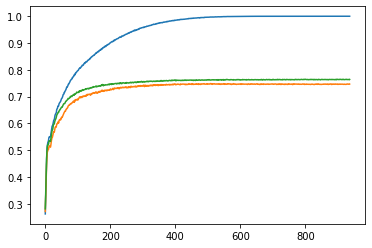

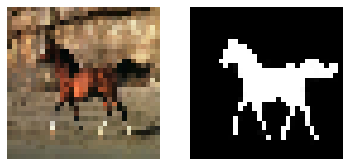

Epoch 938, Loss: 0.00353, IOU - Train: 1.0 Test: 0.762


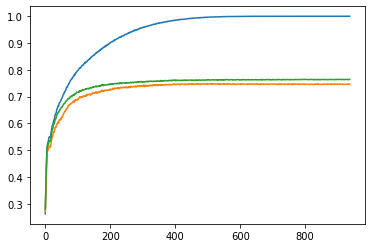

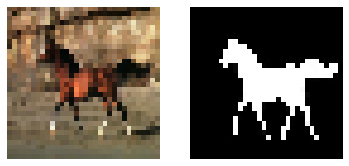

Epoch 939, Loss: 0.00363, IOU - Train: 1.0 Test: 0.762


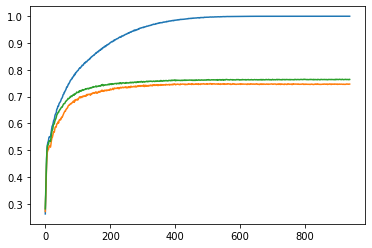

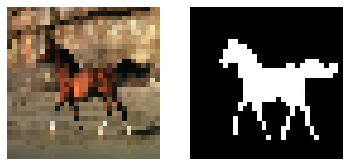

Epoch 940, Loss: 0.00343, IOU - Train: 1.0 Test: 0.762


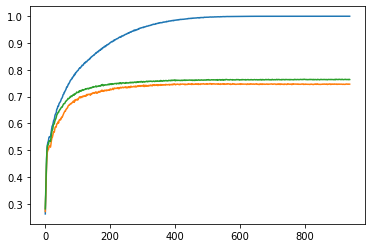

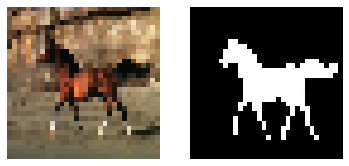

Epoch 941, Loss: 0.00348, IOU - Train: 1.0 Test: 0.762


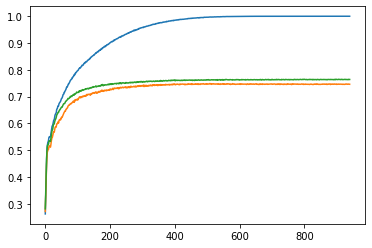

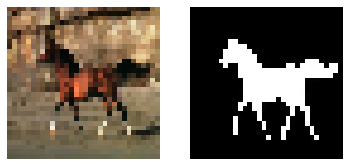

Epoch 942, Loss: 0.00333, IOU - Train: 1.0 Test: 0.762


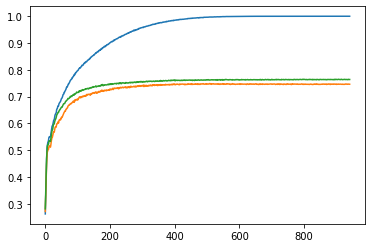

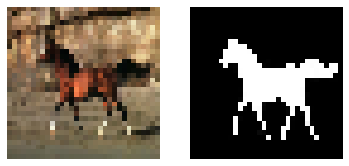

Epoch 943, Loss: 0.00315, IOU - Train: 1.0 Test: 0.762


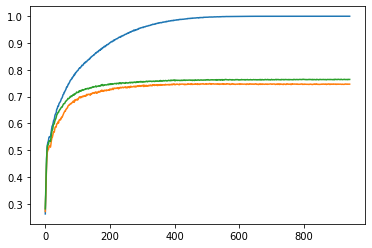

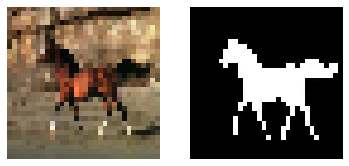

Epoch 944, Loss: 0.00338, IOU - Train: 1.0 Test: 0.762


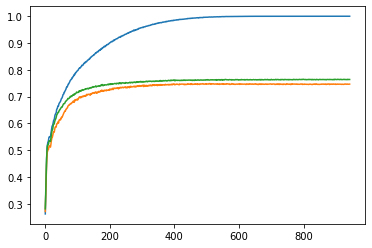

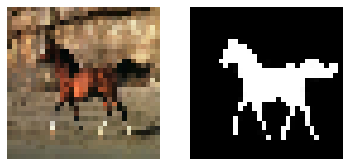

Epoch 945, Loss: 0.00328, IOU - Train: 1.0 Test: 0.762


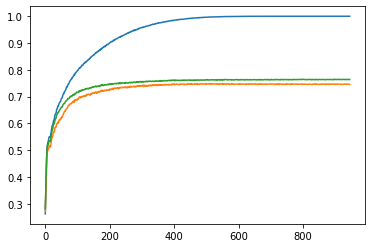

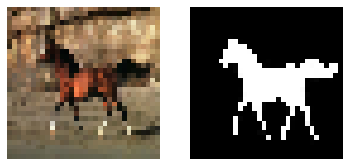

Epoch 946, Loss: 0.00327, IOU - Train: 1.0 Test: 0.762


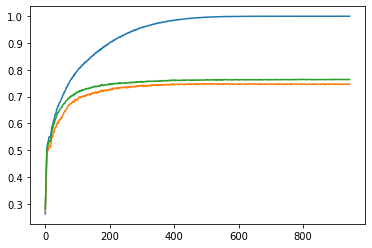

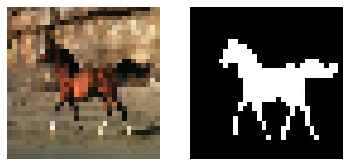

Epoch 947, Loss: 0.00341, IOU - Train: 1.0 Test: 0.762


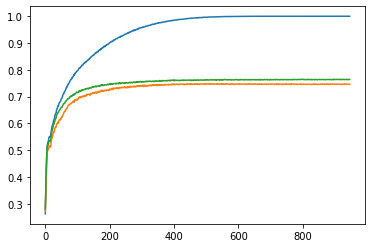

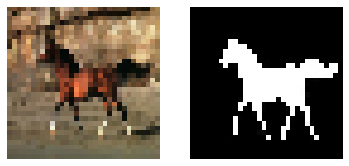

Epoch 948, Loss: 0.0033, IOU - Train: 1.0 Test: 0.762


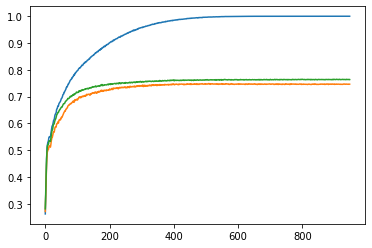

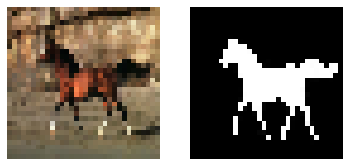

Epoch 949, Loss: 0.00334, IOU - Train: 1.0 Test: 0.762


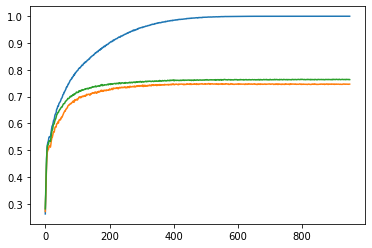

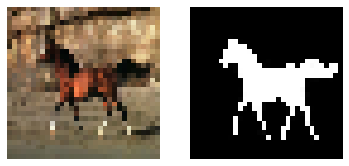

Epoch 950, Loss: 0.00323, IOU - Train: 1.0 Test: 0.762


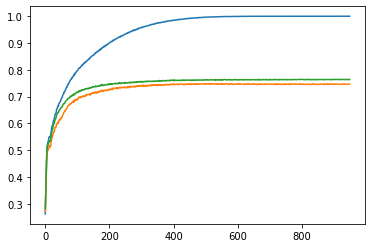

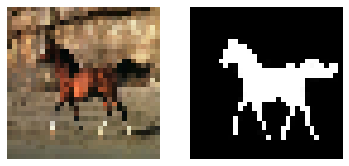

Epoch 951, Loss: 0.00339, IOU - Train: 1.0 Test: 0.762


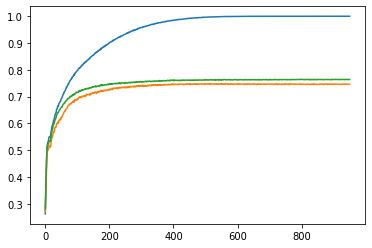

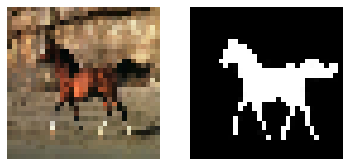

Epoch 952, Loss: 0.00325, IOU - Train: 1.0 Test: 0.762


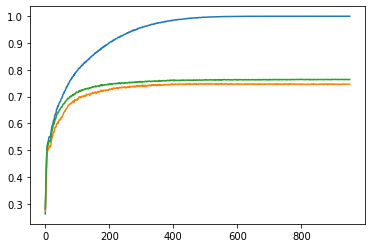

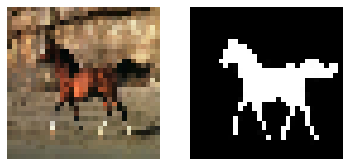

Epoch 953, Loss: 0.00324, IOU - Train: 1.0 Test: 0.762


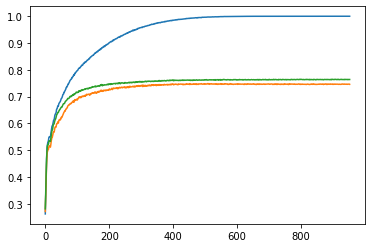

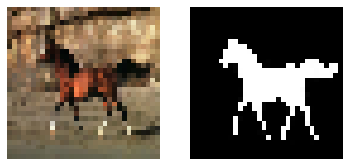

Epoch 954, Loss: 0.00305, IOU - Train: 1.0 Test: 0.762


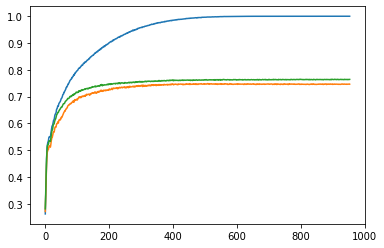

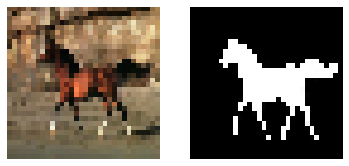

Epoch 955, Loss: 0.00317, IOU - Train: 1.0 Test: 0.762


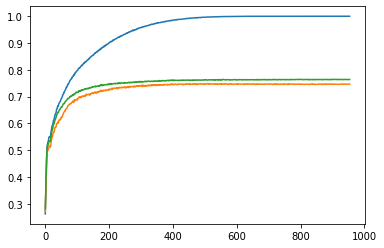

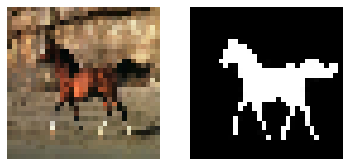

Epoch 956, Loss: 0.00335, IOU - Train: 1.0 Test: 0.762


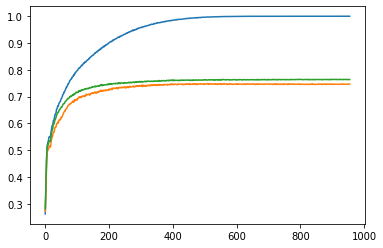

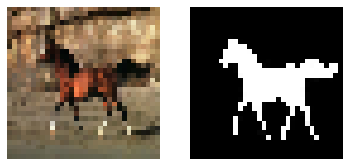

Epoch 957, Loss: 0.00327, IOU - Train: 1.0 Test: 0.762


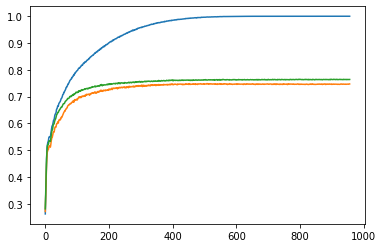

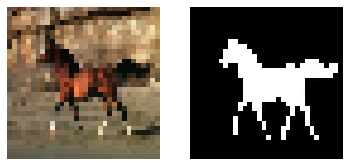

Epoch 958, Loss: 0.00317, IOU - Train: 1.0 Test: 0.762


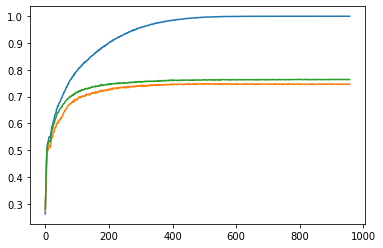

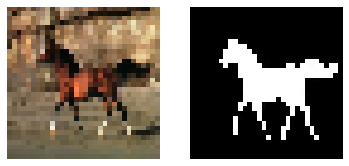

Epoch 959, Loss: 0.00313, IOU - Train: 1.0 Test: 0.762


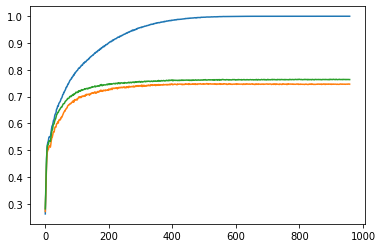

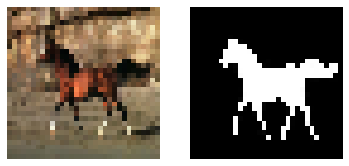

Epoch 960, Loss: 0.00321, IOU - Train: 1.0 Test: 0.762


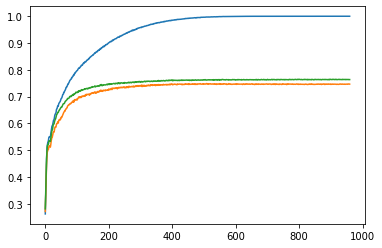

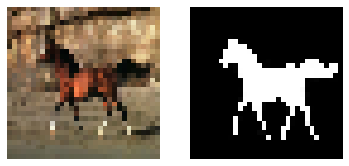

Epoch 961, Loss: 0.00312, IOU - Train: 1.0 Test: 0.762


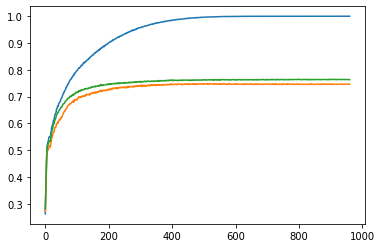

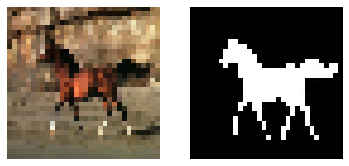

Epoch 962, Loss: 0.0032, IOU - Train: 1.0 Test: 0.762


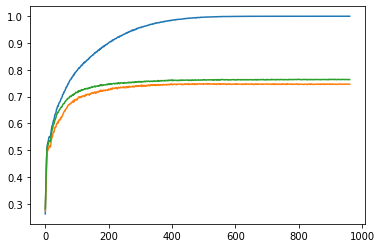

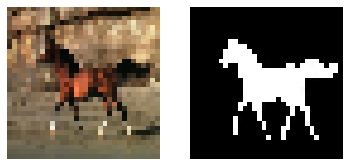

Epoch 963, Loss: 0.00326, IOU - Train: 1.0 Test: 0.762


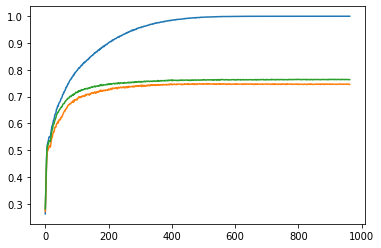

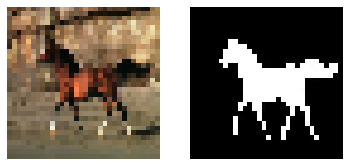

Epoch 964, Loss: 0.00321, IOU - Train: 1.0 Test: 0.762


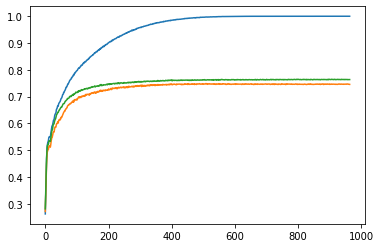

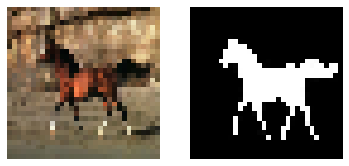

Epoch 965, Loss: 0.00329, IOU - Train: 1.0 Test: 0.762


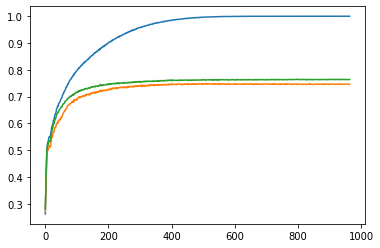

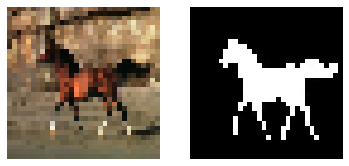

Epoch 966, Loss: 0.00348, IOU - Train: 1.0 Test: 0.762


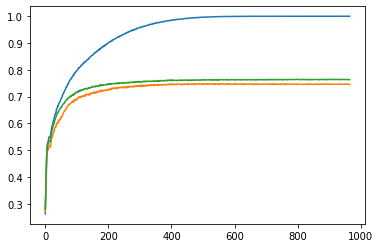

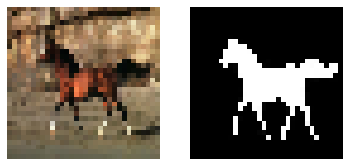

Epoch 967, Loss: 0.00293, IOU - Train: 1.0 Test: 0.762


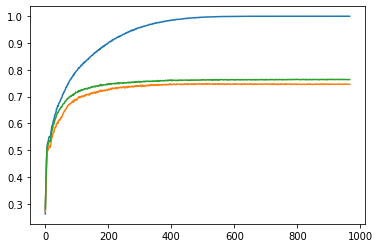

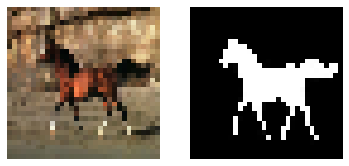

Epoch 968, Loss: 0.00289, IOU - Train: 1.0 Test: 0.762


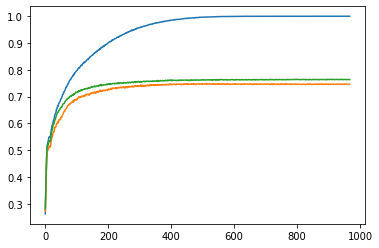

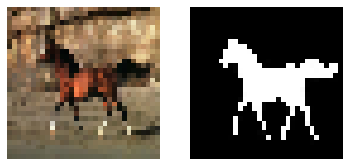

Epoch 969, Loss: 0.00321, IOU - Train: 1.0 Test: 0.762


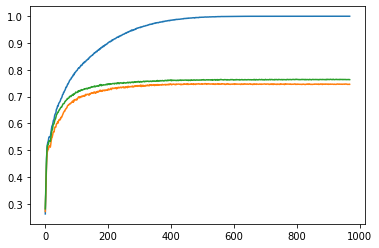

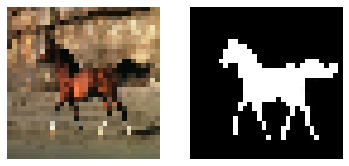

Epoch 970, Loss: 0.00308, IOU - Train: 1.0 Test: 0.762


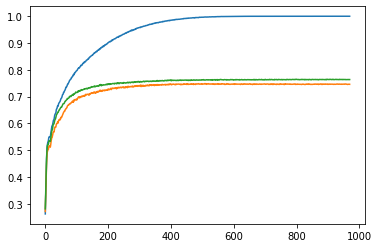

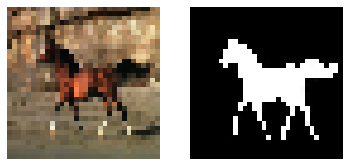

Epoch 971, Loss: 0.0031, IOU - Train: 1.0 Test: 0.762


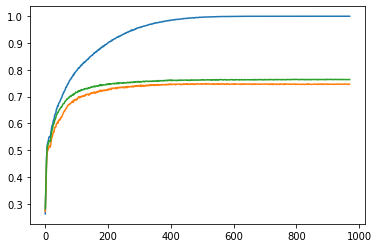

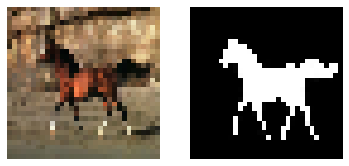

Epoch 972, Loss: 0.00297, IOU - Train: 1.0 Test: 0.762


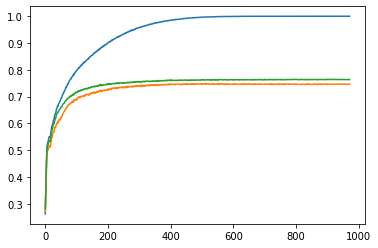

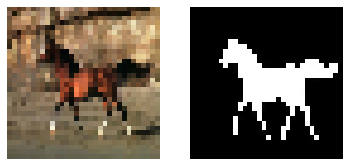

Epoch 973, Loss: 0.00292, IOU - Train: 1.0 Test: 0.762


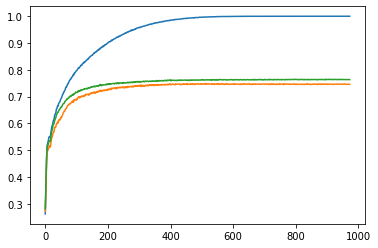

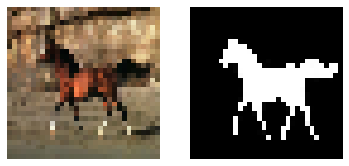

Epoch 974, Loss: 0.00292, IOU - Train: 1.0 Test: 0.762


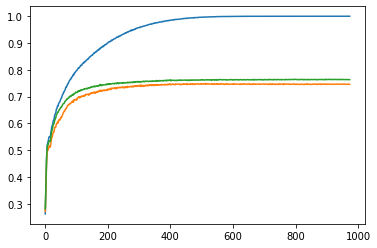

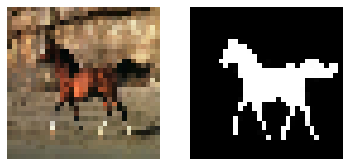

Epoch 975, Loss: 0.00299, IOU - Train: 1.0 Test: 0.762


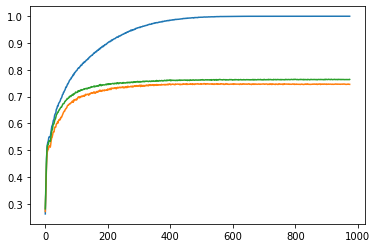

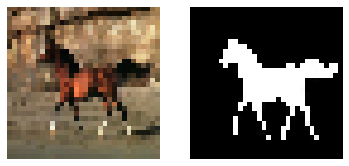

Epoch 976, Loss: 0.00315, IOU - Train: 1.0 Test: 0.762


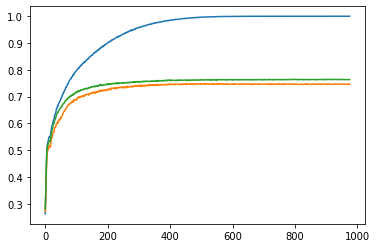

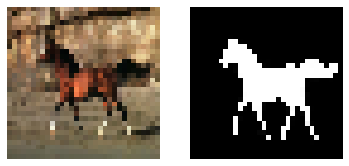

Epoch 977, Loss: 0.00294, IOU - Train: 1.0 Test: 0.762


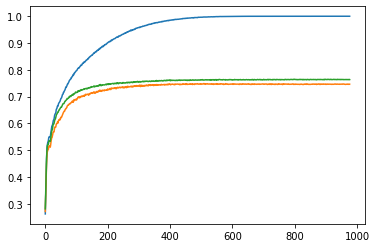

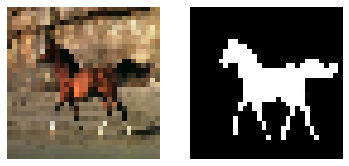

Epoch 978, Loss: 0.00294, IOU - Train: 1.0 Test: 0.762


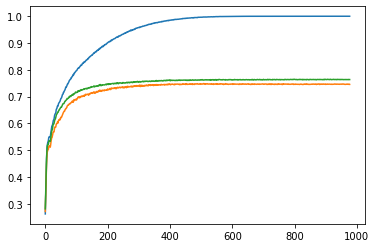

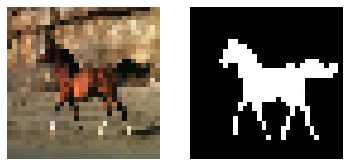

Epoch 979, Loss: 0.00296, IOU - Train: 1.0 Test: 0.762


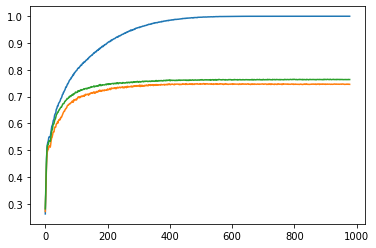

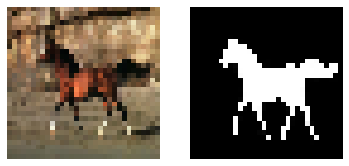

Epoch 980, Loss: 0.00322, IOU - Train: 1.0 Test: 0.762


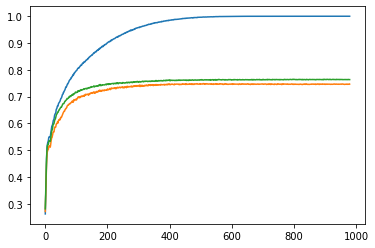

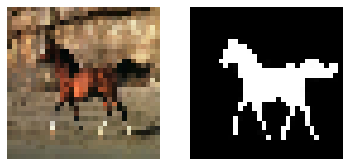

Epoch 981, Loss: 0.003, IOU - Train: 1.0 Test: 0.762


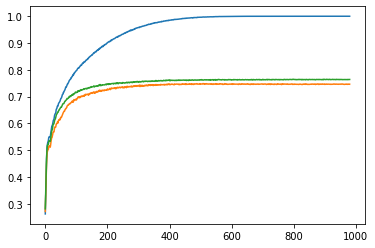

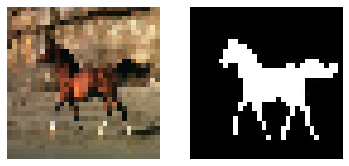

Epoch 982, Loss: 0.00292, IOU - Train: 1.0 Test: 0.762


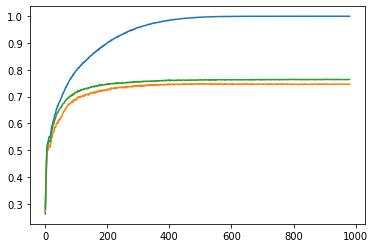

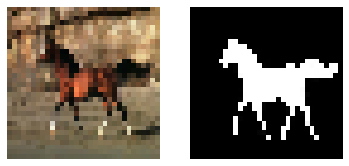

Epoch 983, Loss: 0.00285, IOU - Train: 1.0 Test: 0.762


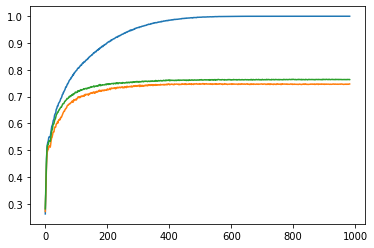

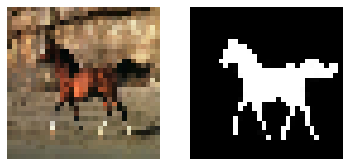

Epoch 984, Loss: 0.00269, IOU - Train: 1.0 Test: 0.762


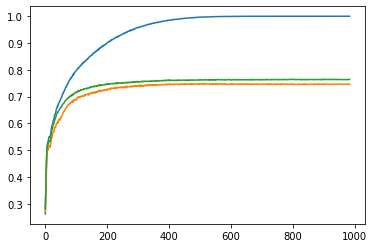

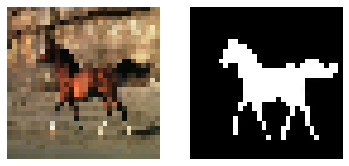

Epoch 985, Loss: 0.00296, IOU - Train: 1.0 Test: 0.762


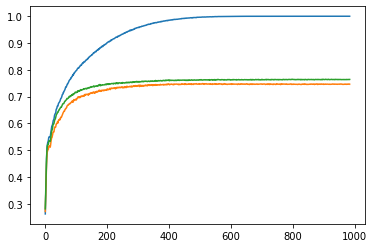

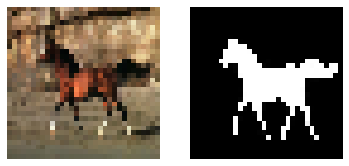

Epoch 986, Loss: 0.00264, IOU - Train: 1.0 Test: 0.762


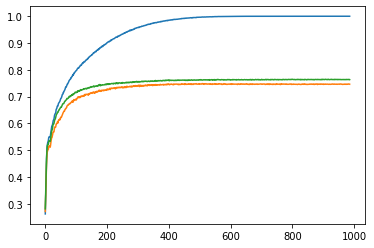

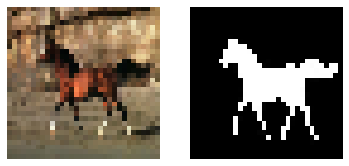

Epoch 987, Loss: 0.00278, IOU - Train: 1.0 Test: 0.762


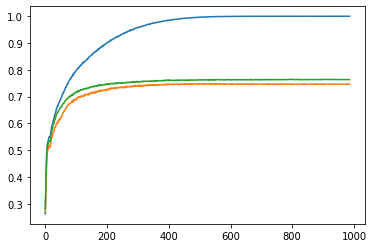

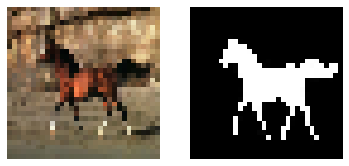

Epoch 988, Loss: 0.003, IOU - Train: 1.0 Test: 0.762


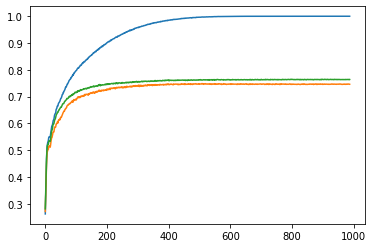

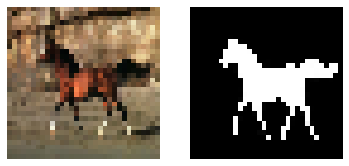

Epoch 989, Loss: 0.00277, IOU - Train: 1.0 Test: 0.762


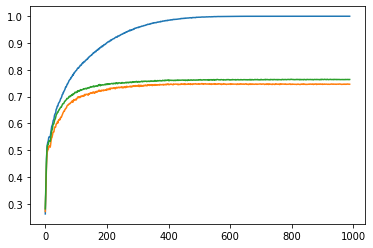

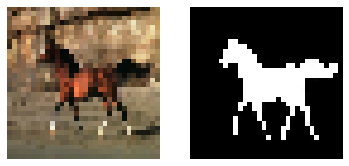

Epoch 990, Loss: 0.00304, IOU - Train: 1.0 Test: 0.762


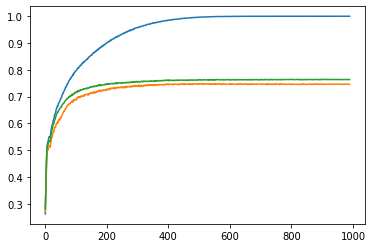

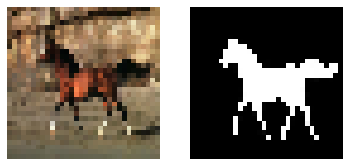

Epoch 991, Loss: 0.0028, IOU - Train: 1.0 Test: 0.762


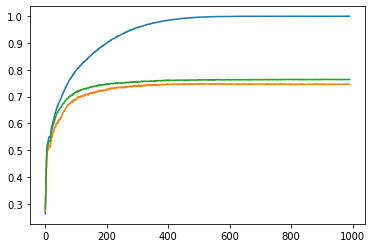

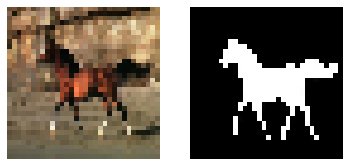

Epoch 992, Loss: 0.00277, IOU - Train: 1.0 Test: 0.762


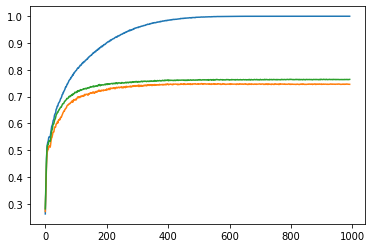

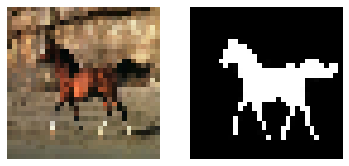

Epoch 993, Loss: 0.00276, IOU - Train: 1.0 Test: 0.762


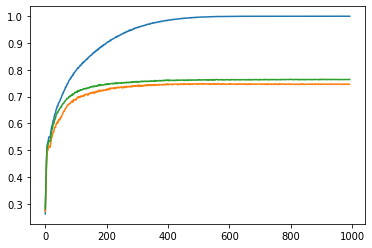

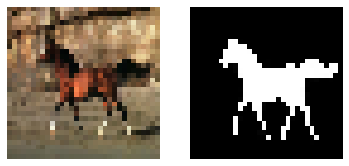

Epoch 994, Loss: 0.00258, IOU - Train: 1.0 Test: 0.762


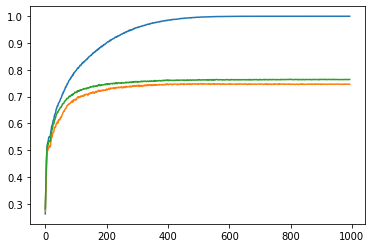

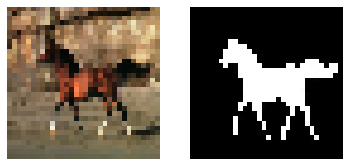

Epoch 995, Loss: 0.00281, IOU - Train: 1.0 Test: 0.762


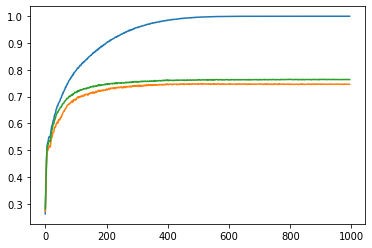

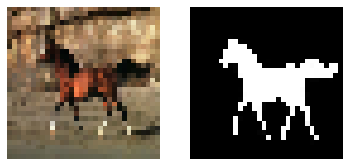

Epoch 996, Loss: 0.00268, IOU - Train: 1.0 Test: 0.762


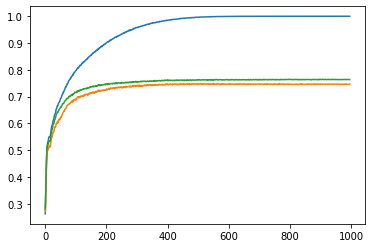

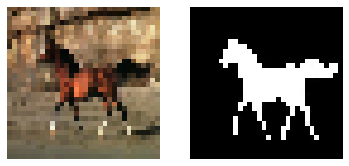

Epoch 997, Loss: 0.00264, IOU - Train: 1.0 Test: 0.762


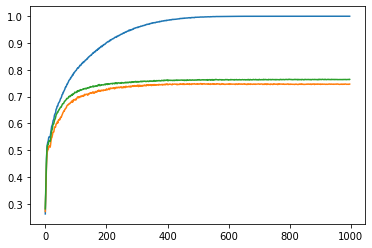

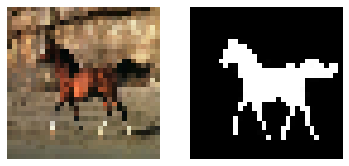

Epoch 998, Loss: 0.00268, IOU - Train: 1.0 Test: 0.762


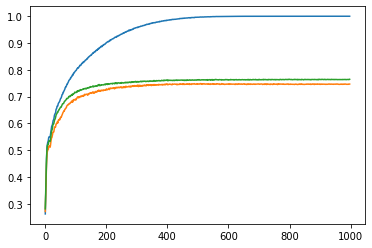

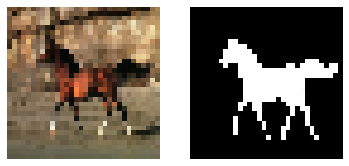

Epoch 999, Loss: 0.00283, IOU - Train: 1.0 Test: 0.762


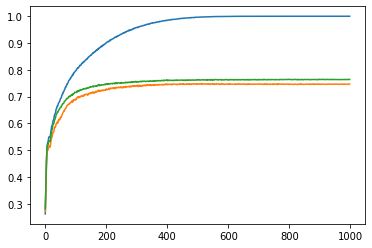

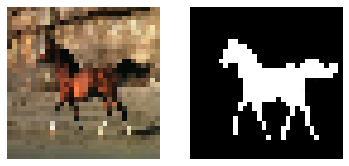

In [ ]:
model = CVAE(2, encoder, decoder)
train_iou = []
val_iou = []
test_iou = []
epoch = 1
best_val_iou = -1
best_test_iou = -1

max_epoch = 1000

# for each image, convert it to greyscale by diving 255 and then using the decoder 
# to predict labels using the input image and label
# doing this operation for all images
def predict_labels(x, y):
    predictions = np.squeeze(np.array([model.predict(x[i].reshape(1, -1)/255, y[i].reshape(1, -1)) for i in range(x.shape[0])]), 
                             axis=1)
    return predictions

while epoch < max_epoch:
    loss = 0.0
    for batch in train_dataset:
        xbatch = batch[:,:image_size*image_size*3]/255
        ybatch = batch[:,image_size*image_size*3:]
        xbatch = tf.cast(xbatch, tf.float32)
        ybatch = tf.cast(ybatch, tf.float32)
        loss += model.train_step(xbatch, ybatch)['elbo']
    
    ydata_pred = predict_labels(xdata, ydata)
    yval_pred = predict_labels(xval, yval)
    ytest_pred = predict_labels(xtest, ytest)
    
    train_iou.append(iou(ydata, ydata_pred))
    val_iou.append(iou(yval, yval_pred))
    test_iou.append(iou(ytest, ytest_pred))

    if val_iou[-1] > best_val_iou:
        best_test_iou = test_iou[-1]
        best_val_iou = val_iou[-1]
        display.clear_output(wait=False)

    print("Epoch {}, Loss: {:0.3}, IOU - Train: {:0.3} Test: {:0.3}".format(epoch, loss.numpy(), train_iou[-1], best_test_iou))

    fig, ax = plt.subplots(1,1)
    pd.Series(train_iou).plot(ax=ax)
    pd.Series(val_iou).plot(ax=ax)
    pd.Series(test_iou).plot(ax=ax)
    fig.canvas.draw()
    
    draw(xdata[0], ydata_pred[0])
    
    epoch += 1

In [ ]:
# using every greyscal image and its label to predict the label in test set
ypred = np.squeeze(np.array([model.predict(xtest[i].reshape(1, -1)/255, ytest[i].reshape(1, -1)) for i in range(xtest.shape[0])]), 
                            axis=1)

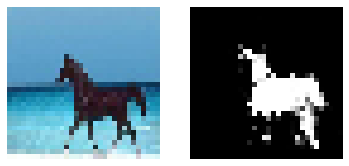

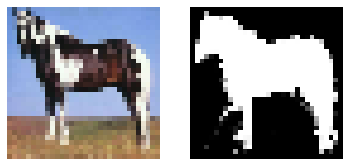

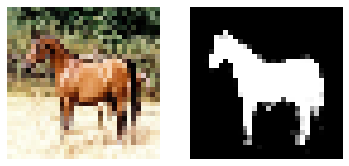

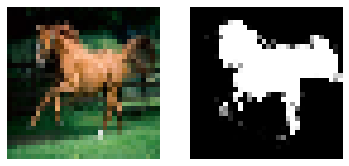

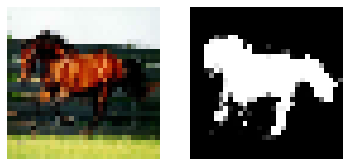

...

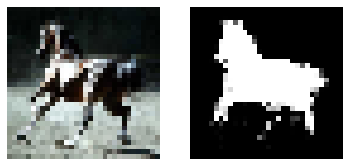

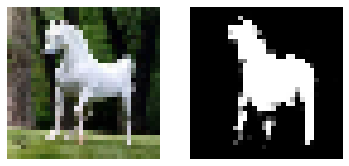

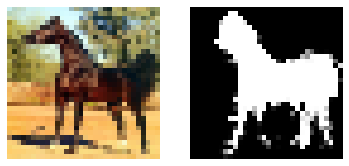

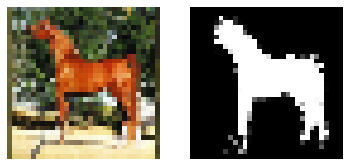

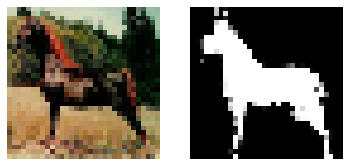

In [ ]:
# first 20 images in test set
for ind in range(20):
    draw(xtest[ind], ypred[ind])

In [ ]:
iou(ytest, ypred)

0.7640942845944719

In [ ]:
encoder.save('encoder_horse')
decoder.save('decoder_horse')

Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
INFO:tensorflow:Assets written to: encoder_horse\assets
INFO:tensorflow:Assets written to: decoder_horse\assets


<h2> Some interesting visualizations </h2>

In [ ]:
# loading saved model
encoder = keras.models.load_model('encoder_horse')
decoder = keras.models.load_model('decoder_horse')
print("\nVAE model loaded...")


VAE model loaded...


Below is a plot of the CVAE latent space for all the horse images in the test set. As we can see, each data point on both these plots indicates a different horse image's mean and variance value respectively. Its interesting to see that all horse values are mostly clustered around 0, which is the center point of the cluster. The color intensity inidcates the mean and variance value ranges for each horse. Similar featured horses are predicted to be more near the center of the cluster, while the images which are more unique act as outliers. From this plot, we can pick horses which are similar into a single class while the outliers can be broken down into a second class. I believe this is useful in selecting anomolies in a dataset.

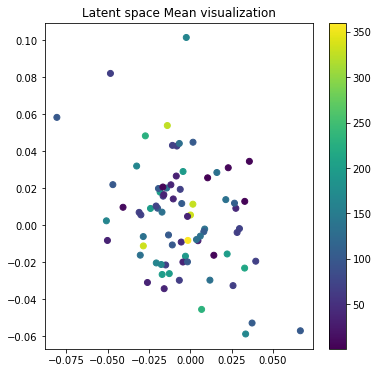

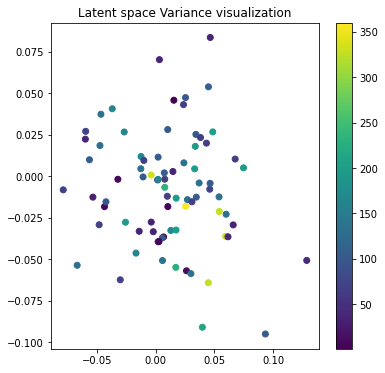

In [ ]:
# Plot of the horse in the latent space mean values
batch_size = 64
te_latent, _, _ = encoder.predict([xtest/255, ytest], batch_size=batch_size)
plt.figure(figsize=(6, 6))
plt.scatter(te_latent[:, 0], te_latent[:, 1], c=np.argmax(ytest, axis=1))
plt.title('Latent space Mean visualization')
plt.colorbar()
plt.show()

# Plot of the horse in the latent space variance values
_, te_latent, _ = encoder.predict([xtest/255, ytest], batch_size=batch_size)
plt.figure(figsize=(6, 6))
plt.scatter(te_latent[:, 0], te_latent[:, 1], c=np.argmax(ytest, axis=1))
plt.title('Latent space Variance visualization')
plt.colorbar()
plt.show()

In the below visualizations, we explore the effect of change in z-sample mean and variance on each image. For reference, a real test set label is given to the decoder along with a randomly inputted mean and variance values in the latent dimension. In each case, a change in mean and variance individually is showed along with their generated predictions. As we can see, even with changing the values, there seems to be very less perturbation in the predicted labels, indicating a strong robustness of the trained model.

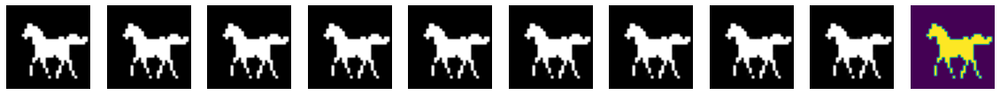

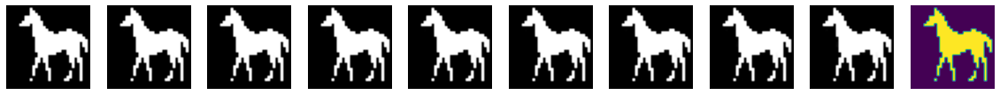

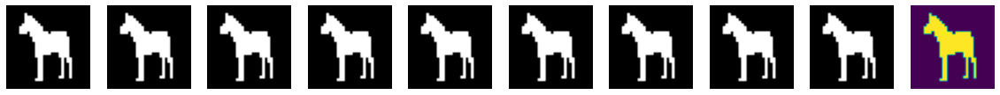

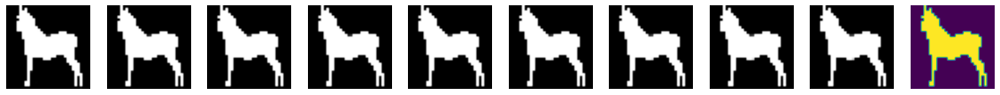

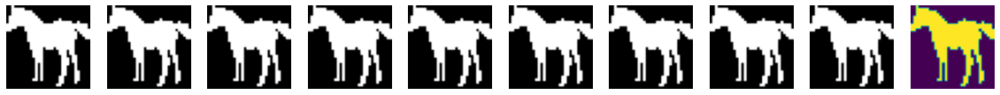

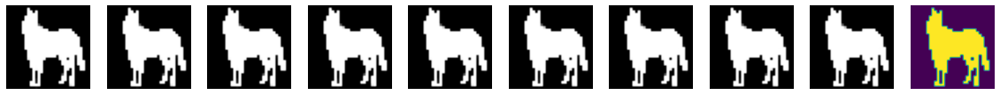

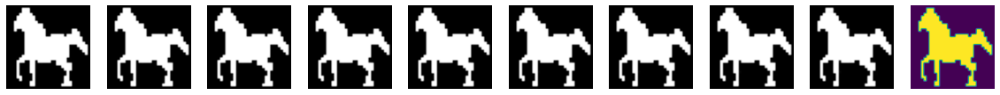

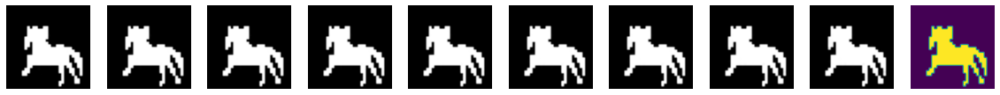

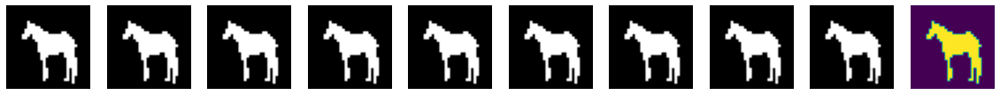

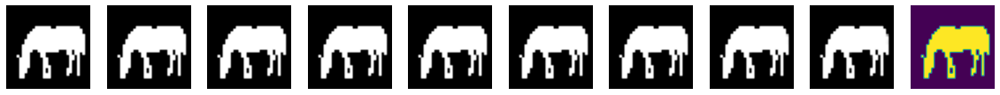

In [ ]:
# exploring the latent space: change z sample on the x-axis
for cond_num in range(10):
    condition_num = ydata[cond_num].reshape(1, -1)
    plt.figure(figsize=(20, 2))

    for i in range(10):
        z_sample = np.array([[5*i, 0.]])
        x_decoded = decoder.predict([z_sample, condition_num])
        horse = x_decoded[0].reshape(image_size, image_size, 1)
        
        plt.subplot(1, 10, i+1)
        plt.axis('off')
        plt.imshow(horse, cmap='Greys_r',)
        
    plt.imshow(ydata[cond_num].reshape(32, 32, 1))

plt.show()

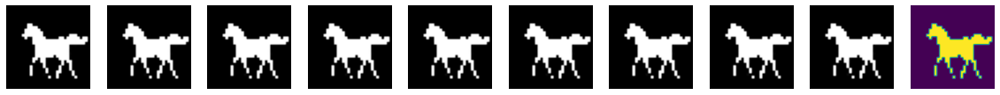

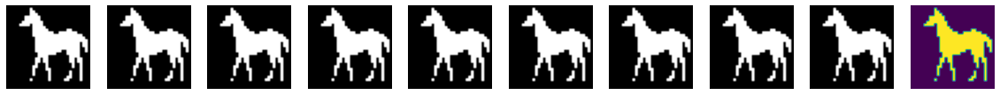

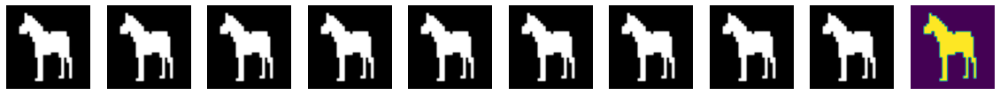

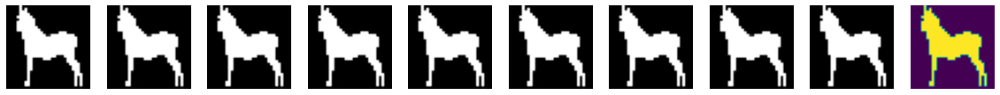

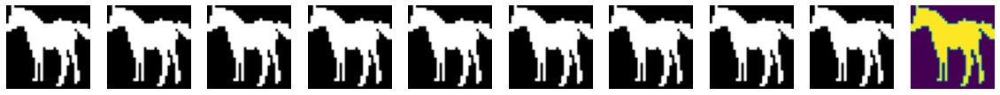

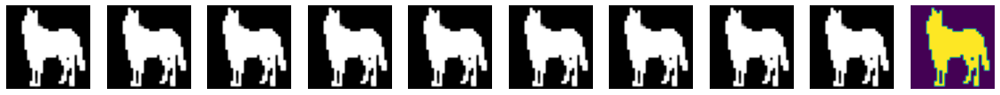

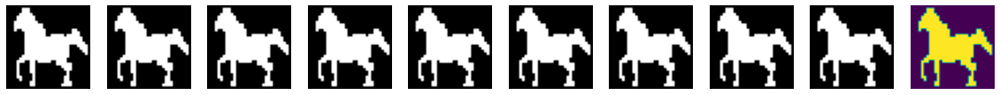

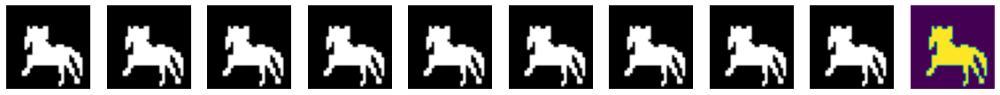

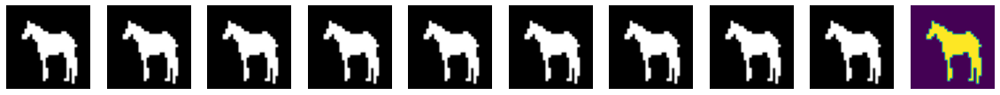

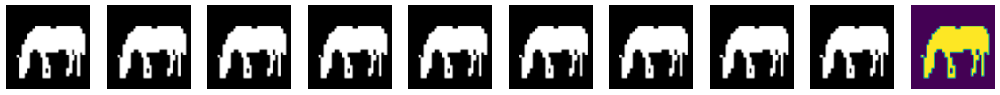

In [ ]:
# exploring the latent space: change z sample on the y-axis
for cond_num in range(10):
    condition_num = ydata[cond_num].reshape(1,-1)
    
    plt.figure(figsize=(20, 2))
    for i in range(10):
        z_sample = np.array([[0., 2*i]])
        x_decoded = decoder.predict([z_sample, condition_num])
        horse = x_decoded[0].reshape(image_size, image_size, 1)
        
        plt.subplot(1, 10, i+1)
        plt.axis('off')
        plt.imshow(horse, cmap='Greys_r',)
        
    plt.imshow(ydata[cond_num].reshape(32, 32, 1))

plt.show()